In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
df = pd.read_csv('txr_1.csv')

In [3]:
examsttns = df['EXAMSTTN'].value_counts()
for i,j in examsttns.items():
    print(f'{i} : {j}')

DDU : 9553
BLEY : 7087
NKJ : 6594
GD : 5472
BSL : 4854
GIMY : 4095
STA : 3772
RYD : 3711
ICDD : 3680
TICD : 3574
SMP : 3100
KRCA : 3041
BNDM : 2804
FL : 2593
NJPT : 2492
KJGY : 2446
HAPA : 2372
BKEY : 2343
ADTP : 2312
KTTY : 2287
NGCT : 2150
RDM : 2021
BKDC : 1971
BZA : 1875
GY : 1834
BPA : 1815
BRWD : 1813
PTRU : 1811
PRDP : 1677
BJE : 1651
PEH : 1573
DBEC : 1536
OBR : 1480
PKR : 1399
TNPM : 1376
EMTY : 1330
COA : 1272
MLDT : 1271
OEC : 1242
BIA : 1196
SSB : 1180
JSWT : 1169
NHYD : 1148
GMC : 1145
UDLU : 1138
DICD : 1136
NBQY : 1135
HPT : 1075
JTJ : 1070
SGWF : 1063
SMYD : 1062
GHZ : 1062
JUC : 1052
FPY : 1044
PLPC : 1036
UMB : 994
BTI : 991
MRJ : 959
JSWD : 952
BAD : 944
NPRY : 941
DPS : 911
NLPD : 876
NATD : 868
DKJ : 803
ED : 793
WDD : 782
DD : 727
MXA : 721
SNF : 702
ETYD : 654
KLMG : 640
CTKR : 612
TKD : 607
AJNI : 586
LDH : 577
MKPP : 566
REJN : 554
BTTR : 544
CCJS : 530
PGFS : 530
GDGH : 521
CT : 518
MVN : 515
ET : 499
ADRA : 494
IPN : 493
MLPM : 493
CP : 488
JMP : 483
UTCM : 4

## SMP Exam Station - EDA

In [4]:
smp = df[df['EXAMSTTN'] == 'SMP'].copy()
smp.count()

RDATE            3100
RAKETYPE         3100
EXAMSTTN         3100
ZONE             3100
ARVLTIME         3100
PLCTTIME         3100
RELSTIME         3100
DPRTTIME         3100
AR_TO_PL         3100
PL_TO_RL         3100
RL_TO_DP         3100
TOTAL_TIME       3100
R_DATEOFMONTH    3100
R_MONTH          3100
R_DAYOFWEEK      3100
R_WEEK           3100
ARVL_H           3100
PLCT_H           3100
RELS_H           3100
DPRT_H           3100
dtype: int64

In [5]:
smp.nunique()

RDATE             364
RAKETYPE            8
EXAMSTTN            1
ZONE                1
ARVLTIME         3027
PLCTTIME         3044
RELSTIME         3040
DPRTTIME         3056
AR_TO_PL          539
PL_TO_RL          178
RL_TO_DP          661
TOTAL_TIME       1121
R_DATEOFMONTH     364
R_MONTH            12
R_DAYOFWEEK         7
R_WEEK             53
ARVL_H             24
PLCT_H             24
RELS_H             24
DPRT_H             24
dtype: int64

In [6]:
smp.head()

,RDATE,RAKETYPE,EXAMSTTN,ZONE,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,R_DAYOFWEEK,R_WEEK,ARVL_H,PLCT_H,RELS_H,DPRT_H
340,2024-04-01,BOXN,SMP,WR,2024-04-01 21:00:00,2024-04-01 21:00:00,2024-04-01 21:00:00,2024-04-01 21:05:00,0,0,5,5,2024-04-01,2024-04,0,W-14-2024,21,21,21,21
341,2024-04-01,BOXNHL,SMP,WR,2024-03-31 21:37:00,2024-03-31 22:50:00,2024-04-01 05:15:00,2024-04-01 06:48:00,73,385,93,551,2024-04-01,2024-04,0,W-14-2024,21,22,5,6
342,2024-04-01,BCN,SMP,WR,2024-03-31 16:00:00,2024-04-01 08:20:00,2024-04-01 08:20:00,2024-04-01 11:05:00,980,0,165,1145,2024-04-01,2024-04,0,W-14-2024,16,8,8,11
343,2024-04-01,BCN,SMP,WR,2024-04-01 00:12:00,2024-04-01 00:20:00,2024-04-01 05:25:00,2024-04-01 12:30:00,8,305,425,738,2024-04-01,2024-04,0,W-14-2024,0,0,5,12
344,2024-04-01,BCNHL,SMP,WR,2024-04-01 10:30:00,2024-04-01 10:30:00,2024-04-01 10:30:00,2024-04-01 10:35:00,0,0,5,5,2024-04-01,2024-04,0,W-14-2024,10,10,10,10


In [7]:
print(smp['RAKETYPE'].nunique())
smp['RAKETYPE'].value_counts()

8


RAKETYPE
BCN          1903
BCNHL         551
BOXN          296
BOXNHL        242
BCNAHSM1       95
BOXNHL25T       9
MBOXN           2
BCFCM           2
Name: count, dtype: int64

In [8]:
print(smp['ZONE'].nunique())
smp['ZONE'].value_counts()

1


ZONE
WR    3100
Name: count, dtype: int64

#### New Features

In [9]:
df1 = smp.copy()

In [10]:
df1 = df1.sort_values(by='ARVLTIME').reset_index(drop=True)

In [11]:
df1['ARVLTIME'] = pd.to_datetime(df1['ARVLTIME'], format='%Y-%m-%d %H:%M:%S')
df1['PLCTTIME'] = pd.to_datetime(df1['PLCTTIME'], format='%Y-%m-%d %H:%M:%S')
df1['RELSTIME'] = pd.to_datetime(df1['RELSTIME'], format='%Y-%m-%d %H:%M:%S')
df1['DPRTTIME'] = pd.to_datetime(df1['DPRTTIME'], format='%Y-%m-%d %H:%M:%S')

In [12]:
df1

,RDATE,RAKETYPE,EXAMSTTN,ZONE,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,R_DAYOFWEEK,R_WEEK,ARVL_H,PLCT_H,RELS_H,DPRT_H
0,2024-04-01,BCN,SMP,WR,2024-03-31 16:00:00,2024-04-01 08:20:00,2024-04-01 08:20:00,2024-04-01 11:05:00,980,0,165,1145,2024-04-01,2024-04,0,W-14-2024,16,8,8,11
1,2024-04-01,BOXN,SMP,WR,2024-03-31 18:40:00,2024-03-31 18:40:00,2024-03-31 23:00:00,2024-04-01 01:49:00,0,260,169,429,2024-04-01,2024-04,0,W-14-2024,18,18,23,1
2,2024-04-01,BCN,SMP,WR,2024-03-31 21:35:00,2024-03-31 21:35:00,2024-03-31 21:35:00,2024-04-01 01:45:00,0,0,250,250,2024-04-01,2024-04,0,W-14-2024,21,21,21,1
3,2024-04-01,BOXNHL,SMP,WR,2024-03-31 21:37:00,2024-03-31 22:50:00,2024-04-01 05:15:00,2024-04-01 06:48:00,73,385,93,551,2024-04-01,2024-04,0,W-14-2024,21,22,5,6
4,2024-04-01,BCN,SMP,WR,2024-04-01 00:12:00,2024-04-01 00:20:00,2024-04-01 05:25:00,2024-04-01 12:30:00,8,305,425,738,2024-04-01,2024-04,0,W-14-2024,0,0,5,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3095,2025-03-31,BCNHL,SMP,WR,2025-03-31 05:05:00,2025-03-31 05:05:00,2025-03-31 16:00:00,2025-03-31 20:40:00,0,655,280,935,2025-03-31,2025-03,0,W-14-2025,5,5,16,20
3096,2025-03-31,BCN,SMP,WR,2025-03-31 06:40:00,2025-03-31 10:00:00,2025-03-31 14:40:00,2025-03-31 16:50:00,200,280,130,610,2025-03-31,2025-03,0,W-14-2025,6,10,14,16
3097,2025-03-31,BOXN,SMP,WR,2025-03-31 07:35:00,2025-03-31 13:40:00,2025-03-31 13:40:00,2025-03-31 13:41:00,365,0,1,366,2025-03-31,2025-03,0,W-14-2025,7,13,13,13
3098,2025-03-31,BOXN,SMP,WR,2025-03-31 07:50:00,2025-03-31 08:05:00,2025-03-31 11:55:00,2025-03-31 14:19:00,15,230,144,389,2025-03-31,2025-03,0,W-14-2025,7,8,11,14


In [13]:
# Count of rakes in shunting time (AR_TO_PL) when the current rake arrives
# Shunting time for a rake is from its ARVLTIME to its PLCTTIME

num_rakes_shunting = []
for i, current_rake in df1.iterrows():
    current_arrival_time = current_rake['ARVLTIME']
        
    # Count rakes that have arrived BEFORE or AT current_arrival_time
    # AND whose placement time is AFTER current_arrival_time
    # (meaning they are still in shunting phase)
    # Exclude the current rake itself from the count if its ARVLTIME == current_arrival_time
        
    # Filter for rakes whose shunting period overlaps with the current_arrival_time
    # A rake is in shunting if current_arrival_time is between its ARVLTIME and PLCTTIME
        
    # Filter rakes that started shunting before or at the current rake's arrival time
    potential_rakes = df1[(df1['ARVLTIME'] <= current_arrival_time) & (df1.index != i)]
        
    # From those, count how many are still in shunting phase (their PLCTTIME is in the future relative to current_arrival_time)
    count = potential_rakes[potential_rakes['PLCTTIME'] > current_arrival_time].shape[0]
    num_rakes_shunting.append(count)
df1['Num_Rakes_Shunting_At_ARVL'] = num_rakes_shunting

In [14]:
df1[['ARVLTIME', 'PLCTTIME', 'Num_Rakes_Shunting_At_ARVL']]

,ARVLTIME,PLCTTIME,Num_Rakes_Shunting_At_ARVL
0,2024-03-31 16:00:00,2024-04-01 08:20:00,0
1,2024-03-31 18:40:00,2024-03-31 18:40:00,1
2,2024-03-31 21:35:00,2024-03-31 21:35:00,1
3,2024-03-31 21:37:00,2024-03-31 22:50:00,1
4,2024-04-01 00:12:00,2024-04-01 00:20:00,1
...,...,...,...
3095,2025-03-31 05:05:00,2025-03-31 05:05:00,0
3096,2025-03-31 06:40:00,2025-03-31 10:00:00,0
3097,2025-03-31 07:35:00,2025-03-31 13:40:00,1
3098,2025-03-31 07:50:00,2025-03-31 08:05:00,2


In [15]:
# Count of rakes in examination time (PL_TO_RL) when the current rake arrives
# Examination time for a rake is from its PLCTTIME to its RELSTIME

num_rakes_exam = []
for i, current_rake in df1.iterrows():
    current_arrival_time = current_rake['ARVLTIME']
        
    # Count rakes that have been placed BEFORE or AT current_arrival_time
    # AND whose release time is AFTER current_arrival_time
    # (meaning they are still in examination phase)
            
    potential_rakes = df1[(df1['PLCTTIME'] <= current_arrival_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['RELSTIME'] > current_arrival_time].shape[0]
    num_rakes_exam.append(count)
df1['Num_Rakes_Exam_At_ARVL'] = num_rakes_exam

In [16]:
df1[['ARVLTIME', 'PLCTTIME', 'RELSTIME', 'Num_Rakes_Exam_At_ARVL']]

,ARVLTIME,PLCTTIME,RELSTIME,Num_Rakes_Exam_At_ARVL
0,2024-03-31 16:00:00,2024-04-01 08:20:00,2024-04-01 08:20:00,0
1,2024-03-31 18:40:00,2024-03-31 18:40:00,2024-03-31 23:00:00,0
2,2024-03-31 21:35:00,2024-03-31 21:35:00,2024-03-31 21:35:00,1
3,2024-03-31 21:37:00,2024-03-31 22:50:00,2024-04-01 05:15:00,1
4,2024-04-01 00:12:00,2024-04-01 00:20:00,2024-04-01 05:25:00,1
...,...,...,...,...
3095,2025-03-31 05:05:00,2025-03-31 05:05:00,2025-03-31 16:00:00,1
3096,2025-03-31 06:40:00,2025-03-31 10:00:00,2025-03-31 14:40:00,1
3097,2025-03-31 07:35:00,2025-03-31 13:40:00,2025-03-31 13:40:00,1
3098,2025-03-31 07:50:00,2025-03-31 08:05:00,2025-03-31 11:55:00,1


In [17]:
# Count of rakes in departure time (RL_TO_DP) when the current rake arrives
# Departure time for a rake is from its RELSTIME to its DPRTTIME

num_rakes_departure = []
for i, current_rake in df1.iterrows():
    current_arrival_time = current_rake['ARVLTIME']
        
    # Count rakes that have been released BEFORE or AT current_arrival_time
    # AND whose departure time is AFTER current_arrival_time
    # (meaning they are still in departure phase)
        
    potential_rakes = df1[(df1['RELSTIME'] <= current_arrival_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['DPRTTIME'] > current_arrival_time].shape[0]
    num_rakes_departure.append(count)
df1['Num_Rakes_Departure_At_ARVL'] = num_rakes_departure

In [18]:
df1[['ARVLTIME', 'RELSTIME', 'DPRTTIME', 'Num_Rakes_Departure_At_ARVL']]

,ARVLTIME,RELSTIME,DPRTTIME,Num_Rakes_Departure_At_ARVL
0,2024-03-31 16:00:00,2024-04-01 08:20:00,2024-04-01 11:05:00,0
1,2024-03-31 18:40:00,2024-03-31 23:00:00,2024-04-01 01:49:00,0
2,2024-03-31 21:35:00,2024-03-31 21:35:00,2024-04-01 01:45:00,0
3,2024-03-31 21:37:00,2024-04-01 05:15:00,2024-04-01 06:48:00,1
4,2024-04-01 00:12:00,2024-04-01 05:25:00,2024-04-01 12:30:00,2
...,...,...,...,...
3095,2025-03-31 05:05:00,2025-03-31 16:00:00,2025-03-31 20:40:00,1
3096,2025-03-31 06:40:00,2025-03-31 14:40:00,2025-03-31 16:50:00,1
3097,2025-03-31 07:35:00,2025-03-31 13:40:00,2025-03-31 13:41:00,1
3098,2025-03-31 07:50:00,2025-03-31 11:55:00,2025-03-31 14:19:00,1


In [19]:
num_rakes_exam_at_placement = []
for i, current_rake in df1.iterrows():
    current_placement_time = current_rake['PLCTTIME']
        
    # Identifying other rakes that are in their examination phase at this 'current_placement_time'.
    # A rake 'other_rake' is in examination if:
    # 1. Its placement time (start of exam) is less than or equal to 'current_placement_time'.
    # 2. Its release time (end of exam) is greater than 'current_placement_time'.
    # 3. It is not the 'current_rake' itself (by index).
        
    potential_rakes = df1[(df1['PLCTTIME'] <= current_placement_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['RELSTIME'] > current_placement_time].shape[0]
    num_rakes_exam_at_placement.append(count)
        
df1['Num_Rakes_Exam_At_PLCT'] = num_rakes_exam_at_placement

In [20]:
df1[['ARVLTIME', 'PLCTTIME', 'RELSTIME', 'DPRTTIME', 'Num_Rakes_Exam_At_PLCT']]

,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,Num_Rakes_Exam_At_PLCT
0,2024-03-31 16:00:00,2024-04-01 08:20:00,2024-04-01 08:20:00,2024-04-01 11:05:00,1
1,2024-03-31 18:40:00,2024-03-31 18:40:00,2024-03-31 23:00:00,2024-04-01 01:49:00,0
2,2024-03-31 21:35:00,2024-03-31 21:35:00,2024-03-31 21:35:00,2024-04-01 01:45:00,1
3,2024-03-31 21:37:00,2024-03-31 22:50:00,2024-04-01 05:15:00,2024-04-01 06:48:00,1
4,2024-04-01 00:12:00,2024-04-01 00:20:00,2024-04-01 05:25:00,2024-04-01 12:30:00,1
...,...,...,...,...,...
3095,2025-03-31 05:05:00,2025-03-31 05:05:00,2025-03-31 16:00:00,2025-03-31 20:40:00,1
3096,2025-03-31 06:40:00,2025-03-31 10:00:00,2025-03-31 14:40:00,2025-03-31 16:50:00,2
3097,2025-03-31 07:35:00,2025-03-31 13:40:00,2025-03-31 13:40:00,2025-03-31 13:41:00,2
3098,2025-03-31 07:50:00,2025-03-31 08:05:00,2025-03-31 11:55:00,2025-03-31 14:19:00,1


In [21]:
# Count of rakes in departure time (RL_TO_DP) when the current rake is in its examination time
# This means, for a current rake (i), count others that are in RL_TO_DP phase
# at the current rake's PLCTTIME (start of examination) or RELSTIME (end of examination, start of departure phase)
# The request states "at the point of time when the current rakes is in their examination time".
# Let's interpret this as the *start* of the current rake's examination, which is PLCTTIME, as it's a fixed point.

num_rakes_departure_at_placement = []
for i, current_rake in df1.iterrows():
    current_placement_time = current_rake['PLCTTIME']
        
    # Count rakes that have been released BEFORE or AT current_placement_time
    # AND whose departure time is AFTER current_placement_time
    # (meaning they are still in departure phase)
    # Exclude the current rake itself if its RELSTIME or DPRTTIME overlap (though unlikely here)
        
    potential_rakes = df1[(df1['RELSTIME'] <= current_placement_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['DPRTTIME'] > current_placement_time].shape[0]
    num_rakes_departure_at_placement.append(count)
df1['Num_Rakes_Departure_At_PLCT'] = num_rakes_departure_at_placement

In [22]:
df1[['ARVLTIME', 'PLCTTIME', 'RELSTIME', 'DPRTTIME', 'Num_Rakes_Departure_At_PLCT']]

,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,Num_Rakes_Departure_At_PLCT
0,2024-03-31 16:00:00,2024-04-01 08:20:00,2024-04-01 08:20:00,2024-04-01 11:05:00,2
1,2024-03-31 18:40:00,2024-03-31 18:40:00,2024-03-31 23:00:00,2024-04-01 01:49:00,0
2,2024-03-31 21:35:00,2024-03-31 21:35:00,2024-03-31 21:35:00,2024-04-01 01:45:00,0
3,2024-03-31 21:37:00,2024-03-31 22:50:00,2024-04-01 05:15:00,2024-04-01 06:48:00,1
4,2024-04-01 00:12:00,2024-04-01 00:20:00,2024-04-01 05:25:00,2024-04-01 12:30:00,2
...,...,...,...,...,...
3095,2025-03-31 05:05:00,2025-03-31 05:05:00,2025-03-31 16:00:00,2025-03-31 20:40:00,1
3096,2025-03-31 06:40:00,2025-03-31 10:00:00,2025-03-31 14:40:00,2025-03-31 16:50:00,0
3097,2025-03-31 07:35:00,2025-03-31 13:40:00,2025-03-31 13:40:00,2025-03-31 13:41:00,1
3098,2025-03-31 07:50:00,2025-03-31 08:05:00,2025-03-31 11:55:00,2025-03-31 14:19:00,1


In [23]:
num_rakes_departure_at_release = []
for i, current_rake in df1.iterrows():
    current_release_time = current_rake['RELSTIME']
        
    # Identifying other rakes that are in their departure phase at this 'current_release_time'.
    # A rake 'other_rake' is in departure if:
    # 1. Its release time (start of departure) is less than or equal to 'current_release_time'.
    # 2. Its departure time (end of departure) is greater than 'current_release_time'.
    # 3. It is not the 'current_rake' itself (by index).
        
    potential_rakes = df1[(df1['RELSTIME'] <= current_release_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['DPRTTIME'] > current_release_time].shape[0]
    num_rakes_departure_at_release.append(count)
        
df1['Num_Rakes_Departure_At_RELS'] = num_rakes_departure_at_release

In [24]:
df1[['ARVLTIME', 'PLCTTIME', 'RELSTIME', 'DPRTTIME', 'Num_Rakes_Departure_At_RELS']]

,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,Num_Rakes_Departure_At_RELS
0,2024-03-31 16:00:00,2024-04-01 08:20:00,2024-04-01 08:20:00,2024-04-01 11:05:00,2
1,2024-03-31 18:40:00,2024-03-31 18:40:00,2024-03-31 23:00:00,2024-04-01 01:49:00,1
2,2024-03-31 21:35:00,2024-03-31 21:35:00,2024-03-31 21:35:00,2024-04-01 01:45:00,0
3,2024-03-31 21:37:00,2024-03-31 22:50:00,2024-04-01 05:15:00,2024-04-01 06:48:00,0
4,2024-04-01 00:12:00,2024-04-01 00:20:00,2024-04-01 05:25:00,2024-04-01 12:30:00,1
...,...,...,...,...,...
3095,2025-03-31 05:05:00,2025-03-31 05:05:00,2025-03-31 16:00:00,2025-03-31 20:40:00,1
3096,2025-03-31 06:40:00,2025-03-31 10:00:00,2025-03-31 14:40:00,2025-03-31 16:50:00,0
3097,2025-03-31 07:35:00,2025-03-31 13:40:00,2025-03-31 13:40:00,2025-03-31 13:41:00,1
3098,2025-03-31 07:50:00,2025-03-31 08:05:00,2025-03-31 11:55:00,2025-03-31 14:19:00,1


In [25]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3100 entries, 0 to 3099
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   RDATE                        3100 non-null   object        
 1   RAKETYPE                     3100 non-null   object        
 2   EXAMSTTN                     3100 non-null   object        
 3   ZONE                         3100 non-null   object        
 4   ARVLTIME                     3100 non-null   datetime64[ns]
 5   PLCTTIME                     3100 non-null   datetime64[ns]
 6   RELSTIME                     3100 non-null   datetime64[ns]
 7   DPRTTIME                     3100 non-null   datetime64[ns]
 8   AR_TO_PL                     3100 non-null   int64         
 9   PL_TO_RL                     3100 non-null   int64         
 10  RL_TO_DP                     3100 non-null   int64         
 11  TOTAL_TIME                   3100 non-null 

In [26]:
# Time since last Arrival
df1 = df1.sort_values(by='ARVLTIME').reset_index(drop=True)
df1['Time_Since_Last_ARVL'] = df1.groupby('EXAMSTTN')['ARVLTIME'].diff().dt.total_seconds()//60

In [27]:
# Time since last Placement
df1 = df1.sort_values(by='PLCTTIME').reset_index(drop=True)
df1['Time_Since_Last_PLCT'] = df1.groupby('EXAMSTTN')['PLCTTIME'].diff().dt.total_seconds()//60

In [28]:
df1 = df1.sort_values(by='RELSTIME').reset_index(drop=True)
df1['Time_Since_Last_RELS'] = df1.groupby('EXAMSTTN')['RELSTIME'].diff().dt.total_seconds()//60

In [29]:
df1 = df1.sort_values(by='DPRTTIME').reset_index(drop=True)
df1['Time_Since_Last_DPRT'] = df1.groupby('EXAMSTTN')['DPRTTIME'].diff().dt.total_seconds()//60

In [30]:
df1[['Time_Since_Last_ARVL', 'Time_Since_Last_PLCT', 'Time_Since_Last_RELS', 'Time_Since_Last_DPRT']] = \
    df1[['Time_Since_Last_ARVL', 'Time_Since_Last_PLCT', 'Time_Since_Last_RELS', 'Time_Since_Last_DPRT']].fillna(0)

In [31]:
df1 = df1.sort_values(by='ARVLTIME').reset_index(drop=True)

In [32]:
df1[['ARVLTIME', 'Time_Since_Last_ARVL', 'Time_Since_Last_PLCT', 'Time_Since_Last_RELS', 'Time_Since_Last_DPRT']]

,ARVLTIME,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
0,2024-03-31 16:00:00,0.0,165.0,155.0,30.0
1,2024-03-31 18:40:00,160.0,0.0,85.0,4.0
2,2024-03-31 21:35:00,175.0,175.0,0.0,0.0
3,2024-03-31 21:37:00,2.0,75.0,375.0,299.0
4,2024-04-01 00:12:00,155.0,90.0,10.0,51.0
...,...,...,...,...,...
3095,2025-03-31 05:05:00,530.0,20.0,80.0,230.0
3096,2025-03-31 06:40:00,95.0,115.0,60.0,151.0
3097,2025-03-31 07:35:00,55.0,135.0,105.0,60.0
3098,2025-03-31 07:50:00,15.0,180.0,30.0,38.0


In [33]:
df1.drop(columns=['ARVLTIME','PLCTTIME','RELSTIME','DPRTTIME'], axis=1, inplace=True)

In [34]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3100 entries, 0 to 3099
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   RDATE                        3100 non-null   object 
 1   RAKETYPE                     3100 non-null   object 
 2   EXAMSTTN                     3100 non-null   object 
 3   ZONE                         3100 non-null   object 
 4   AR_TO_PL                     3100 non-null   int64  
 5   PL_TO_RL                     3100 non-null   int64  
 6   RL_TO_DP                     3100 non-null   int64  
 7   TOTAL_TIME                   3100 non-null   int64  
 8   R_DATEOFMONTH                3100 non-null   object 
 9   R_MONTH                      3100 non-null   object 
 10  R_DAYOFWEEK                  3100 non-null   int64  
 11  R_WEEK                       3100 non-null   object 
 12  ARVL_H                       3100 non-null   int64  
 13  PLCT_H            

#### Monthly Analysis

In [35]:
smp_monthly = df1['R_MONTH'].value_counts(sort=False).reset_index()
smp_monthly.columns =['R_MONTH','RAKE_COUNT']
smp_monthly = pd.DataFrame(smp_monthly)

monthly_shunting_time_sum = df1.groupby('R_MONTH', sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
monthly_examination_time_sum = df1.groupby('R_MONTH', sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
monthly_departure_lag_time_sum = df1.groupby('R_MONTH', sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
monthly_numrakes1 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
monthly_numrakes2 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
monthly_numrakes3 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
monthly_numrakes4 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
monthly_numrakes5 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
monthly_numrakes6 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
monthly_timesince1 = df1.groupby('R_MONTH', sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
monthly_timesince2 = df1.groupby('R_MONTH', sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
monthly_timesince3 = df1.groupby('R_MONTH', sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
monthly_timesince4 = df1.groupby('R_MONTH', sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

smp_monthly['AVG_SHUNTING_TIME'] = monthly_shunting_time_sum['Shunting_Time'] / smp_monthly['RAKE_COUNT']
smp_monthly['AVG_EXAMINATION_TIME'] = monthly_examination_time_sum['Examination_Time'] / smp_monthly['RAKE_COUNT']
smp_monthly['AVG_DEPARTURE_TIME'] = monthly_departure_lag_time_sum['Departure_Lag'] / smp_monthly['RAKE_COUNT']
smp_monthly['AVG_Num_Rakes_Shunting_At_ARVL'] = monthly_numrakes1['numrakes1'] / smp_monthly['RAKE_COUNT']
smp_monthly['AVG_Num_Rakes_Exam_At_ARVL'] = monthly_numrakes2['numrakes2'] / smp_monthly['RAKE_COUNT']
smp_monthly['AVG_Num_Rakes_Departure_At_ARVL'] = monthly_numrakes3['numrakes3'] / smp_monthly['RAKE_COUNT']
smp_monthly['AVG_Num_Rakes_Exam_At_PLCT'] = monthly_numrakes4['numrakes4'] / smp_monthly['RAKE_COUNT']
smp_monthly['AVG_Num_Rakes_Departure_At_PLCT'] = monthly_numrakes5['numrakes5'] / smp_monthly['RAKE_COUNT']
smp_monthly['AVG_Num_Rakes_Departure_At_RELS'] = monthly_numrakes6['numrakes6'] / smp_monthly['RAKE_COUNT']
smp_monthly['AVG_Time_Since_Last_ARVL'] = monthly_timesince1['timesince1'] / smp_monthly['RAKE_COUNT']
smp_monthly['AVG_Time_Since_Last_PLCT'] = monthly_timesince2['timesince2'] / smp_monthly['RAKE_COUNT']
smp_monthly['AVG_Time_Since_Last_RELS'] = monthly_timesince3['timesince3'] / smp_monthly['RAKE_COUNT']
smp_monthly['AVG_Time_Since_Last_DPRT'] = monthly_timesince4['timesince4'] / smp_monthly['RAKE_COUNT']

smp_monthly

,R_MONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04,217,43.110599,140.990783,329.308756,0.221198,0.774194,1.580645,0.686636,1.682028,1.571429,200.138249,199.400922,198.594470,197.741935
1,2024-05,243,96.111111,135.740741,256.320988,0.596708,0.716049,1.534979,0.518519,1.683128,1.502058,183.930041,183.930041,183.930041,184.218107
2,2024-06,245,107.902041,141.191837,283.791837,0.624490,0.742857,1.595918,0.640816,1.604082,1.436735,174.183673,173.714286,175.163265,175.020408
3,2024-07,241,74.199170,126.975104,437.879668,0.402490,0.697095,2.489627,0.568465,2.597510,2.460581,186.348548,186.825726,185.352697,185.892116
4,2024-08,260,303.403846,131.873077,318.865385,1.953846,0.665385,1.761538,0.484615,1.819231,1.565385,169.915385,171.019231,171.019231,171.707692
5,2024-09,254,313.708661,151.748031,274.744094,1.606299,0.811024,1.574803,0.657480,1.641732,1.492126,171.185039,170.433071,169.842520,169.787402
6,2024-10,269,315.464684,135.022305,303.914498,1.724907,0.754647,1.892193,0.486989,1.985130,1.758364,164.137546,164.427509,164.130112,166.840149
7,2024-11,249,370.000000,150.232932,441.301205,1.895582,0.738956,2.425703,0.594378,2.353414,2.184739,174.690763,173.991968,175.016064,173.232932
8,2024-12,303,229.221122,151.597360,274.075908,1.551155,0.897690,1.719472,0.755776,1.719472,1.584158,148.250825,148.716172,148.765677,147.376238
9,2025-01,286,179.818182,154.234266,257.559441,1.048951,0.839161,1.541958,0.695804,1.604895,1.468531,154.020979,154.314685,155.468531,155.961538


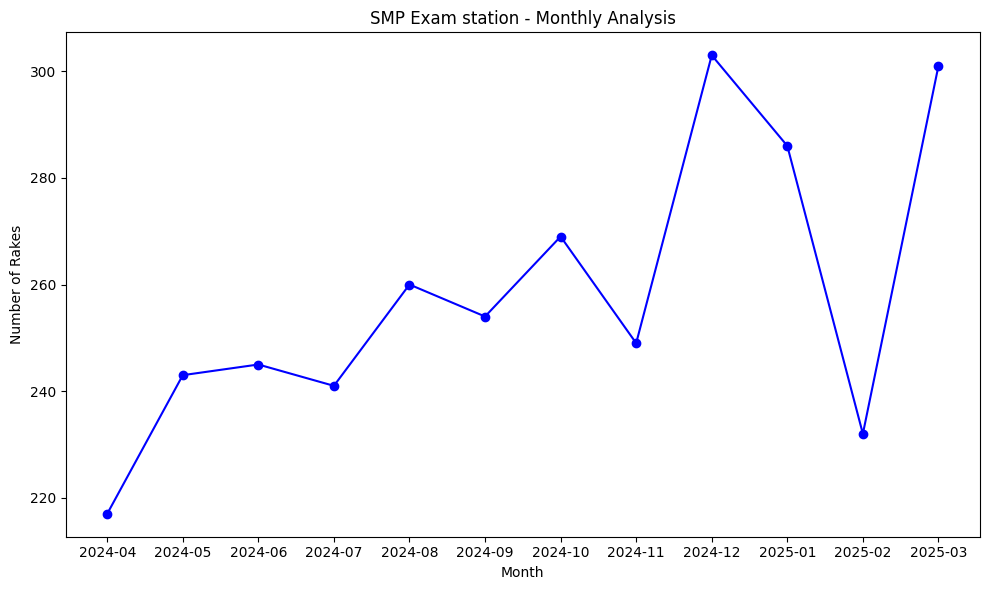

In [36]:
plt.figure(figsize=(10,6))
plt.plot(smp_monthly['R_MONTH'], smp_monthly['RAKE_COUNT'], marker='o', linestyle='-', color='blue')
plt.title('SMP Exam station - Monthly Analysis')
plt.xlabel('Month')
plt.ylabel('Number of Rakes')
plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_13868\658716898.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=smp_monthly['R_MONTH'], y=smp_monthly['AVG_SHUNTING_TIME'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_13868\658716898.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=smp_monthly['R_MONTH'], y=smp_monthly['AVG_EXAMINATION_TIME'], palette='viridis', ax=axes[1, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_13868\658716898.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=smp_monthly

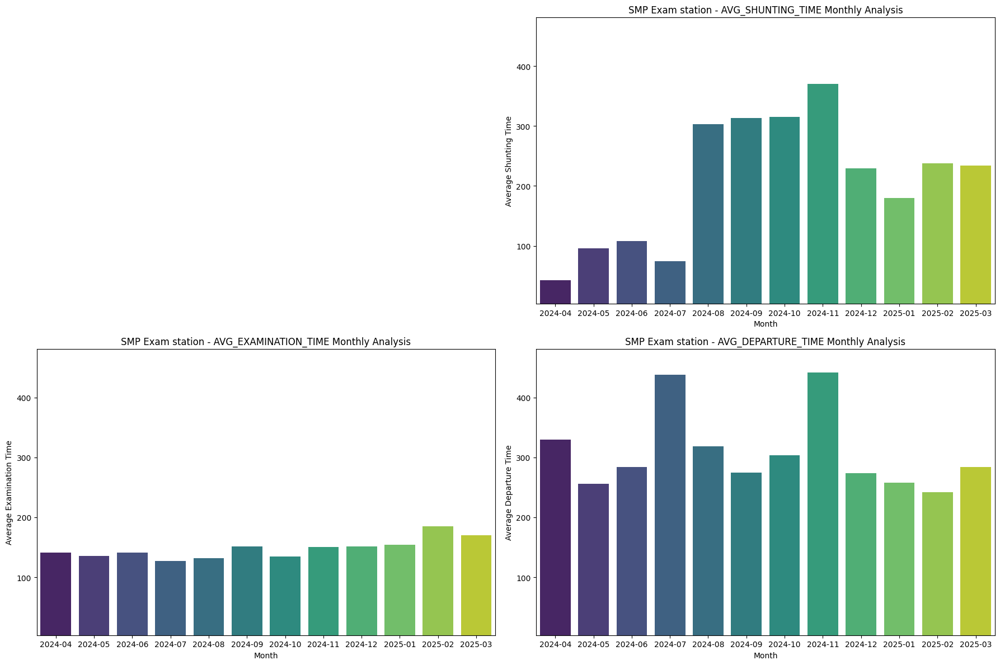

In [37]:
min_y = min(smp_monthly['AVG_SHUNTING_TIME'].min(),
            smp_monthly['AVG_EXAMINATION_TIME'].min(),
            smp_monthly['AVG_DEPARTURE_TIME'].min())

max_y = max(smp_monthly['AVG_SHUNTING_TIME'].max(),
            smp_monthly['AVG_EXAMINATION_TIME'].max(),
            smp_monthly['AVG_DEPARTURE_TIME'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

axes[0, 0].axis('off')

sns.barplot(x=smp_monthly['R_MONTH'], y=smp_monthly['AVG_SHUNTING_TIME'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('SMP Exam station - AVG_SHUNTING_TIME Monthly Analysis')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('Average Shunting Time')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=smp_monthly['R_MONTH'], y=smp_monthly['AVG_EXAMINATION_TIME'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('SMP Exam station - AVG_EXAMINATION_TIME Monthly Analysis')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('Average Examination Time')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=smp_monthly['R_MONTH'], y=smp_monthly['AVG_DEPARTURE_TIME'], palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('SMP Exam station - AVG_DEPARTURE_TIME Monthly Analysis')
axes[1, 1].set_xlabel('Month')
axes[1, 1].set_ylabel('Average Departure Time')
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_13868\2431766998.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=smp_monthly['R_MONTH'], y=smp_monthly['AVG_Num_Rakes_Shunting_At_ARVL'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_13868\2431766998.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=smp_monthly['R_MONTH'], y=smp_monthly['AVG_Num_Rakes_Exam_At_ARVL'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_13868\2431766998.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns

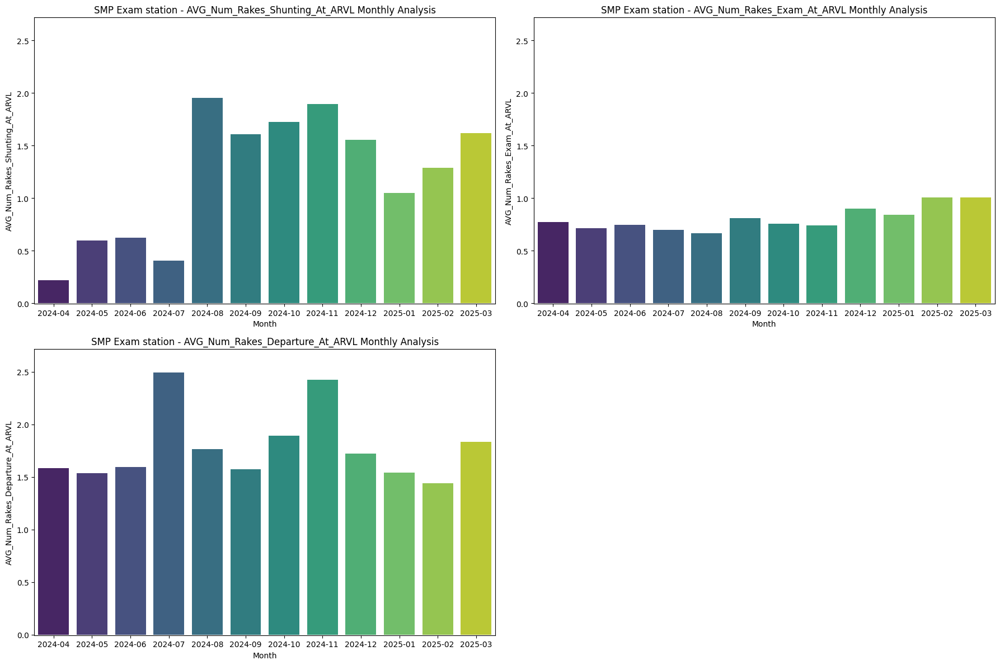

In [38]:
min_y = min(smp_monthly['AVG_Num_Rakes_Shunting_At_ARVL'].min(),
            smp_monthly['AVG_Num_Rakes_Exam_At_ARVL'].min(),
            smp_monthly['AVG_Num_Rakes_Departure_At_ARVL'].min())

max_y = max(smp_monthly['AVG_Num_Rakes_Shunting_At_ARVL'].max(),
            smp_monthly['AVG_Num_Rakes_Exam_At_ARVL'].max(),
            smp_monthly['AVG_Num_Rakes_Departure_At_ARVL'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=smp_monthly['R_MONTH'], y=smp_monthly['AVG_Num_Rakes_Shunting_At_ARVL'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('SMP Exam station - AVG_Num_Rakes_Shunting_At_ARVL Monthly Analysis')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=smp_monthly['R_MONTH'], y=smp_monthly['AVG_Num_Rakes_Exam_At_ARVL'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('SMP Exam station - AVG_Num_Rakes_Exam_At_ARVL Monthly Analysis')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Exam_At_ARVL')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=smp_monthly['R_MONTH'], y=smp_monthly['AVG_Num_Rakes_Departure_At_ARVL'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('SMP Exam station - AVG_Num_Rakes_Departure_At_ARVL Monthly Analysis')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_ARVL')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_13868\4169242208.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=smp_monthly['R_MONTH'], y=smp_monthly['AVG_Num_Rakes_Exam_At_PLCT'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_13868\4169242208.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=smp_monthly['R_MONTH'], y=smp_monthly['AVG_Num_Rakes_Departure_At_PLCT'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_13868\4169242208.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sn

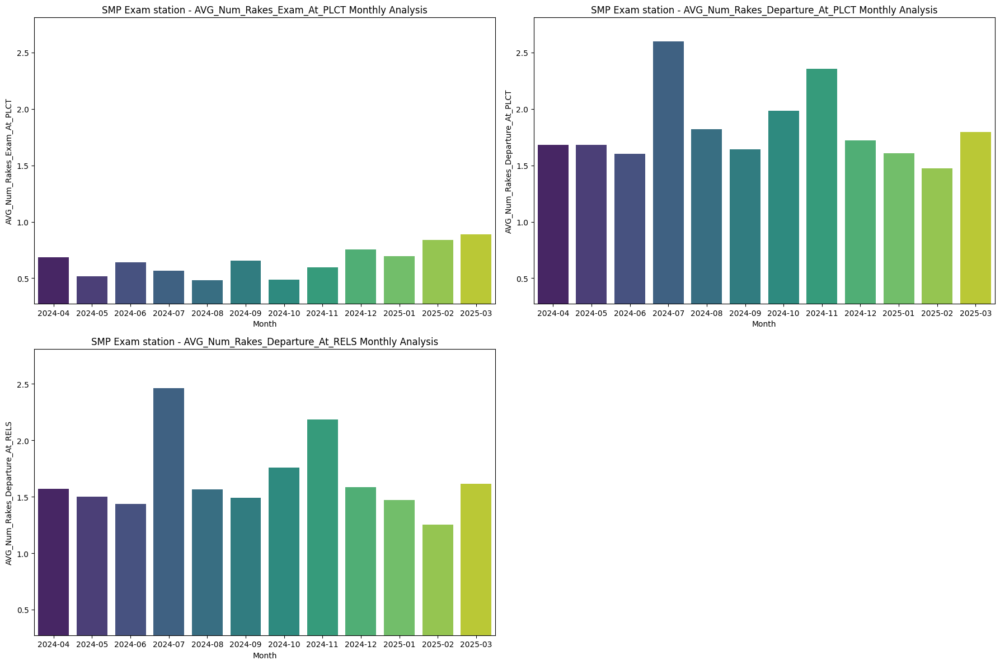

In [39]:
min_y = min(smp_monthly['AVG_Num_Rakes_Exam_At_PLCT'].min(),
            smp_monthly['AVG_Num_Rakes_Departure_At_PLCT'].min(),
            smp_monthly['AVG_Num_Rakes_Departure_At_RELS'].min())

max_y = max(smp_monthly['AVG_Num_Rakes_Exam_At_PLCT'].max(),
            smp_monthly['AVG_Num_Rakes_Departure_At_PLCT'].max(),
            smp_monthly['AVG_Num_Rakes_Departure_At_RELS'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=smp_monthly['R_MONTH'], y=smp_monthly['AVG_Num_Rakes_Exam_At_PLCT'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('SMP Exam station - AVG_Num_Rakes_Exam_At_PLCT Monthly Analysis')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Exam_At_PLCT')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=smp_monthly['R_MONTH'], y=smp_monthly['AVG_Num_Rakes_Departure_At_PLCT'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('SMP Exam station - AVG_Num_Rakes_Departure_At_PLCT Monthly Analysis')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Departure_At_PLCT')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=smp_monthly['R_MONTH'], y=smp_monthly['AVG_Num_Rakes_Departure_At_RELS'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('SMP Exam station - AVG_Num_Rakes_Departure_At_RELS Monthly Analysis')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_RELS')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

In [40]:
smp_monthly

,R_MONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04,217,43.110599,140.990783,329.308756,0.221198,0.774194,1.580645,0.686636,1.682028,1.571429,200.138249,199.400922,198.594470,197.741935
1,2024-05,243,96.111111,135.740741,256.320988,0.596708,0.716049,1.534979,0.518519,1.683128,1.502058,183.930041,183.930041,183.930041,184.218107
2,2024-06,245,107.902041,141.191837,283.791837,0.624490,0.742857,1.595918,0.640816,1.604082,1.436735,174.183673,173.714286,175.163265,175.020408
3,2024-07,241,74.199170,126.975104,437.879668,0.402490,0.697095,2.489627,0.568465,2.597510,2.460581,186.348548,186.825726,185.352697,185.892116
4,2024-08,260,303.403846,131.873077,318.865385,1.953846,0.665385,1.761538,0.484615,1.819231,1.565385,169.915385,171.019231,171.019231,171.707692
5,2024-09,254,313.708661,151.748031,274.744094,1.606299,0.811024,1.574803,0.657480,1.641732,1.492126,171.185039,170.433071,169.842520,169.787402
6,2024-10,269,315.464684,135.022305,303.914498,1.724907,0.754647,1.892193,0.486989,1.985130,1.758364,164.137546,164.427509,164.130112,166.840149
7,2024-11,249,370.000000,150.232932,441.301205,1.895582,0.738956,2.425703,0.594378,2.353414,2.184739,174.690763,173.991968,175.016064,173.232932
8,2024-12,303,229.221122,151.597360,274.075908,1.551155,0.897690,1.719472,0.755776,1.719472,1.584158,148.250825,148.716172,148.765677,147.376238
9,2025-01,286,179.818182,154.234266,257.559441,1.048951,0.839161,1.541958,0.695804,1.604895,1.468531,154.020979,154.314685,155.468531,155.961538


C:\Users\anant\AppData\Local\Temp\ipykernel_13868\663279734.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=smp_monthly['R_MONTH'], y=smp_monthly['AVG_Time_Since_Last_ARVL'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_13868\663279734.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=smp_monthly['R_MONTH'], y=smp_monthly['AVG_Time_Since_Last_PLCT'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_13868\663279734.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=

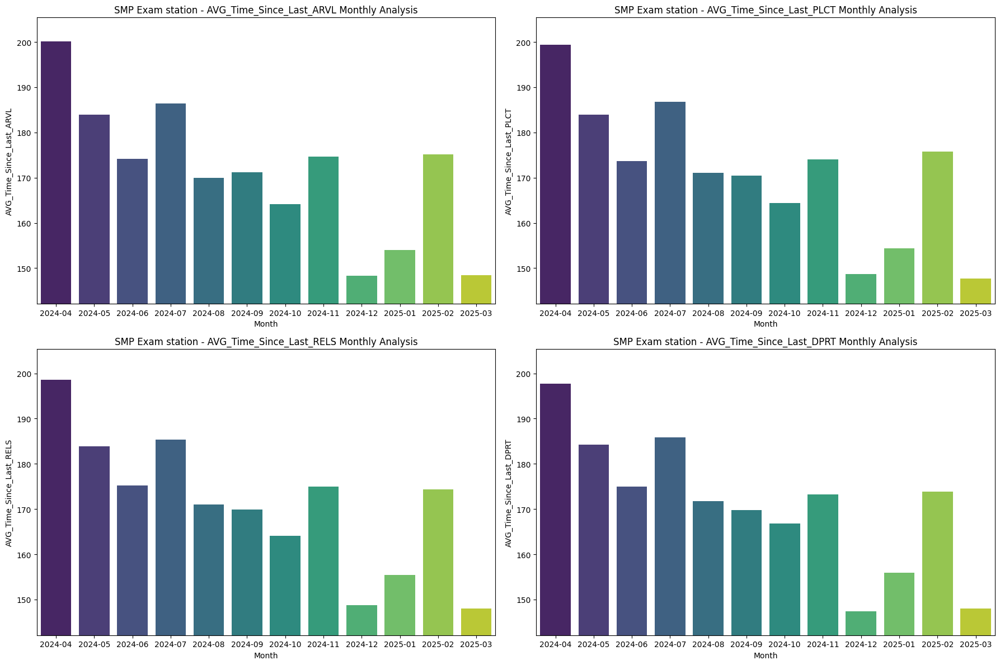

In [41]:
min_y = min(smp_monthly['AVG_Time_Since_Last_ARVL'].min(),
            smp_monthly['AVG_Time_Since_Last_PLCT'].min(),
            smp_monthly['AVG_Time_Since_Last_RELS'].min(),
            smp_monthly['AVG_Time_Since_Last_DPRT'].min())

max_y = max(smp_monthly['AVG_Time_Since_Last_ARVL'].max(),
            smp_monthly['AVG_Time_Since_Last_PLCT'].max(),
            smp_monthly['AVG_Time_Since_Last_RELS'].max(),
            smp_monthly['AVG_Time_Since_Last_DPRT'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=smp_monthly['R_MONTH'], y=smp_monthly['AVG_Time_Since_Last_ARVL'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('SMP Exam station - AVG_Time_Since_Last_ARVL Monthly Analysis')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Time_Since_Last_ARVL')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=smp_monthly['R_MONTH'], y=smp_monthly['AVG_Time_Since_Last_PLCT'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('SMP Exam station - AVG_Time_Since_Last_PLCT Monthly Analysis')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Time_Since_Last_PLCT')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=smp_monthly['R_MONTH'], y=smp_monthly['AVG_Time_Since_Last_RELS'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('SMP Exam station - AVG_Time_Since_Last_RELS Monthly Analysis')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Time_Since_Last_RELS')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=smp_monthly['R_MONTH'], y=smp_monthly['AVG_Time_Since_Last_DPRT'], palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('SMP Exam station - AVG_Time_Since_Last_DPRT Monthly Analysis')
axes[1, 1].set_xlabel('Month')
axes[1, 1].set_ylabel('AVG_Time_Since_Last_DPRT')
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)

plt.tight_layout()
plt.show()

In [42]:
monthly_rake_type_count = df1.groupby(['R_MONTH', 'RAKETYPE'])['RDATE'].count().reset_index(name='RAKE_COUNT')
monthly_rake_type_count = pd.DataFrame(monthly_rake_type_count)

monthly_shunting_time_sum = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
monthly_examination_time_sum = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
monthly_departure_lag_time_sum = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
monthly_numrakes1 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
monthly_numrakes2 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
monthly_numrakes3 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
monthly_numrakes4 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
monthly_numrakes5 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
monthly_numrakes6 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
monthly_timesince1 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
monthly_timesince2 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
monthly_timesince3 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
monthly_timesince4 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_shunting_time_sum, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_SHUNTING_TIME'] = monthly_rake_type_count['Shunting_Time'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_examination_time_sum, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_EXAMINATION_TIME'] = monthly_rake_type_count['Examination_Time'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_departure_lag_time_sum, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_DEPARTURE_TIME'] = monthly_rake_type_count['Departure_Lag'] / monthly_rake_type_count['RAKE_COUNT']

monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes1, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Shunting_At_ARVL'] = monthly_rake_type_count['numrakes1'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes2, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Exam_At_ARVL'] = monthly_rake_type_count['numrakes2'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes3, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Departure_At_ARVL'] = monthly_rake_type_count['numrakes3'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes4, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Exam_At_PLCT'] = monthly_rake_type_count['numrakes4'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes5, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Departure_At_PLCT'] = monthly_rake_type_count['numrakes5'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes6, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Departure_At_RELS'] = monthly_rake_type_count['numrakes6'] / monthly_rake_type_count['RAKE_COUNT']

monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_timesince1, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Time_Since_Last_ARVL'] = monthly_rake_type_count['timesince1'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_timesince2, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Time_Since_Last_PLCT'] = monthly_rake_type_count['timesince2'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_timesince3, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Time_Since_Last_RELS'] = monthly_rake_type_count['timesince3'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_timesince4, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Time_Since_Last_DPRT'] = monthly_rake_type_count['timesince4'] / monthly_rake_type_count['RAKE_COUNT']

monthly_rake_type_count.drop(columns=['Shunting_Time','Examination_Time','Departure_Lag','numrakes1','numrakes2','numrakes3','numrakes4','numrakes5','numrakes6','timesince1','timesince2','timesince3','timesince4'], axis=1, inplace=True)

monthly_rake_type_count

,R_MONTH,RAKETYPE,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04,BCN,133,49.240602,128.481203,196.744361,0.210526,0.759398,1.541353,0.699248,1.631579,1.503759,226.315789,220.533835,215.458647,212.902256
1,2024-04,BCNAHSM1,7,3.428571,129.428571,223.142857,0.000000,0.428571,1.285714,0.428571,1.285714,1.285714,221.428571,220.000000,148.714286,99.428571
2,2024-04,BCNHL,44,25.977273,167.681818,818.295455,0.113636,0.795455,1.545455,0.681818,1.659091,1.500000,191.272727,186.522727,189.636364,218.090909
3,2024-04,BOXN,19,57.842105,147.157895,210.263158,0.473684,0.947368,2.000000,0.684211,2.263158,2.157895,76.789474,103.894737,127.578947,99.263158
4,2024-04,BOXNHL,14,38.571429,173.357143,266.500000,0.428571,0.785714,1.642857,0.714286,1.642857,1.785714,136.071429,158.428571,187.857143,172.571429
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62,2025-03,BCNAHSM1,12,24.333333,135.000000,231.583333,0.750000,0.833333,1.833333,0.833333,2.000000,1.833333,156.583333,104.416667,107.083333,176.000000
63,2025-03,BCNHL,68,424.617647,204.250000,405.529412,1.176471,0.970588,1.852941,0.720588,1.823529,1.617647,165.573529,160.514706,139.117647,149.485294
64,2025-03,BOXN,37,57.486486,161.189189,155.621622,1.972973,0.918919,2.027027,0.864865,1.972973,1.864865,126.621622,145.297297,138.972973,139.324324
65,2025-03,BOXNHL,24,107.625000,156.666667,184.708333,1.583333,0.791667,1.791667,0.625000,1.833333,1.541667,138.750000,163.416667,167.208333,146.791667


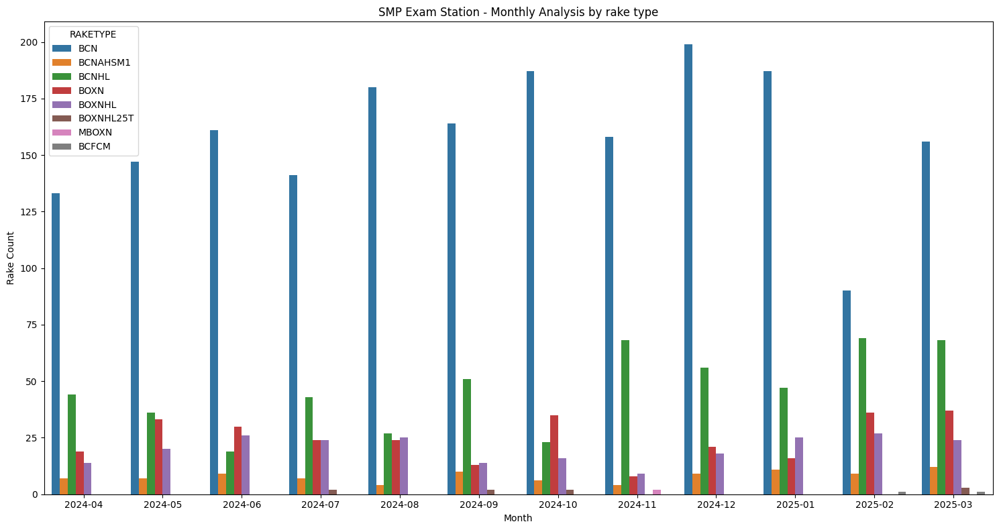

In [43]:
plt.figure(figsize=(15,8))
sns.barplot(monthly_rake_type_count, x='R_MONTH', y='RAKE_COUNT', hue='RAKETYPE')
plt.title('SMP Exam Station - Monthly Analysis by rake type')
plt.xlabel('Month')
plt.ylabel('Rake Count')
plt.tight_layout()
plt.show()

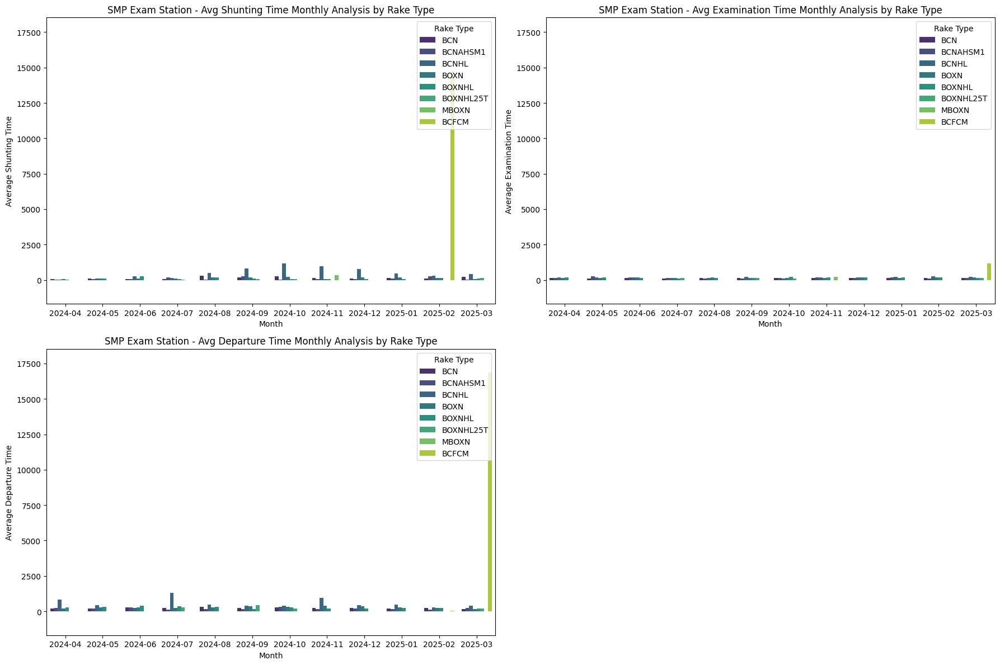

In [44]:
min_y = min(monthly_rake_type_count['AVG_SHUNTING_TIME'].min(),
            monthly_rake_type_count['AVG_EXAMINATION_TIME'].min(),
            monthly_rake_type_count['AVG_DEPARTURE_TIME'].min())

max_y = max(monthly_rake_type_count['AVG_SHUNTING_TIME'].max(),
            monthly_rake_type_count['AVG_EXAMINATION_TIME'].max(),
            monthly_rake_type_count['AVG_DEPARTURE_TIME'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_SHUNTING_TIME', hue='RAKETYPE', palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('SMP Exam Station - Avg Shunting Time Monthly Analysis by Rake Type')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('Average Shunting Time')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_EXAMINATION_TIME', hue='RAKETYPE', palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('SMP Exam Station - Avg Examination Time Monthly Analysis by Rake Type')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('Average Examination Time')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 1].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_DEPARTURE_TIME', hue='RAKETYPE', palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('SMP Exam Station - Avg Departure Time Monthly Analysis by Rake Type')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('Average Departure Time')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 0].legend(title='Rake Type', loc='upper right')

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

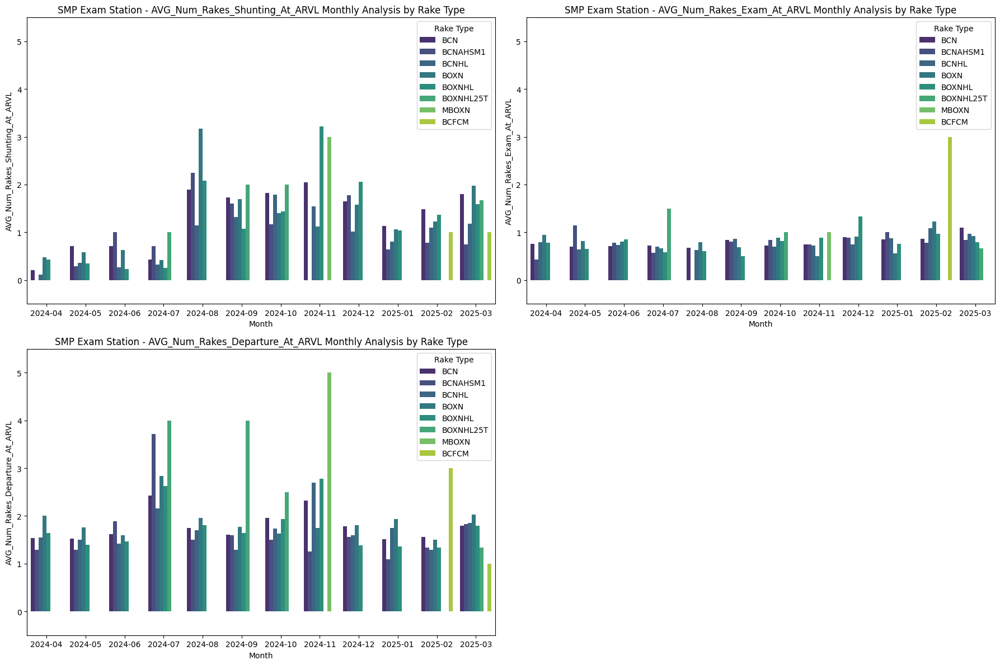

In [45]:
min_y = min(monthly_rake_type_count['AVG_Num_Rakes_Shunting_At_ARVL'].min(),
            monthly_rake_type_count['AVG_Num_Rakes_Exam_At_ARVL'].min(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_ARVL'].min())

max_y = max(monthly_rake_type_count['AVG_Num_Rakes_Shunting_At_ARVL'].max(),
            monthly_rake_type_count['AVG_Num_Rakes_Exam_At_ARVL'].max(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_ARVL'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Shunting_At_ARVL', hue='RAKETYPE', palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('SMP Exam Station - AVG_Num_Rakes_Shunting_At_ARVL Monthly Analysis by Rake Type')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Exam_At_ARVL', hue='RAKETYPE', palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('SMP Exam Station - AVG_Num_Rakes_Exam_At_ARVL Monthly Analysis by Rake Type')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Exam_At_ARVL')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 1].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Departure_At_ARVL', hue='RAKETYPE', palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('SMP Exam Station - AVG_Num_Rakes_Departure_At_ARVL Monthly Analysis by Rake Type')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_ARVL')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 0].legend(title='Rake Type', loc='upper right')

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

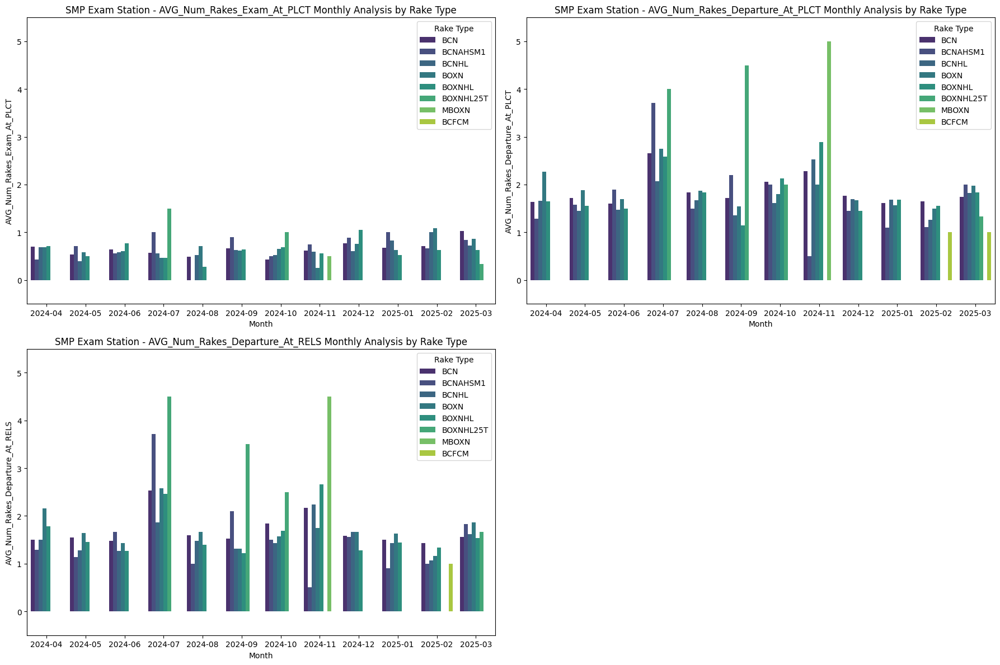

In [46]:
min_y = min(monthly_rake_type_count['AVG_Num_Rakes_Exam_At_PLCT'].min(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_PLCT'].min(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_RELS'].min())

max_y = max(monthly_rake_type_count['AVG_Num_Rakes_Exam_At_PLCT'].max(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_PLCT'].max(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_RELS'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Exam_At_PLCT', hue='RAKETYPE', palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('SMP Exam Station - AVG_Num_Rakes_Exam_At_PLCT Monthly Analysis by Rake Type')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Exam_At_PLCT')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Departure_At_PLCT', hue='RAKETYPE', palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('SMP Exam Station - AVG_Num_Rakes_Departure_At_PLCT Monthly Analysis by Rake Type')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Departure_At_PLCT')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 1].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Departure_At_RELS', hue='RAKETYPE', palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('SMP Exam Station - AVG_Num_Rakes_Departure_At_RELS Monthly Analysis by Rake Type')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_RELS')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 0].legend(title='Rake Type', loc='upper right')

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

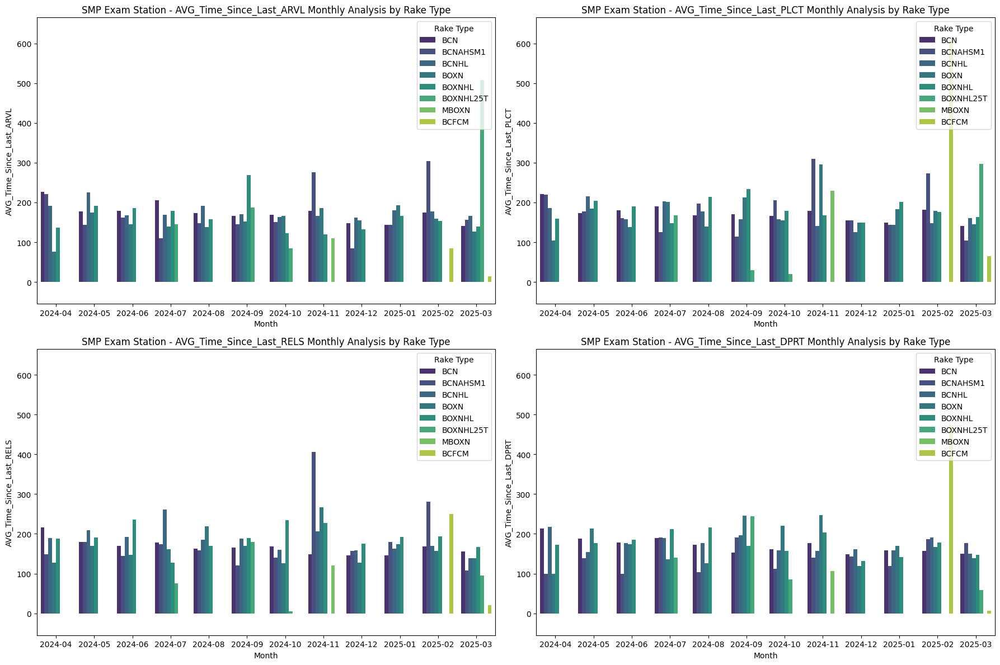

In [47]:
min_y = min(monthly_rake_type_count['AVG_Time_Since_Last_ARVL'].min(),
            monthly_rake_type_count['AVG_Time_Since_Last_PLCT'].min(),
            monthly_rake_type_count['AVG_Time_Since_Last_RELS'].min(),
            monthly_rake_type_count['AVG_Time_Since_Last_DPRT'].min())

max_y = max(monthly_rake_type_count['AVG_Time_Since_Last_ARVL'].max(),
            monthly_rake_type_count['AVG_Time_Since_Last_PLCT'].max(),
            monthly_rake_type_count['AVG_Time_Since_Last_RELS'].max(),
            monthly_rake_type_count['AVG_Time_Since_Last_DPRT'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Time_Since_Last_ARVL', hue='RAKETYPE', palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('SMP Exam Station - AVG_Time_Since_Last_ARVL Monthly Analysis by Rake Type')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Time_Since_Last_ARVL')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Time_Since_Last_PLCT', hue='RAKETYPE', palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('SMP Exam Station - AVG_Time_Since_Last_PLCT Monthly Analysis by Rake Type')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Time_Since_Last_PLCT')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 1].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Time_Since_Last_RELS', hue='RAKETYPE', palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('SMP Exam Station - AVG_Time_Since_Last_RELS Monthly Analysis by Rake Type')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Time_Since_Last_RELS')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Time_Since_Last_DPRT', hue='RAKETYPE', palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('SMP Exam Station - AVG_Time_Since_Last_DPRT Monthly Analysis by Rake Type')
axes[1, 1].set_xlabel('Month')
axes[1, 1].set_ylabel('AVG_Time_Since_Last_DPRT')
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 1].legend(title='Rake Type', loc='upper right')

plt.tight_layout()
plt.show()

#### Weekly Analysis

In [48]:
smp_weekly = df1['R_WEEK'].value_counts(sort=False).reset_index()
smp_weekly.columns =['R_WEEK','RAKE_COUNT']
smp_weekly = pd.DataFrame(smp_weekly)

weekly_shunting_time_sum = df1.groupby('R_WEEK', sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
weekly_examination_time_sum = df1.groupby('R_WEEK', sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
weekly_departure_lag_time_sum = df1.groupby('R_WEEK', sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
weekly_numrakes1 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
weekly_numrakes2 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
weekly_numrakes3 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
weekly_numrakes4 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
weekly_numrakes5 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
weekly_numrakes6 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
weekly_timesince1 = df1.groupby('R_WEEK', sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
weekly_timesince2 = df1.groupby('R_WEEK', sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
weekly_timesince3 = df1.groupby('R_WEEK', sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
weekly_timesince4 = df1.groupby('R_WEEK', sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

smp_weekly['AVG_SHUNTING_TIME'] = weekly_shunting_time_sum['Shunting_Time'] / smp_weekly['RAKE_COUNT']
smp_weekly['AVG_EXAMINATION_TIME'] = weekly_examination_time_sum['Examination_Time'] / smp_weekly['RAKE_COUNT']
smp_weekly['AVG_DEPARTURE_TIME'] = weekly_departure_lag_time_sum['Departure_Lag'] / smp_weekly['RAKE_COUNT']
smp_weekly['AVG_Num_Rakes_Shunting_At_ARVL'] = weekly_numrakes1['numrakes1'] / smp_weekly['RAKE_COUNT']
smp_weekly['AVG_Num_Rakes_Exam_At_ARVL'] = weekly_numrakes2['numrakes2'] / smp_weekly['RAKE_COUNT']
smp_weekly['AVG_Num_Rakes_Departure_At_ARVL'] = weekly_numrakes3['numrakes3'] / smp_weekly['RAKE_COUNT']
smp_weekly['AVG_Num_Rakes_Exam_At_PLCT'] = weekly_numrakes4['numrakes4'] / smp_weekly['RAKE_COUNT']
smp_weekly['AVG_Num_Rakes_Departure_At_PLCT'] = weekly_numrakes5['numrakes5'] / smp_weekly['RAKE_COUNT']
smp_weekly['AVG_Num_Rakes_Departure_At_RELS'] = weekly_numrakes6['numrakes6'] / smp_weekly['RAKE_COUNT']
smp_weekly['AVG_Time_Since_Last_ARVL'] = weekly_timesince1['timesince1'] / smp_weekly['RAKE_COUNT']
smp_weekly['AVG_Time_Since_Last_PLCT'] = weekly_timesince2['timesince2'] / smp_weekly['RAKE_COUNT']
smp_weekly['AVG_Time_Since_Last_RELS'] = weekly_timesince3['timesince3'] / smp_weekly['RAKE_COUNT']
smp_weekly['AVG_Time_Since_Last_DPRT'] = weekly_timesince4['timesince4'] / smp_weekly['RAKE_COUNT']

smp_weekly.head()

,R_WEEK,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,W-14-2024,66,39.348485,142.363636,189.984848,0.287879,0.863636,1.287879,0.848485,1.393939,1.378788,158.530303,155.984848,153.787879,150.909091
1,W-15-2024,59,24.067797,144.186441,196.067797,0.084746,0.898305,1.152542,0.830508,1.203390,1.084746,165.305085,165.593220,155.084746,170.169492
2,W-16-2024,46,81.434783,143.478261,211.826087,0.456522,0.804348,2.695652,0.673913,2.760870,2.717391,205.717391,202.717391,226.673913,217.500000
3,W-17-2024,30,49.033333,150.233333,1162.800000,0.100000,0.500000,1.900000,0.333333,2.100000,1.766667,343.833333,355.000000,338.433333,325.833333
4,W-18-2024,53,21.113208,116.547170,189.773585,0.075472,0.566038,1.132075,0.396226,1.207547,1.037736,197.943396,194.056604,194.433962,198.207547


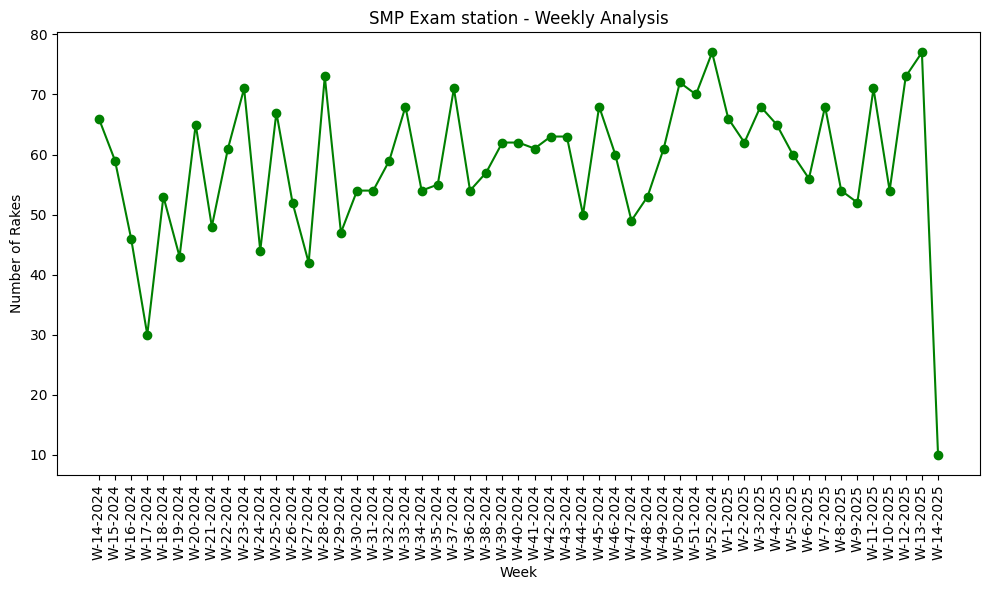

In [49]:
plt.figure(figsize=(10,6))
plt.plot(smp_weekly['R_WEEK'], smp_weekly['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('SMP Exam station - Weekly Analysis')
plt.xlabel('Week')
plt.ylabel('Number of Rakes')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_13868\1089011848.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=smp_weekly['R_WEEK'], y=smp_weekly['AVG_SHUNTING_TIME'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_13868\1089011848.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0, 1].set_xticklabels(axes[0, 1].get_xticklabels(), rotation=90)
C:\Users\anant\AppData\Local\Temp\ipykernel_13868\1089011848.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=smp_weekly['R_WEEK'], y=smp_weekly['AVG_EXAMINATION_TIME'], palette='viridis', ax=axes[1, 0])
C:\Users\anan

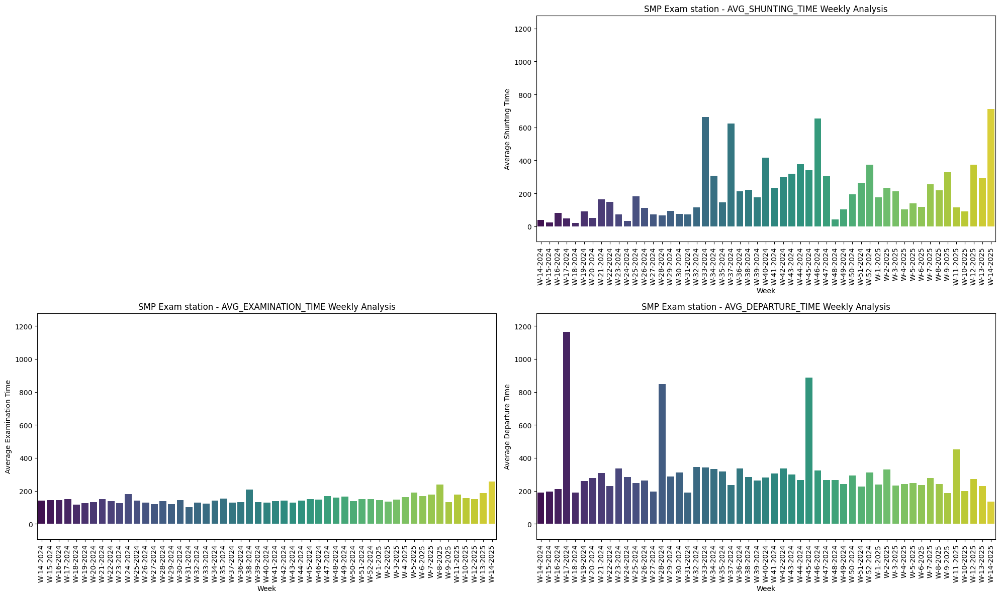

In [50]:
min_y = min(smp_weekly['AVG_SHUNTING_TIME'].min(),
            smp_weekly['AVG_EXAMINATION_TIME'].min(),
            smp_weekly['AVG_DEPARTURE_TIME'].min())

max_y = max(smp_weekly['AVG_SHUNTING_TIME'].max(),
            smp_weekly['AVG_EXAMINATION_TIME'].max(),
            smp_weekly['AVG_DEPARTURE_TIME'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(20, 12))

axes[0, 0].axis('off')

sns.barplot(x=smp_weekly['R_WEEK'], y=smp_weekly['AVG_SHUNTING_TIME'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('SMP Exam station - AVG_SHUNTING_TIME Weekly Analysis')
axes[0, 1].set_xlabel('Week')
axes[0, 1].set_ylabel('Average Shunting Time')
axes[0, 1].set_xticklabels(axes[0, 1].get_xticklabels(), rotation=90)
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=smp_weekly['R_WEEK'], y=smp_weekly['AVG_EXAMINATION_TIME'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('SMP Exam station - AVG_EXAMINATION_TIME Weekly Analysis')
axes[1, 0].set_xlabel('Week')
axes[1, 0].set_ylabel('Average Examination Time')
axes[1, 0].set_xticklabels(axes[1, 0].get_xticklabels(), rotation=90)
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=smp_weekly['R_WEEK'], y=smp_weekly['AVG_DEPARTURE_TIME'], palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('SMP Exam station - AVG_DEPARTURE_TIME Weekly Analysis')
axes[1, 1].set_xlabel('Week')
axes[1, 1].set_ylabel('Average Departure Time')
axes[1, 1].set_xticklabels(axes[1, 1].get_xticklabels(), rotation=90)
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_13868\2555647075.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=smp_weekly['R_WEEK'], y=smp_weekly['AVG_Num_Rakes_Shunting_At_ARVL'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_13868\2555647075.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=smp_weekly['R_WEEK'], y=smp_weekly['AVG_Num_Rakes_Exam_At_ARVL'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_13868\2555647075.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barpl

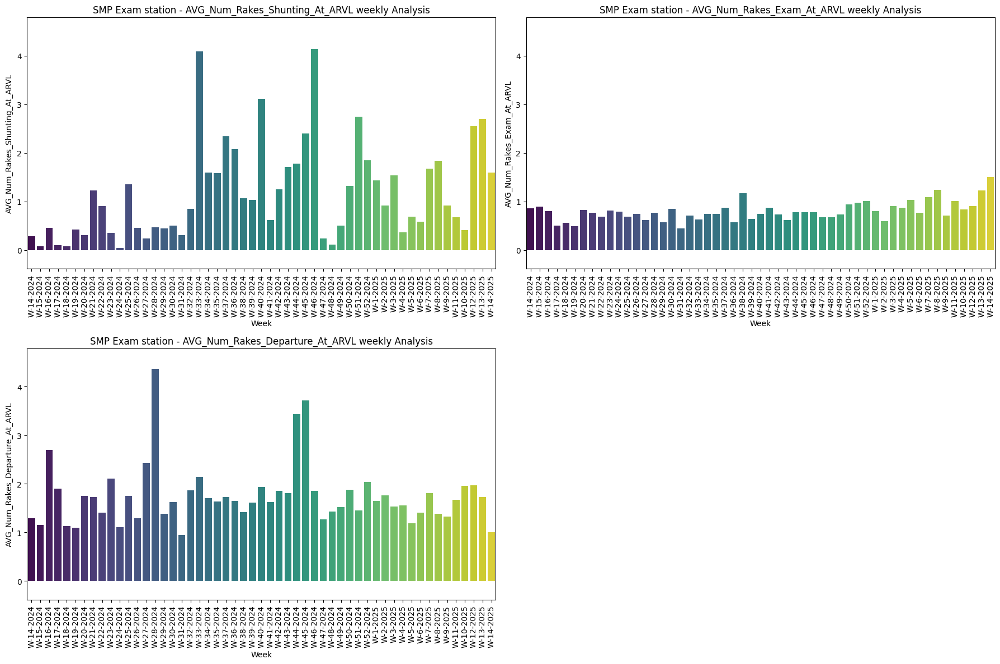

In [51]:
min_y = min(smp_weekly['AVG_Num_Rakes_Shunting_At_ARVL'].min(),
            smp_weekly['AVG_Num_Rakes_Exam_At_ARVL'].min(),
            smp_weekly['AVG_Num_Rakes_Departure_At_ARVL'].min())

max_y = max(smp_weekly['AVG_Num_Rakes_Shunting_At_ARVL'].max(),
            smp_weekly['AVG_Num_Rakes_Exam_At_ARVL'].max(),
            smp_weekly['AVG_Num_Rakes_Departure_At_ARVL'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=smp_weekly['R_WEEK'], y=smp_weekly['AVG_Num_Rakes_Shunting_At_ARVL'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('SMP Exam station - AVG_Num_Rakes_Shunting_At_ARVL weekly Analysis')
axes[0, 0].set_xlabel('Week')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
axes[0, 0].tick_params(axis='x', labelrotation=90)
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=smp_weekly['R_WEEK'], y=smp_weekly['AVG_Num_Rakes_Exam_At_ARVL'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('SMP Exam station - AVG_Num_Rakes_Exam_At_ARVL weekly Analysis')
axes[0, 1].set_xlabel('Week')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Exam_At_ARVL')
axes[0, 1].tick_params(axis='x', labelrotation=90)
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=smp_weekly['R_WEEK'], y=smp_weekly['AVG_Num_Rakes_Departure_At_ARVL'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('SMP Exam station - AVG_Num_Rakes_Departure_At_ARVL weekly Analysis')
axes[1, 0].set_xlabel('Week')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_ARVL')
axes[1, 0].tick_params(axis='x', labelrotation=90)
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_13868\2201084437.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=smp_weekly['R_WEEK'], y=smp_weekly['AVG_Num_Rakes_Exam_At_PLCT'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_13868\2201084437.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=smp_weekly['R_WEEK'], y=smp_weekly['AVG_Num_Rakes_Departure_At_PLCT'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_13868\2201084437.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barp

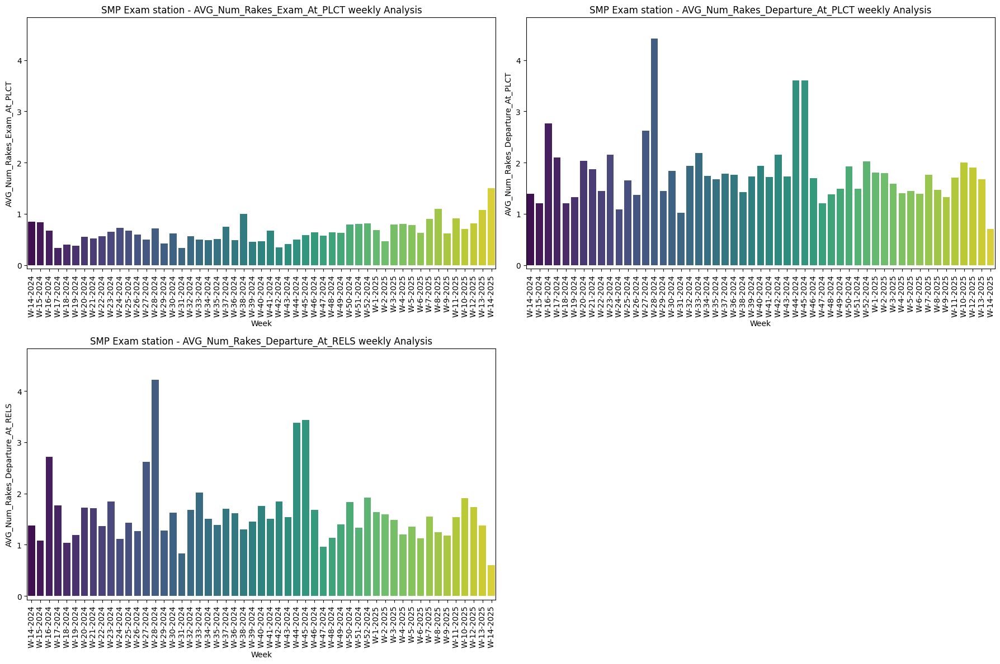

In [52]:
min_y = min(smp_weekly['AVG_Num_Rakes_Exam_At_PLCT'].min(),
            smp_weekly['AVG_Num_Rakes_Departure_At_PLCT'].min(),
            smp_weekly['AVG_Num_Rakes_Departure_At_RELS'].min())

max_y = max(smp_weekly['AVG_Num_Rakes_Exam_At_PLCT'].max(),
            smp_weekly['AVG_Num_Rakes_Departure_At_PLCT'].max(),
            smp_weekly['AVG_Num_Rakes_Departure_At_RELS'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=smp_weekly['R_WEEK'], y=smp_weekly['AVG_Num_Rakes_Exam_At_PLCT'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('SMP Exam station - AVG_Num_Rakes_Exam_At_PLCT weekly Analysis')
axes[0, 0].set_xlabel('Week')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Exam_At_PLCT')
axes[0, 0].tick_params(axis='x', labelrotation=90)
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=smp_weekly['R_WEEK'], y=smp_weekly['AVG_Num_Rakes_Departure_At_PLCT'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('SMP Exam station - AVG_Num_Rakes_Departure_At_PLCT weekly Analysis')
axes[0, 1].set_xlabel('Week')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Departure_At_PLCT')
axes[0, 1].tick_params(axis='x', labelrotation=90)
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=smp_weekly['R_WEEK'], y=smp_weekly['AVG_Num_Rakes_Departure_At_RELS'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('SMP Exam station - AVG_Num_Rakes_Departure_At_RELS weekly Analysis')
axes[1, 0].set_xlabel('Week')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_RELS')
axes[1, 0].tick_params(axis='x', labelrotation=90)
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_13868\4274129170.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=smp_weekly['R_WEEK'], y=smp_weekly['AVG_Time_Since_Last_ARVL'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_13868\4274129170.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=smp_weekly['R_WEEK'], y=smp_weekly['AVG_Time_Since_Last_PLCT'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_13868\4274129170.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=smp

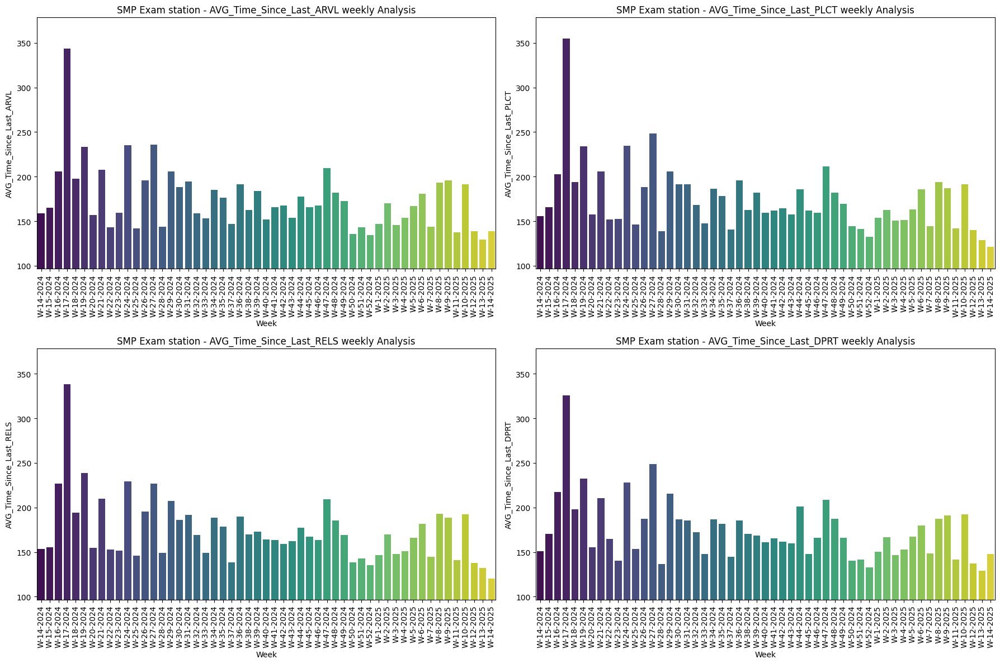

In [53]:
min_y = min(smp_weekly['AVG_Time_Since_Last_ARVL'].min(),
            smp_weekly['AVG_Time_Since_Last_PLCT'].min(),
            smp_weekly['AVG_Time_Since_Last_RELS'].min(),
            smp_weekly['AVG_Time_Since_Last_DPRT'].min())

max_y = max(smp_weekly['AVG_Time_Since_Last_ARVL'].max(),
            smp_weekly['AVG_Time_Since_Last_PLCT'].max(),
            smp_weekly['AVG_Time_Since_Last_RELS'].max(),
            smp_weekly['AVG_Time_Since_Last_DPRT'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=smp_weekly['R_WEEK'], y=smp_weekly['AVG_Time_Since_Last_ARVL'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('SMP Exam station - AVG_Time_Since_Last_ARVL weekly Analysis')
axes[0, 0].set_xlabel('Week')
axes[0, 0].set_ylabel('AVG_Time_Since_Last_ARVL')
axes[0, 0].tick_params(axis='x', labelrotation=90)
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=smp_weekly['R_WEEK'], y=smp_weekly['AVG_Time_Since_Last_PLCT'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('SMP Exam station - AVG_Time_Since_Last_PLCT weekly Analysis')
axes[0, 1].set_xlabel('Week')
axes[0, 1].set_ylabel('AVG_Time_Since_Last_PLCT')
axes[0, 1].tick_params(axis='x', labelrotation=90)
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=smp_weekly['R_WEEK'], y=smp_weekly['AVG_Time_Since_Last_RELS'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('SMP Exam station - AVG_Time_Since_Last_RELS weekly Analysis')
axes[1, 0].set_xlabel('Week')
axes[1, 0].set_ylabel('AVG_Time_Since_Last_RELS')
axes[1, 0].tick_params(axis='x', labelrotation=90)
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=smp_weekly['R_WEEK'], y=smp_weekly['AVG_Time_Since_Last_DPRT'], palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('SMP Exam station - AVG_Time_Since_Last_DPRT weekly Analysis')
axes[1, 1].set_xlabel('Week')
axes[1, 1].set_ylabel('AVG_Time_Since_Last_DPRT')
axes[1, 1].tick_params(axis='x', labelrotation=90)
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)

plt.tight_layout()
plt.show()

In [54]:
weekly_rake_type_count = smp.groupby(['R_WEEK', 'RAKETYPE'], sort=False)['RDATE'].count().reset_index(name='RAKE_COUNT')
weekly_rake_type_count = pd.DataFrame(weekly_rake_type_count)

weekly_shunting_time_sum = smp.groupby(['R_WEEK', 'RAKETYPE'], sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
weekly_examination_time_sum = smp.groupby(['R_WEEK', 'RAKETYPE'], sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
weekly_departure_lag_time_sum = smp.groupby(['R_WEEK', 'RAKETYPE'], sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')

weekly_rake_type_count = pd.merge(weekly_rake_type_count, weekly_shunting_time_sum, on=['R_WEEK', 'RAKETYPE'], how='left')
weekly_rake_type_count['AVG_SHUNTING_TIME'] = weekly_rake_type_count['Shunting_Time'] / weekly_rake_type_count['RAKE_COUNT']
weekly_rake_type_count = pd.merge(weekly_rake_type_count, weekly_examination_time_sum, on=['R_WEEK', 'RAKETYPE'], how='left')
weekly_rake_type_count['AVG_EXAMINATION_TIME'] = weekly_rake_type_count['Examination_Time'] / weekly_rake_type_count['RAKE_COUNT']
weekly_rake_type_count = pd.merge(weekly_rake_type_count, weekly_departure_lag_time_sum, on=['R_WEEK', 'RAKETYPE'], how='left')
weekly_rake_type_count['AVG_DEPARTURE_TIME'] = weekly_rake_type_count['Departure_Lag'] / weekly_rake_type_count['RAKE_COUNT']

weekly_rake_type_count.drop(columns=['Shunting_Time','Examination_Time','Departure_Lag'], axis=1, inplace=True)

weekly_rake_type_count

,R_WEEK,RAKETYPE,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME
0,W-14-2024,BOXN,9,8.777778,198.888889,194.888889
1,W-14-2024,BOXNHL,2,36.500000,192.500000,76.500000
2,W-14-2024,BCN,40,55.450000,134.150000,210.875000
3,W-14-2024,BCNHL,13,17.076923,122.307692,121.692308
4,W-14-2024,BCNAHSM1,2,2.500000,132.500000,307.500000
...,...,...,...,...,...,...
243,W-13-2025,BOXNHL,3,246.666667,223.333333,205.000000
244,W-13-2025,BOXN,8,142.625000,180.500000,96.875000
245,W-14-2025,BOXN,2,190.000000,115.000000,72.500000
246,W-14-2025,BCN,6,812.166667,280.000000,152.666667


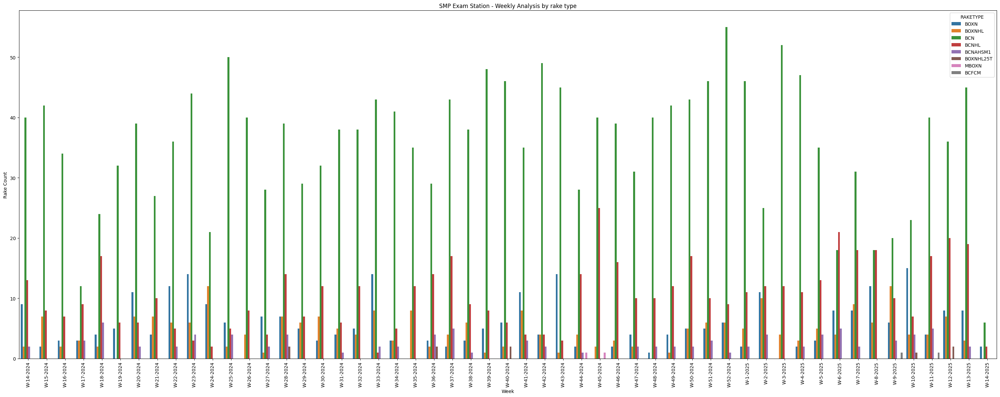

In [55]:
plt.figure(figsize=(30,12))
sns.barplot(weekly_rake_type_count, x='R_WEEK', y='RAKE_COUNT', hue='RAKETYPE')
plt.title('SMP Exam Station - Weekly Analysis by rake type')
plt.xlabel('Week')
plt.ylabel('Rake Count')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

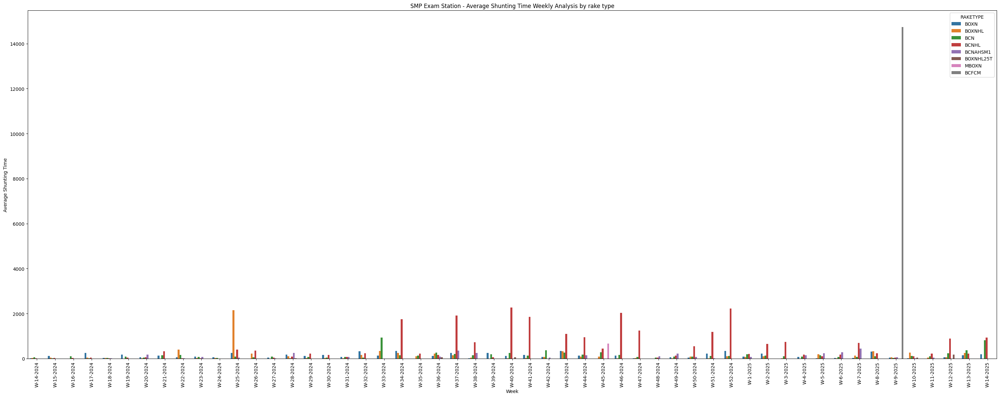

In [56]:
plt.figure(figsize=(30,12))
sns.barplot(weekly_rake_type_count, x='R_WEEK', y='AVG_SHUNTING_TIME', hue='RAKETYPE')
plt.title('SMP Exam Station - Average Shunting Time Weekly Analysis by rake type')
plt.xlabel('Week')
plt.ylabel('Average Shunting Time')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

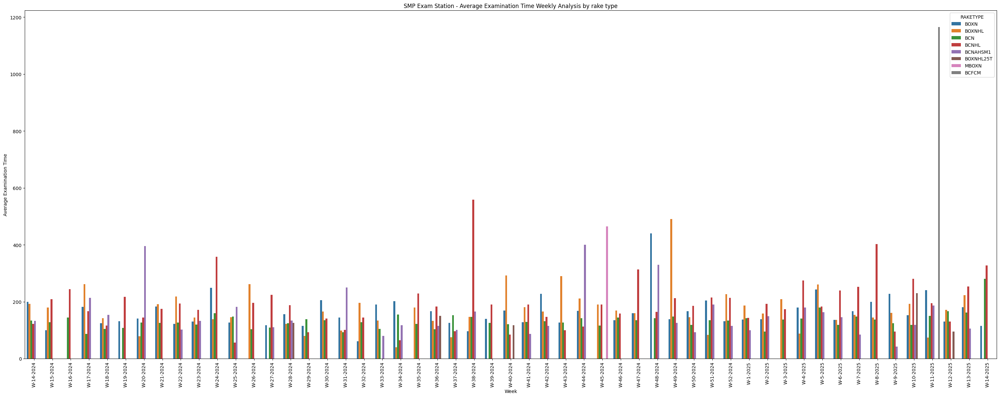

In [57]:
plt.figure(figsize=(30,12))
sns.barplot(weekly_rake_type_count, x='R_WEEK', y='AVG_EXAMINATION_TIME', hue='RAKETYPE')
plt.title('SMP Exam Station - Average Examination Time Weekly Analysis by rake type')
plt.xlabel('Week')
plt.ylabel('Average Examination Time')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

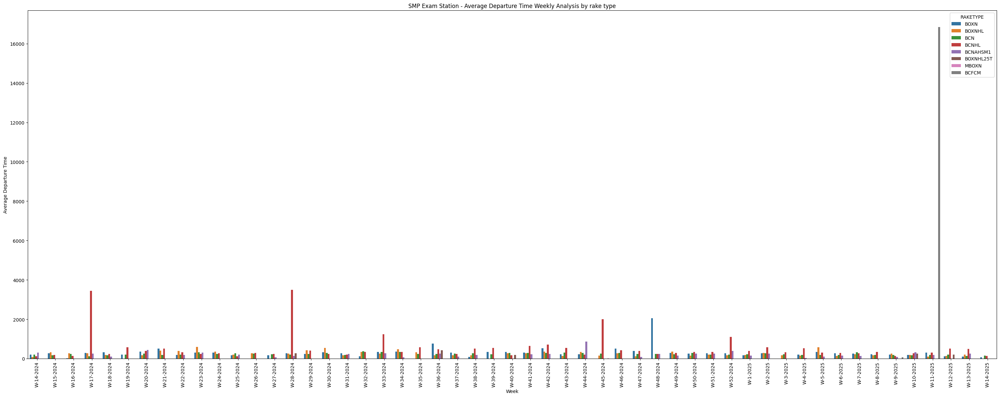

In [58]:
plt.figure(figsize=(30,12))
sns.barplot(weekly_rake_type_count, x='R_WEEK', y='AVG_DEPARTURE_TIME', hue='RAKETYPE')
plt.title('SMP Exam Station - Average Departure Time Weekly Analysis by rake type')
plt.xlabel('Week')
plt.ylabel('Average Departure Time')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

#### Daily Analysis

In [59]:
smp_daily = df1.groupby('R_DATEOFMONTH', sort=False)['RDATE'].count().reset_index(name='RAKE_COUNT')
smp_daily = pd.DataFrame(smp_daily)

daily_shunting_time_sum = df1.groupby('R_DATEOFMONTH', sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
daily_examination_time_sum = df1.groupby('R_DATEOFMONTH', sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
daily_departure_lag_time_sum = df1.groupby('R_DATEOFMONTH', sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
daily_numrakes1 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
daily_numrakes2 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
daily_numrakes3 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
daily_numrakes4 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
daily_numrakes5 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
daily_numrakes6 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
daily_timesince1 = df1.groupby('R_DATEOFMONTH', sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
daily_timesince2 = df1.groupby('R_DATEOFMONTH', sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
daily_timesince3 = df1.groupby('R_DATEOFMONTH', sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
daily_timesince4 = df1.groupby('R_DATEOFMONTH', sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

smp_daily['AVG_SHUNTING_TIME'] = daily_shunting_time_sum['Shunting_Time'] / smp_daily['RAKE_COUNT']
smp_daily['AVG_EXAMINATION_TIME'] = daily_examination_time_sum['Examination_Time'] / smp_daily['RAKE_COUNT']
smp_daily['AVG_DEPARTURE_TIME'] = daily_departure_lag_time_sum['Departure_Lag'] / smp_daily['RAKE_COUNT']
smp_daily['AVG_Num_Rakes_Shunting_At_ARVL'] = daily_numrakes1['numrakes1'] / smp_daily['RAKE_COUNT']
smp_daily['AVG_Num_Rakes_Exam_At_ARVL'] = daily_numrakes2['numrakes2'] / smp_daily['RAKE_COUNT']
smp_daily['AVG_Num_Rakes_Departure_At_ARVL'] = daily_numrakes3['numrakes3'] / smp_daily['RAKE_COUNT']
smp_daily['AVG_Num_Rakes_Exam_At_PLCT'] = daily_numrakes4['numrakes4'] / smp_daily['RAKE_COUNT']
smp_daily['AVG_Num_Rakes_Departure_At_PLCT'] = daily_numrakes5['numrakes5'] / smp_daily['RAKE_COUNT']
smp_daily['AVG_Num_Rakes_Departure_At_RELS'] = daily_numrakes6['numrakes6'] / smp_daily['RAKE_COUNT']
smp_daily['AVG_Time_Since_Last_ARVL'] = daily_timesince1['timesince1'] / smp_daily['RAKE_COUNT']
smp_daily['AVG_Time_Since_Last_PLCT'] = daily_timesince2['timesince2'] / smp_daily['RAKE_COUNT']
smp_daily['AVG_Time_Since_Last_RELS'] = daily_timesince3['timesince3'] / smp_daily['RAKE_COUNT']
smp_daily['AVG_Time_Since_Last_DPRT'] = daily_timesince4['timesince4'] / smp_daily['RAKE_COUNT']

smp_daily

,R_DATEOFMONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04-01,16,69.937500,108.125000,198.875000,0.500000,1.000000,2.000000,1.062500,2.062500,2.187500,96.187500,93.750000,87.187500,74.375000
1,2024-04-02,15,13.866667,135.400000,172.933333,0.466667,1.133333,1.600000,1.133333,1.866667,1.866667,89.400000,81.333333,88.333333,98.266667
2,2024-04-03,9,91.444444,202.222222,212.888889,0.444444,1.000000,1.000000,1.000000,1.111111,1.111111,158.222222,180.000000,163.333333,163.777778
3,2024-04-04,8,18.875000,177.500000,209.125000,0.000000,0.875000,1.250000,0.750000,1.500000,1.250000,159.500000,135.000000,148.125000,149.750000
4,2024-04-05,3,25.000000,321.666667,321.333333,0.000000,0.333333,1.000000,0.000000,1.000000,0.000000,568.333333,586.666667,596.666667,556.666667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359,2025-03-28,16,87.500000,218.437500,298.875000,4.250000,1.125000,2.000000,1.000000,2.125000,1.812500,96.250000,107.750000,96.187500,96.937500
360,2025-03-27,6,6.666667,233.333333,239.833333,0.000000,0.833333,1.833333,0.666667,2.000000,2.000000,270.000000,217.500000,238.333333,225.166667
361,2025-03-31,10,713.000000,256.500000,134.200000,1.600000,1.500000,1.000000,1.500000,0.700000,0.600000,139.000000,121.400000,120.000000,147.900000
362,2025-03-30,12,1155.333333,192.083333,89.166667,3.583333,1.666667,1.000000,1.416667,0.583333,0.250000,121.250000,133.000000,117.500000,101.333333


In [60]:
import matplotlib.dates as mdates

In [61]:
smp_daily['R_DATEOFMONTH'] = pd.to_datetime(smp_daily['R_DATEOFMONTH'], format='%Y-%m-%d')

smp_daily = smp_daily.sort_values(by='R_DATEOFMONTH')

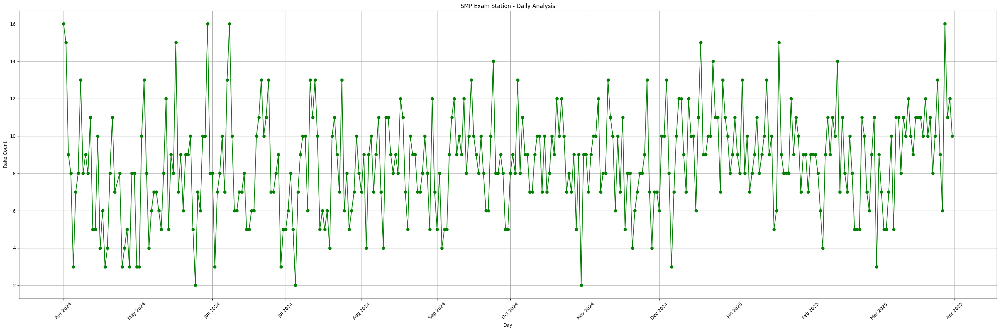

In [62]:
fig, ax = plt.subplots(figsize=(30, 10))
ax.plot(smp_daily['R_DATEOFMONTH'], smp_daily['RAKE_COUNT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('SMP Exam Station - Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('Rake Count')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

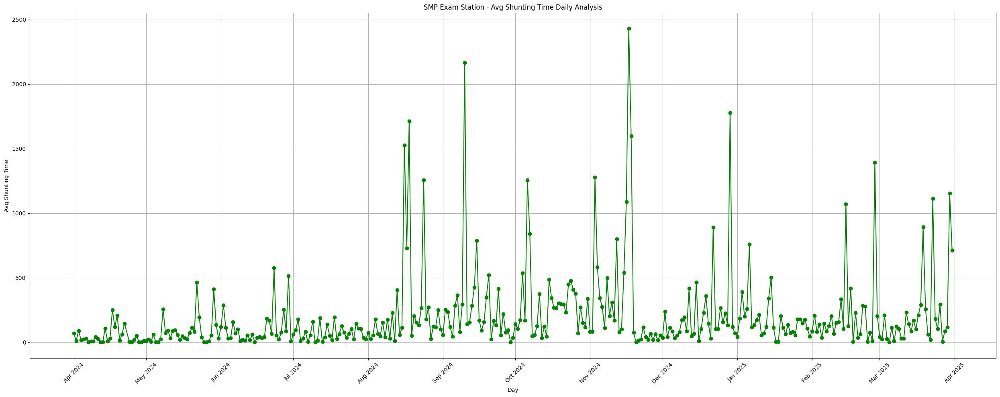

In [63]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(smp_daily['R_DATEOFMONTH'], smp_daily['AVG_SHUNTING_TIME'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('SMP Exam Station - Avg Shunting Time Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('Avg Shunting Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

In [64]:
smp_daily[smp_daily['AVG_SHUNTING_TIME'] > 1000]

,R_DATEOFMONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
134,2024-08-16,8,1528.500000,128.125000,242.625000,4.875000,0.750000,1.375000,0.625000,1.000000,1.000000,145.125000,167.500000,196.875000,164.125000
132,2024-08-18,11,1713.545455,141.363636,252.545455,2.363636,0.636364,1.727273,0.545455,2.000000,1.545455,142.727273,112.272727,145.000000,145.363636
143,2024-08-24,7,1256.142857,82.142857,287.142857,1.428571,0.857143,2.285714,0.571429,2.142857,1.714286,133.428571,198.571429,177.142857,237.571429
148,2024-09-10,10,2167.900000,121.800000,341.400000,1.800000,0.800000,2.300000,0.900000,2.500000,2.600000,225.300000,177.300000,144.000000,143.600000
184,2024-10-06,11,1255.727273,65.909091,143.000000,2.545455,0.636364,2.363636,0.363636,1.818182,1.545455,142.454545,142.727273,142.272727,134.090909
209,2024-11-03,9,1277.666667,101.111111,301.333333,2.555556,0.444444,4.777778,0.333333,4.888889,4.666667,159.444444,128.333333,139.444444,156.444444
226,2024-11-16,11,1088.727273,137.272727,295.545455,3.545455,0.454545,1.727273,0.363636,1.818182,1.636364,215.000000,117.727273,131.363636,128.636364
225,2024-11-17,5,2429.000000,102.000000,370.400000,2.200000,0.400000,1.400000,0.400000,1.400000,1.200000,224.000000,198.000000,246.000000,265.000000
224,2024-11-18,8,1597.250000,151.250000,372.750000,0.500000,0.750000,2.250000,0.250000,2.250000,1.625000,163.625000,193.500000,169.750000,175.875000
262,2024-12-29,10,1778.400000,182.800000,864.600000,1.100000,1.000000,2.500000,0.800000,2.300000,2.200000,157.500000,149.900000,166.000000,144.500000


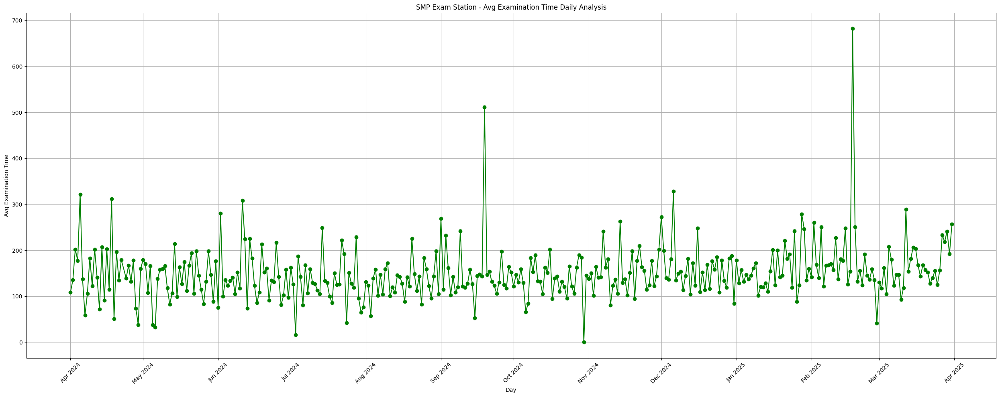

In [65]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(smp_daily['R_DATEOFMONTH'], smp_daily['AVG_EXAMINATION_TIME'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('SMP Exam Station - Avg Examination Time Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('Avg Examination Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

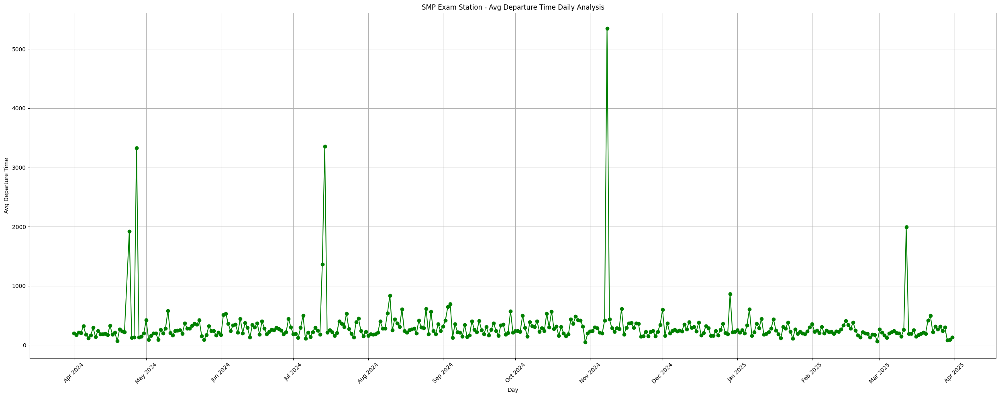

In [66]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(smp_daily['R_DATEOFMONTH'], smp_daily['AVG_DEPARTURE_TIME'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('SMP Exam Station - Avg Departure Time Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('Avg Departure Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

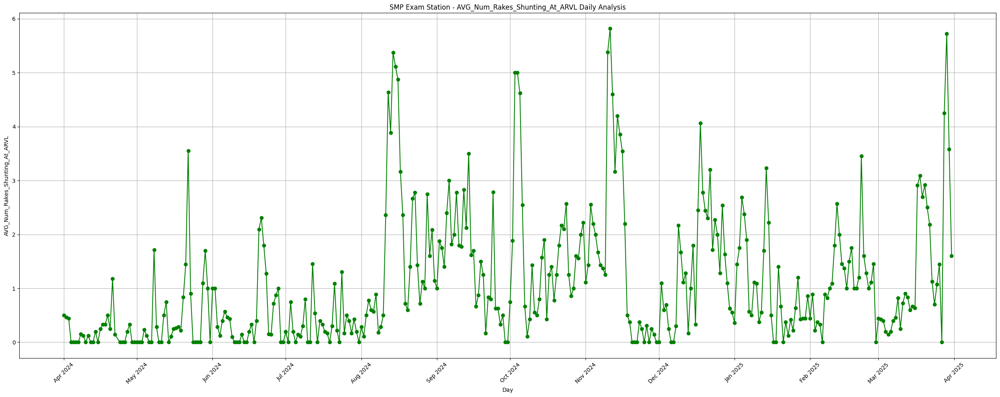

In [67]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(smp_daily['R_DATEOFMONTH'], smp_daily['AVG_Num_Rakes_Shunting_At_ARVL'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('SMP Exam Station - AVG_Num_Rakes_Shunting_At_ARVL Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

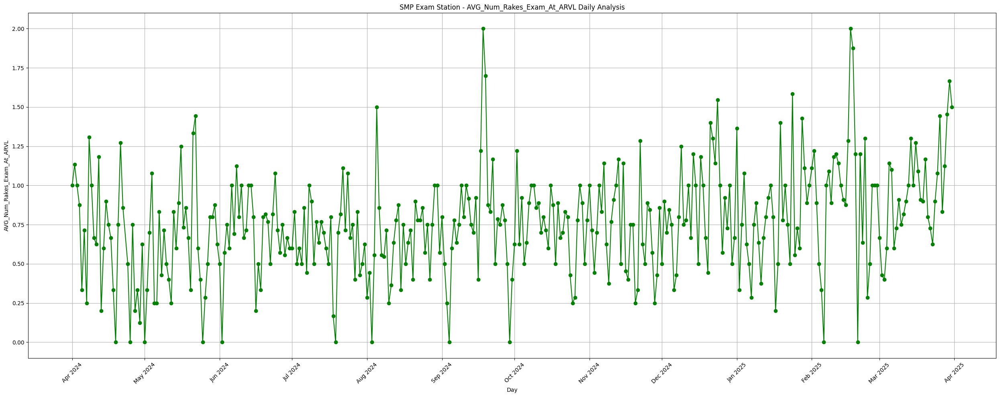

In [68]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(smp_daily['R_DATEOFMONTH'], smp_daily['AVG_Num_Rakes_Exam_At_ARVL'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('SMP Exam Station - AVG_Num_Rakes_Exam_At_ARVL Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Exam_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

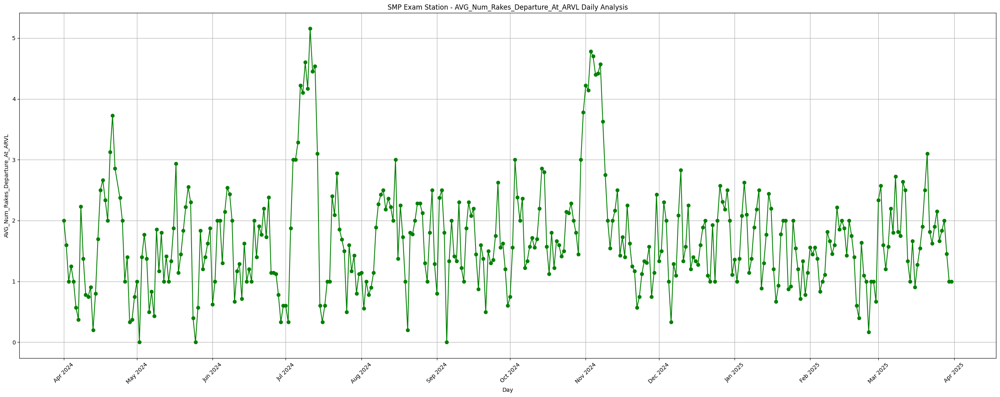

In [69]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(smp_daily['R_DATEOFMONTH'], smp_daily['AVG_Num_Rakes_Departure_At_ARVL'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('SMP Exam Station - AVG_Num_Rakes_Departure_At_ARVL Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Departure_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

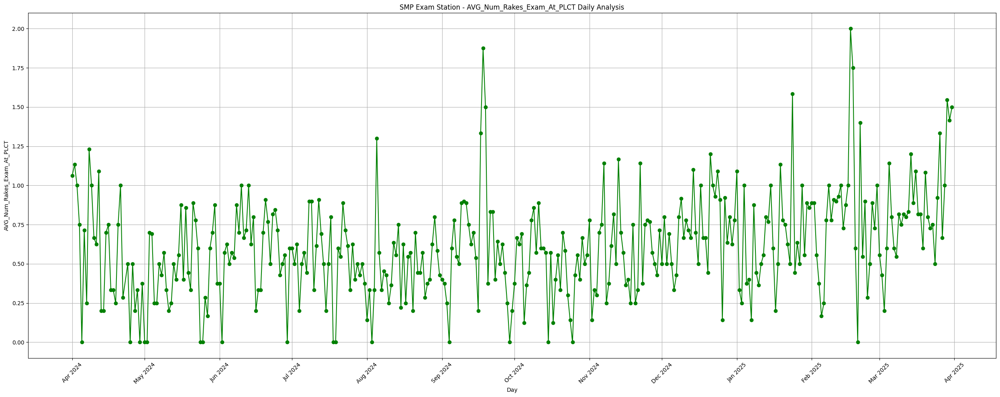

In [70]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(smp_daily['R_DATEOFMONTH'], smp_daily['AVG_Num_Rakes_Exam_At_PLCT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('SMP Exam Station - AVG_Num_Rakes_Exam_At_PLCT Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Exam_At_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

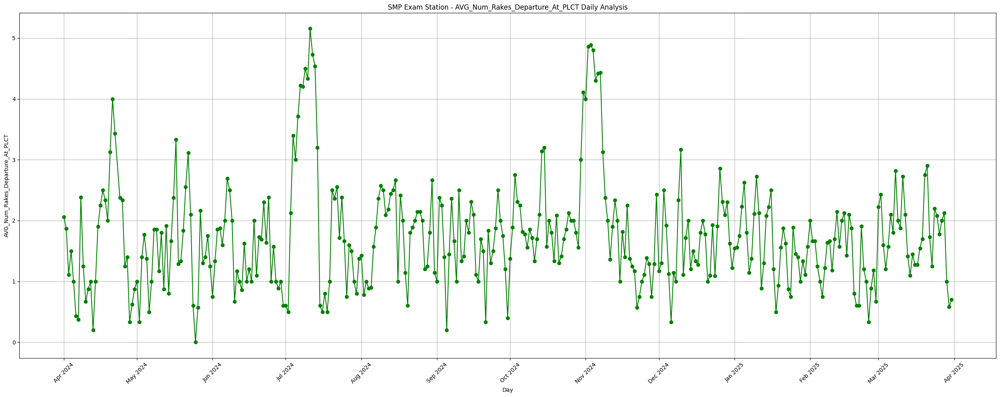

In [71]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(smp_daily['R_DATEOFMONTH'], smp_daily['AVG_Num_Rakes_Departure_At_PLCT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('SMP Exam Station - AVG_Num_Rakes_Departure_At_PLCT Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Departure_At_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

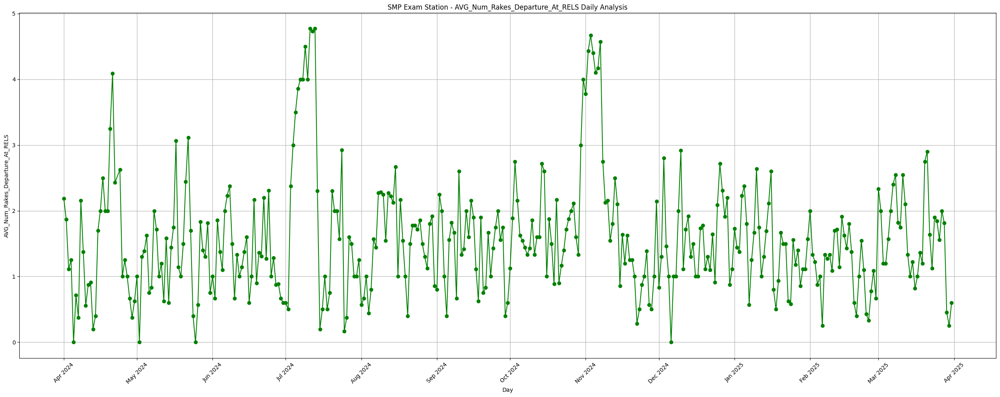

In [72]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(smp_daily['R_DATEOFMONTH'], smp_daily['AVG_Num_Rakes_Departure_At_RELS'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('SMP Exam Station - AVG_Num_Rakes_Departure_At_RELS Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Departure_At_RELS')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

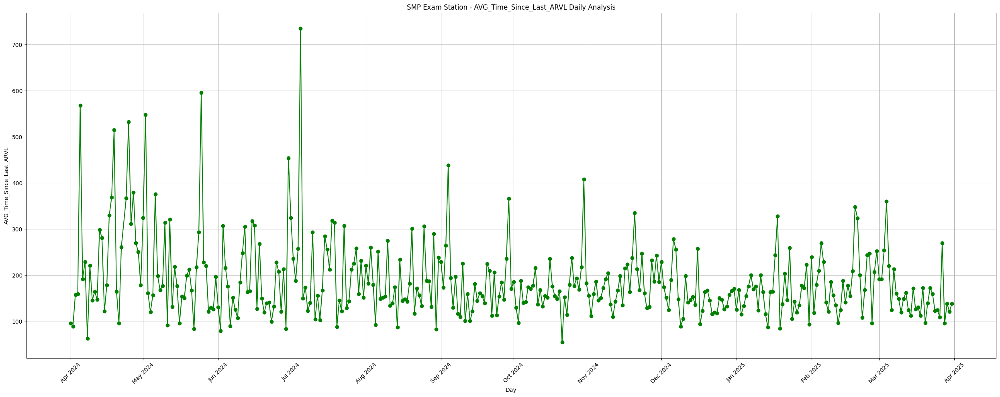

In [73]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(smp_daily['R_DATEOFMONTH'], smp_daily['AVG_Time_Since_Last_ARVL'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('SMP Exam Station - AVG_Time_Since_Last_ARVL Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Time_Since_Last_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

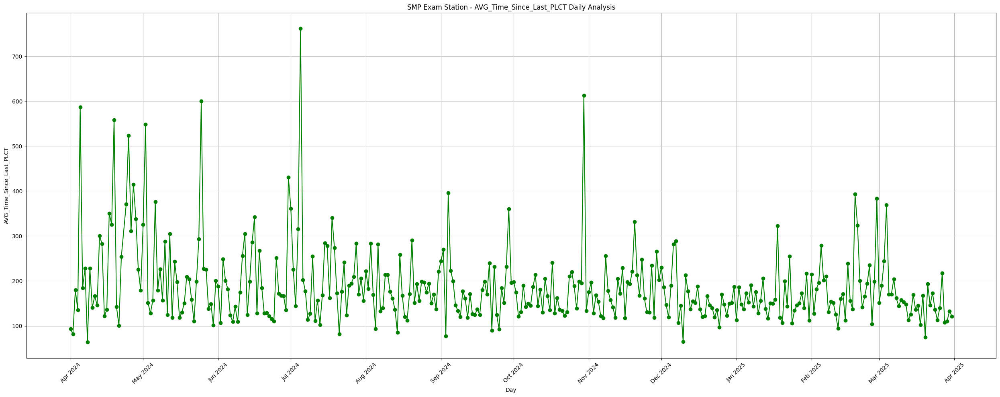

In [74]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(smp_daily['R_DATEOFMONTH'], smp_daily['AVG_Time_Since_Last_PLCT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('SMP Exam Station - AVG_Time_Since_Last_PLCT Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Time_Since_Last_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

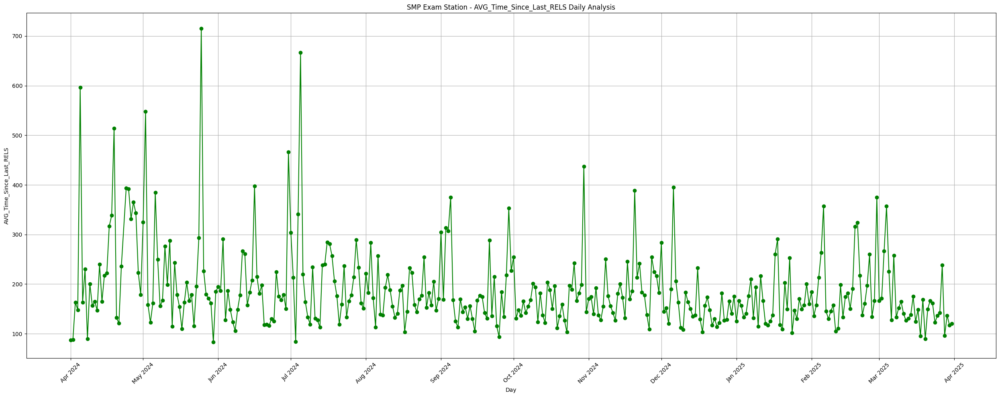

In [75]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(smp_daily['R_DATEOFMONTH'], smp_daily['AVG_Time_Since_Last_RELS'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('SMP Exam Station - AVG_Time_Since_Last_RELS Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Time_Since_Last_RELS')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

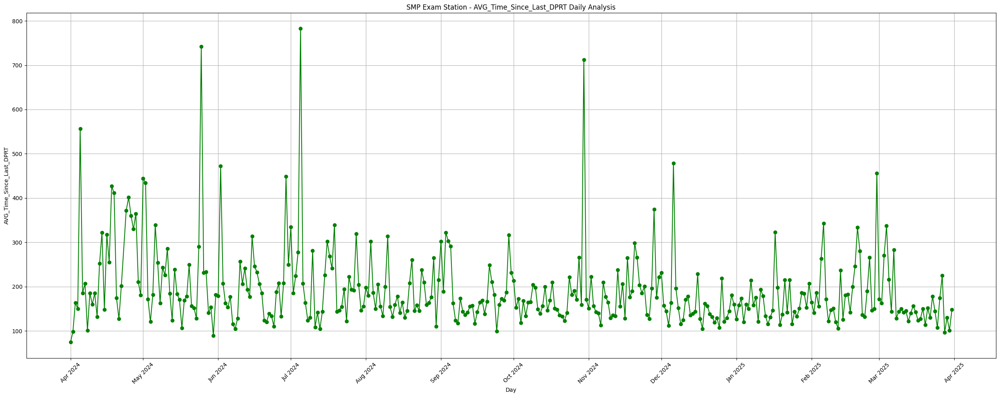

In [76]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(smp_daily['R_DATEOFMONTH'], smp_daily['AVG_Time_Since_Last_DPRT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('SMP Exam Station - AVG_Time_Since_Last_DPRT Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Time_Since_Last_DPRT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

#### Weekend Analysis

In [77]:
smp_weekend = df1.groupby('R_DAYOFWEEK', sort=False)['RDATE'].count().reset_index(name='RAKE_COUNT')
smp_weekend = pd.DataFrame(smp_weekend)

weekend_shunting_time_sum = df1.groupby('R_DAYOFWEEK', sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
weekend_examination_time_sum = df1.groupby('R_DAYOFWEEK', sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
weekend_departure_lag_time_sum = df1.groupby('R_DAYOFWEEK', sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
weekend_numrakes1 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
weekend_numrakes2 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
weekend_numrakes3 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
weekend_numrakes4 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
weekend_numrakes5 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
weekend_numrakes6 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
weekend_timesince1 = df1.groupby('R_DAYOFWEEK', sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
weekend_timesince2 = df1.groupby('R_DAYOFWEEK', sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
weekend_timesince3 = df1.groupby('R_DAYOFWEEK', sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
weekend_timesince4 = df1.groupby('R_DAYOFWEEK', sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

smp_weekend['AVG_SHUNTING_TIME'] = weekend_shunting_time_sum['Shunting_Time'] / smp_weekend['RAKE_COUNT']
smp_weekend['AVG_EXAMINATION_TIME'] = weekend_examination_time_sum['Examination_Time'] / smp_weekend['RAKE_COUNT']
smp_weekend['AVG_DEPARTURE_TIME'] = weekend_departure_lag_time_sum['Departure_Lag'] / smp_weekend['RAKE_COUNT']
smp_weekend['AVG_Num_Rakes_Shunting_At_ARVL'] = weekend_numrakes1['numrakes1'] / smp_weekend['RAKE_COUNT']
smp_weekend['AVG_Num_Rakes_Exam_At_ARVL'] = weekend_numrakes2['numrakes2'] / smp_weekend['RAKE_COUNT']
smp_weekend['AVG_Num_Rakes_Departure_At_ARVL'] = weekend_numrakes3['numrakes3'] / smp_weekend['RAKE_COUNT']
smp_weekend['AVG_Num_Rakes_Exam_At_PLCT'] = weekend_numrakes4['numrakes4'] / smp_weekend['RAKE_COUNT']
smp_weekend['AVG_Num_Rakes_Departure_At_PLCT'] = weekend_numrakes5['numrakes5'] / smp_weekend['RAKE_COUNT']
smp_weekend['AVG_Num_Rakes_Departure_At_RELS'] = weekend_numrakes6['numrakes6'] / smp_weekend['RAKE_COUNT']
smp_weekend['AVG_Time_Since_Last_ARVL'] = weekend_timesince1['timesince1'] / smp_weekend['RAKE_COUNT']
smp_weekend['AVG_Time_Since_Last_PLCT'] = weekend_timesince2['timesince2'] / smp_weekend['RAKE_COUNT']
smp_weekend['AVG_Time_Since_Last_RELS'] = weekend_timesince3['timesince3'] / smp_weekend['RAKE_COUNT']
smp_weekend['AVG_Time_Since_Last_DPRT'] = weekend_timesince4['timesince4'] / smp_weekend['RAKE_COUNT']

smp_weekend

,R_DAYOFWEEK,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,0,467,193.627409,141.710921,256.370450,1.134904,0.843683,1.781585,0.683084,1.788009,1.578158,155.730193,160.376874,163.246253,162.059957
1,1,448,189.834821,159.095982,269.223214,1.200893,0.857143,1.674107,0.705357,1.752232,1.618304,174.082589,165.622768,167.482143,163.241071
2,2,436,167.573394,147.041284,322.300459,1.270642,0.880734,1.708716,0.704128,1.784404,1.646789,170.899083,170.444954,168.965596,173.986239
3,3,414,182.862319,162.140097,271.147343,1.275362,0.760870,1.869565,0.613527,1.951691,1.792271,177.852657,176.521739,176.978261,179.548309
4,4,440,184.311364,148.375000,362.043182,1.336364,0.790909,1.822727,0.643182,1.861364,1.661364,171.325000,177.513636,172.902273,173.120455
5,5,437,192.855835,140.643021,331.299771,1.249428,0.739130,1.915332,0.620137,1.926773,1.771167,170.858124,171.464531,166.411899,169.068650
6,6,458,370.229258,139.914847,337.056769,1.237991,0.779476,1.713974,0.615721,1.744541,1.537118,166.853712,165.447598,170.873362,166.449782


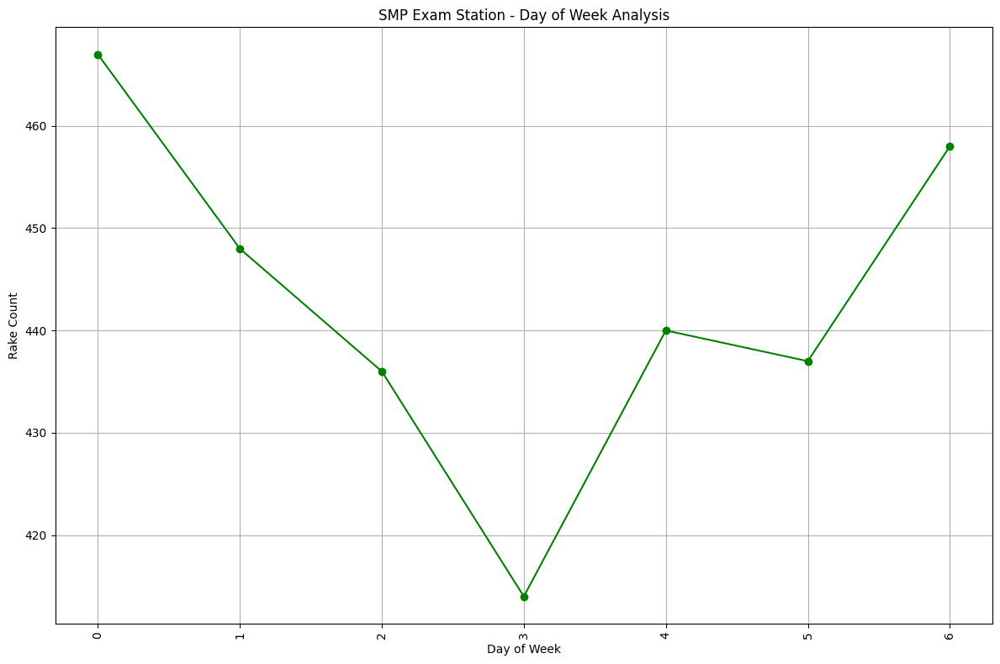

In [78]:
plt.figure(figsize=(12,8))
plt.plot(smp_weekend['R_DAYOFWEEK'], smp_weekend['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('SMP Exam Station - Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Rake Count')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

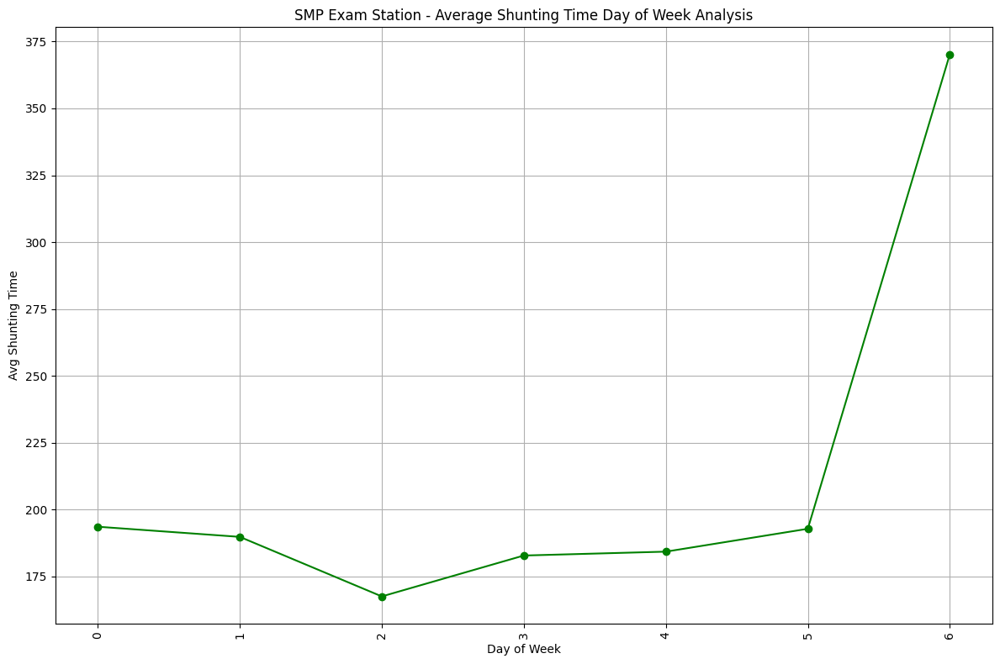

In [79]:
plt.figure(figsize=(12,8))
plt.plot(smp_weekend['R_DAYOFWEEK'], smp_weekend['AVG_SHUNTING_TIME'], marker='o', linestyle='-', color='green')
plt.title('SMP Exam Station - Average Shunting Time Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Avg Shunting Time')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

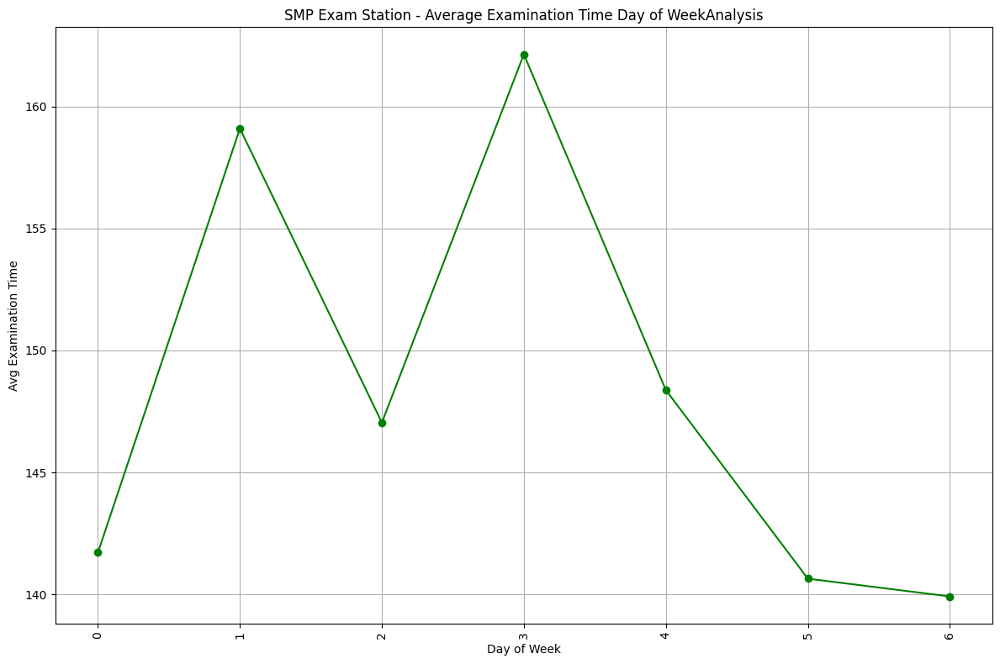

In [80]:
plt.figure(figsize=(12,8))
plt.plot(smp_weekend['R_DAYOFWEEK'], smp_weekend['AVG_EXAMINATION_TIME'], marker='o', linestyle='-', color='green')
plt.title('SMP Exam Station - Average Examination Time Day of WeekAnalysis')
plt.xlabel('Day of Week')
plt.ylabel('Avg Examination Time')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

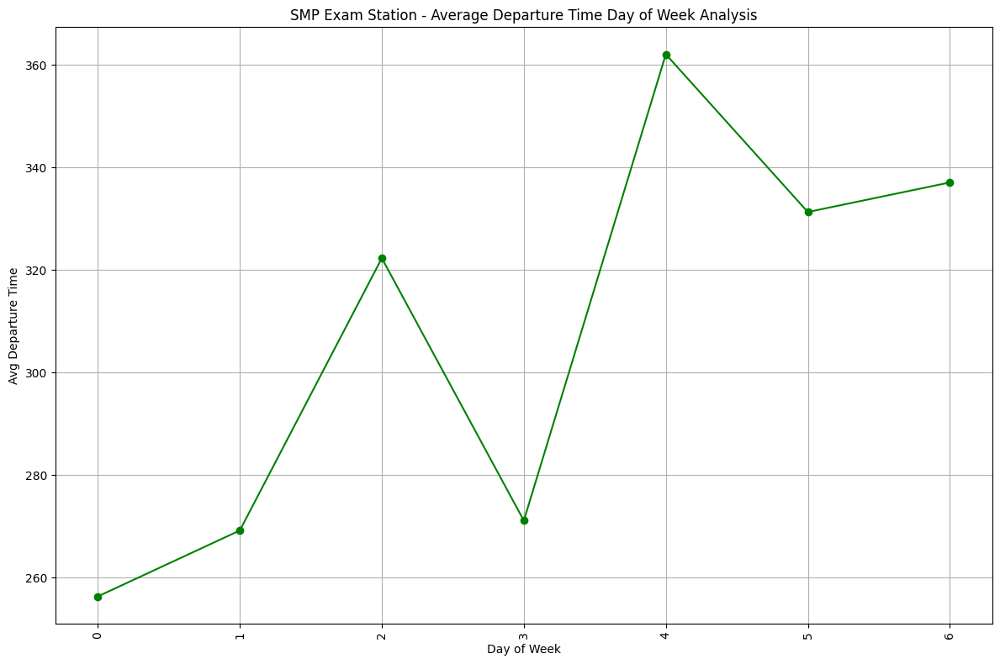

In [81]:
plt.figure(figsize=(12,8))
plt.plot(smp_weekend['R_DAYOFWEEK'], smp_weekend['AVG_DEPARTURE_TIME'], marker='o', linestyle='-', color='green')
plt.title('SMP Exam Station - Average Departure Time Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Avg Departure Time')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

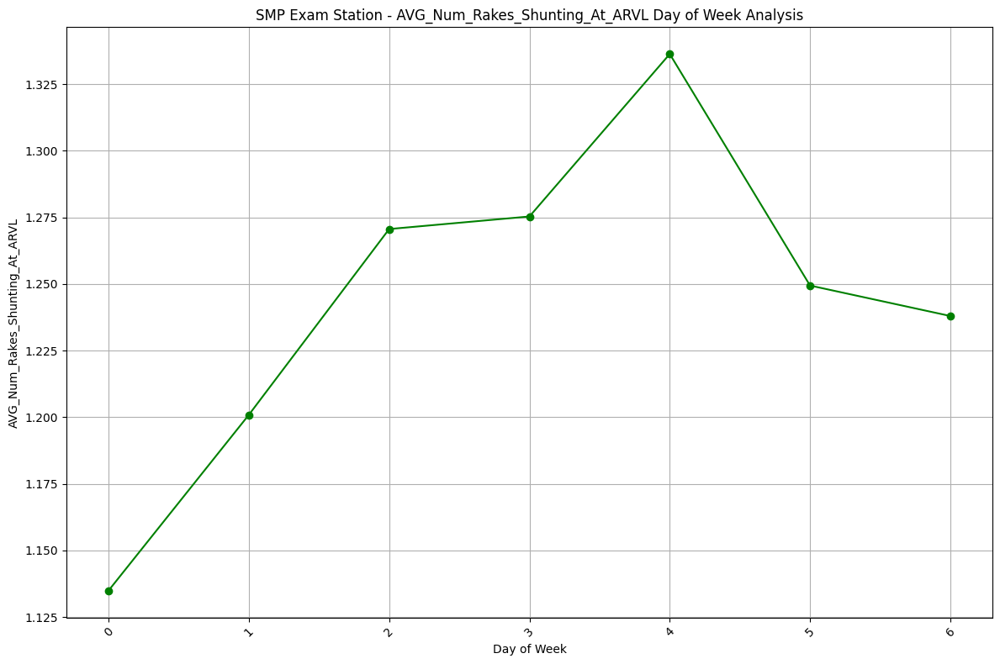

In [82]:
plt.figure(figsize=(12,8))
plt.plot(smp_weekend['R_DAYOFWEEK'], smp_weekend['AVG_Num_Rakes_Shunting_At_ARVL'], marker='o', linestyle='-', color='green')
plt.title('SMP Exam Station - AVG_Num_Rakes_Shunting_At_ARVL Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

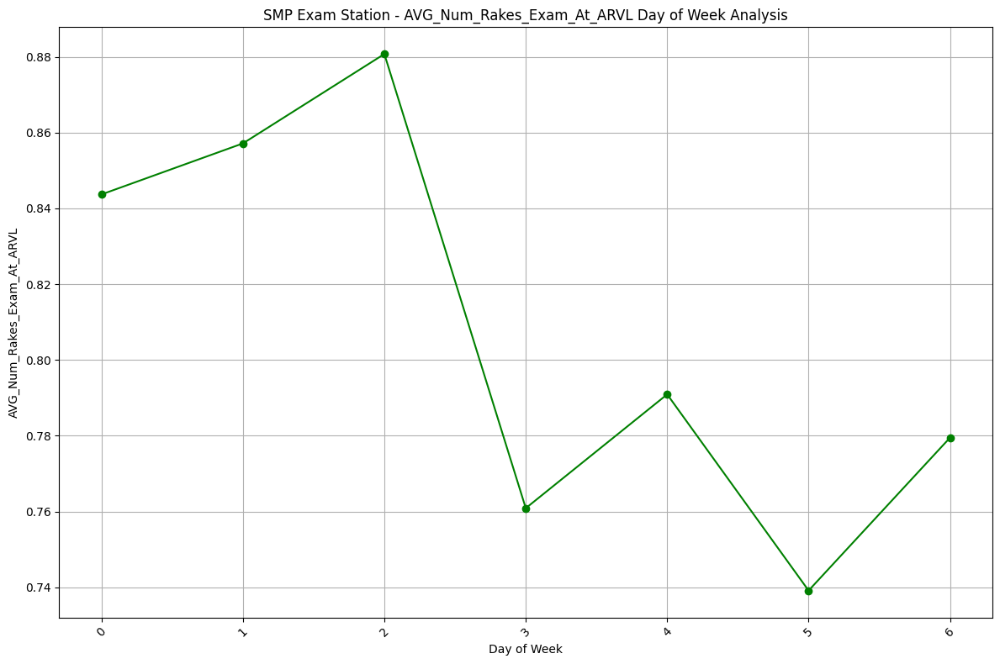

In [83]:
plt.figure(figsize=(12,8))
plt.plot(smp_weekend['R_DAYOFWEEK'], smp_weekend['AVG_Num_Rakes_Exam_At_ARVL'], marker='o', linestyle='-', color='green')
plt.title('SMP Exam Station - AVG_Num_Rakes_Exam_At_ARVL Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Exam_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

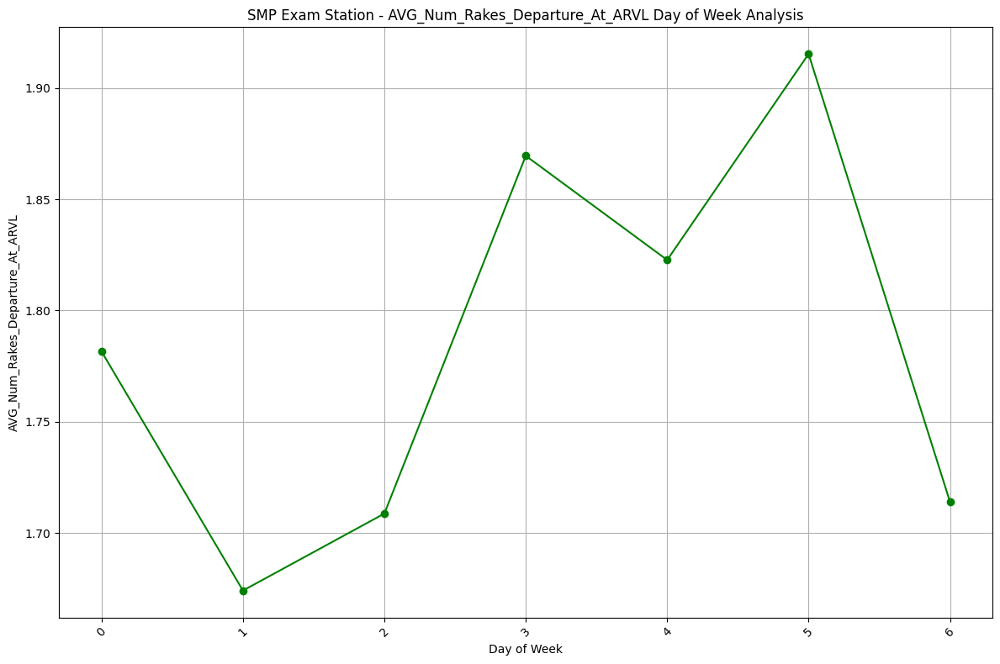

In [84]:
plt.figure(figsize=(12,8))
plt.plot(smp_weekend['R_DAYOFWEEK'], smp_weekend['AVG_Num_Rakes_Departure_At_ARVL'], marker='o', linestyle='-', color='green')
plt.title('SMP Exam Station - AVG_Num_Rakes_Departure_At_ARVL Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Departure_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

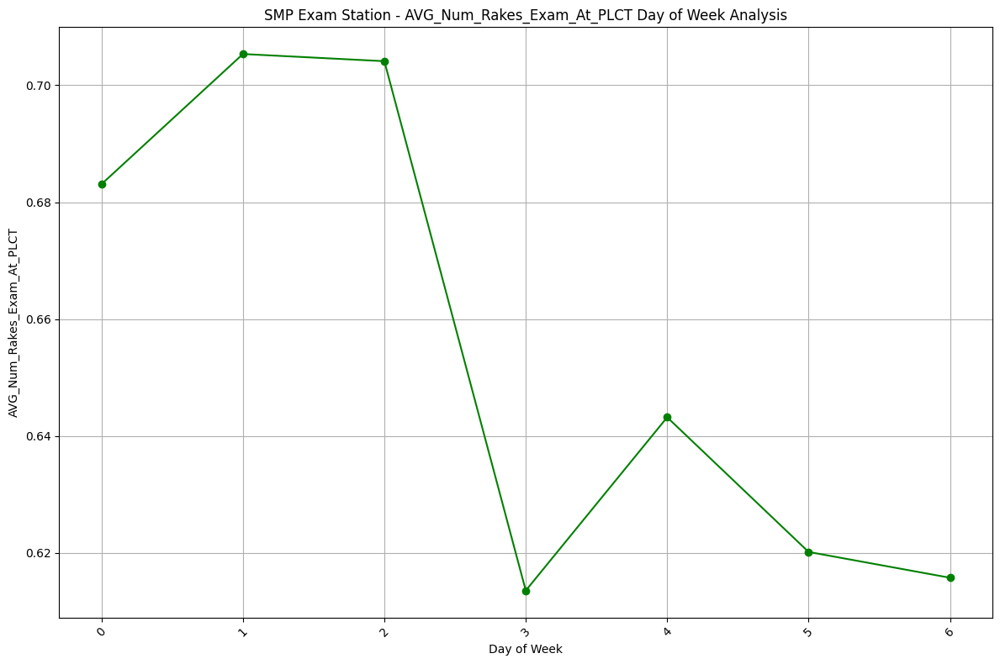

In [85]:
plt.figure(figsize=(12,8))
plt.plot(smp_weekend['R_DAYOFWEEK'], smp_weekend['AVG_Num_Rakes_Exam_At_PLCT'], marker='o', linestyle='-', color='green')
plt.title('SMP Exam Station - AVG_Num_Rakes_Exam_At_PLCT Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Exam_At_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

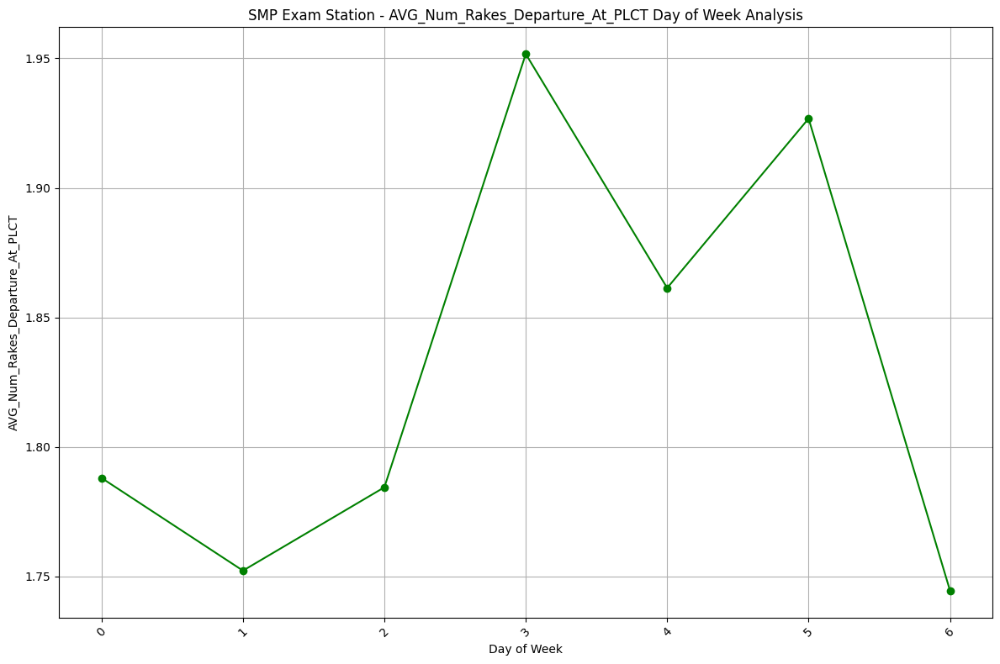

In [86]:
plt.figure(figsize=(12,8))
plt.plot(smp_weekend['R_DAYOFWEEK'], smp_weekend['AVG_Num_Rakes_Departure_At_PLCT'], marker='o', linestyle='-', color='green')
plt.title('SMP Exam Station - AVG_Num_Rakes_Departure_At_PLCT Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Departure_At_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

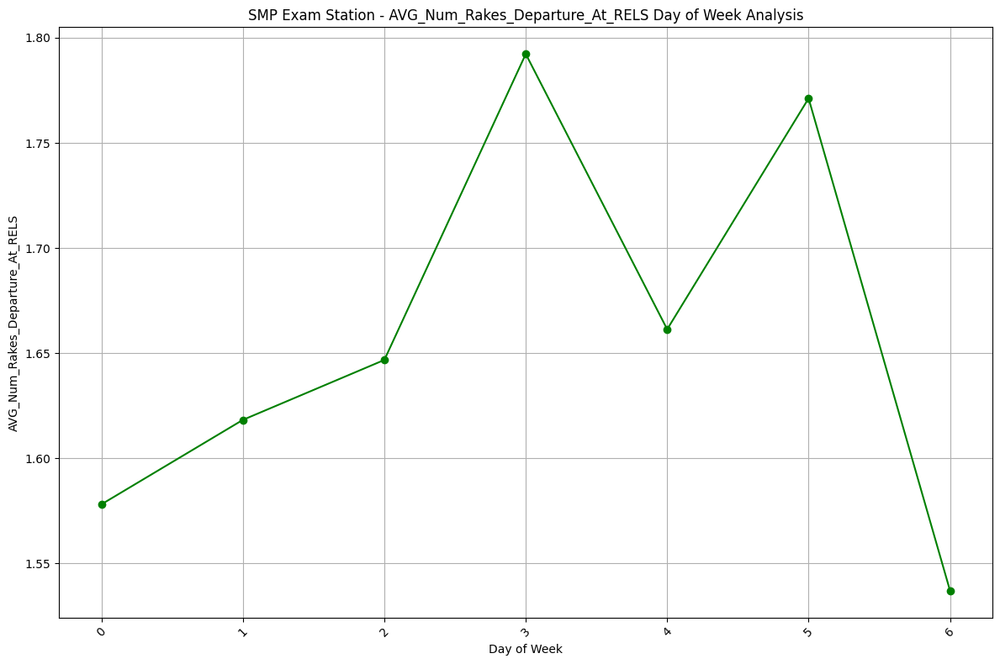

In [87]:
plt.figure(figsize=(12,8))
plt.plot(smp_weekend['R_DAYOFWEEK'], smp_weekend['AVG_Num_Rakes_Departure_At_RELS'], marker='o', linestyle='-', color='green')
plt.title('SMP Exam Station - AVG_Num_Rakes_Departure_At_RELS Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Departure_At_RELS')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

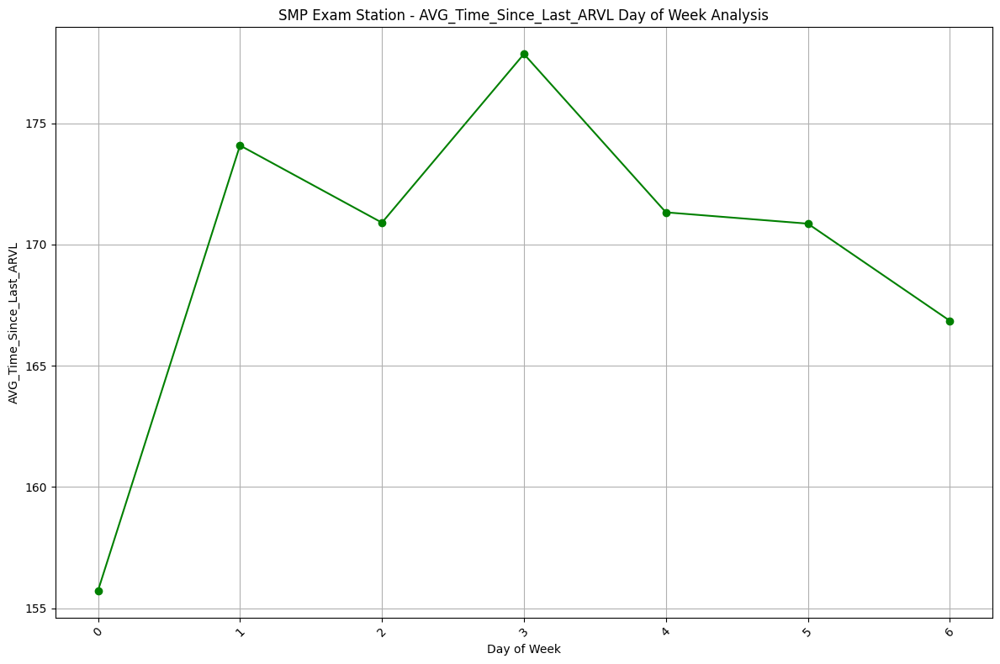

In [88]:
plt.figure(figsize=(12,8))
plt.plot(smp_weekend['R_DAYOFWEEK'], smp_weekend['AVG_Time_Since_Last_ARVL'], marker='o', linestyle='-', color='green')
plt.title('SMP Exam Station - AVG_Time_Since_Last_ARVL Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Time_Since_Last_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

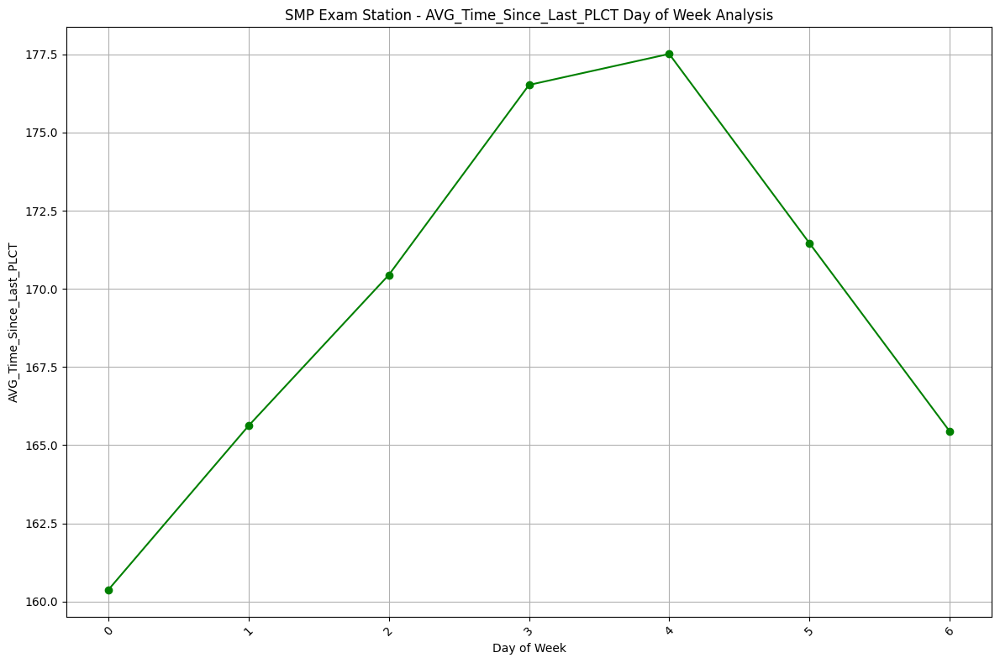

In [89]:
plt.figure(figsize=(12,8))
plt.plot(smp_weekend['R_DAYOFWEEK'], smp_weekend['AVG_Time_Since_Last_PLCT'], marker='o', linestyle='-', color='green')
plt.title('SMP Exam Station - AVG_Time_Since_Last_PLCT Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Time_Since_Last_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

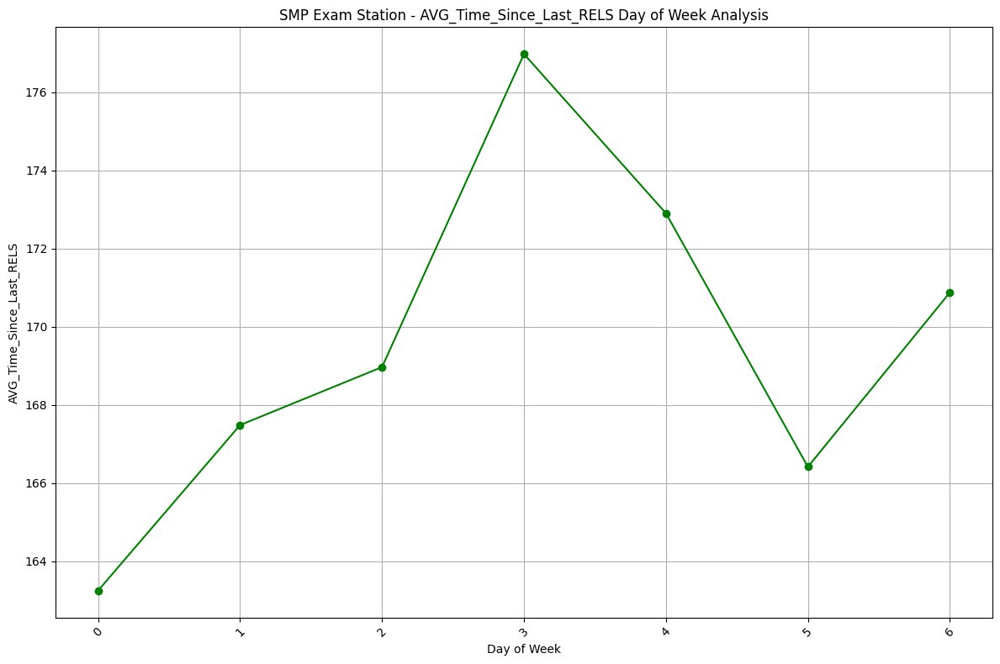

In [90]:
plt.figure(figsize=(12,8))
plt.plot(smp_weekend['R_DAYOFWEEK'], smp_weekend['AVG_Time_Since_Last_RELS'], marker='o', linestyle='-', color='green')
plt.title('SMP Exam Station - AVG_Time_Since_Last_RELS Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Time_Since_Last_RELS')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

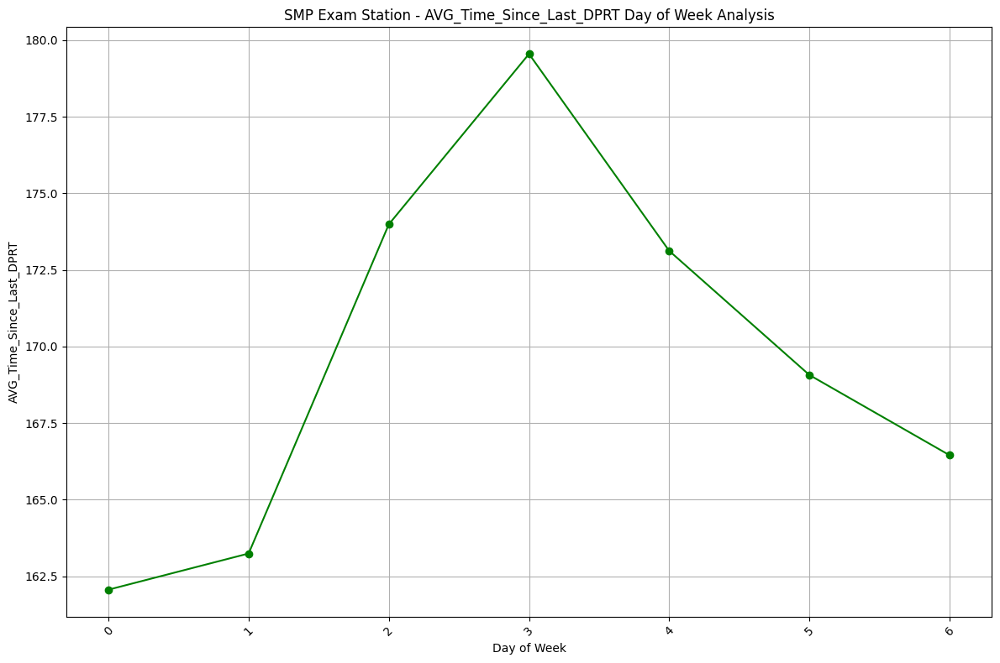

In [91]:
plt.figure(figsize=(12,8))
plt.plot(smp_weekend['R_DAYOFWEEK'], smp_weekend['AVG_Time_Since_Last_DPRT'], marker='o', linestyle='-', color='green')
plt.title('SMP Exam Station - AVG_Time_Since_Last_DPRT Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Time_Since_Last_DPRT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

#### Hourly Analysis

In [92]:
smp_arvl_h = smp.groupby('ARVL_H')['RDATE'].count().reset_index(name='RAKE_COUNT')
smp_arvl_h = pd.DataFrame(smp_arvl_h)
smp_plct_h = smp.groupby('PLCT_H')['RDATE'].count().reset_index(name='RAKE_COUNT')
smp_plct_h = pd.DataFrame(smp_plct_h)
smp_rels_h = smp.groupby('RELS_H')['RDATE'].count().reset_index(name='RAKE_COUNT')
smp_rels_h = pd.DataFrame(smp_rels_h)
smp_dprt_h = smp.groupby('DPRT_H')['RDATE'].count().reset_index(name='RAKE_COUNT')
smp_dprt_h = pd.DataFrame(smp_dprt_h)

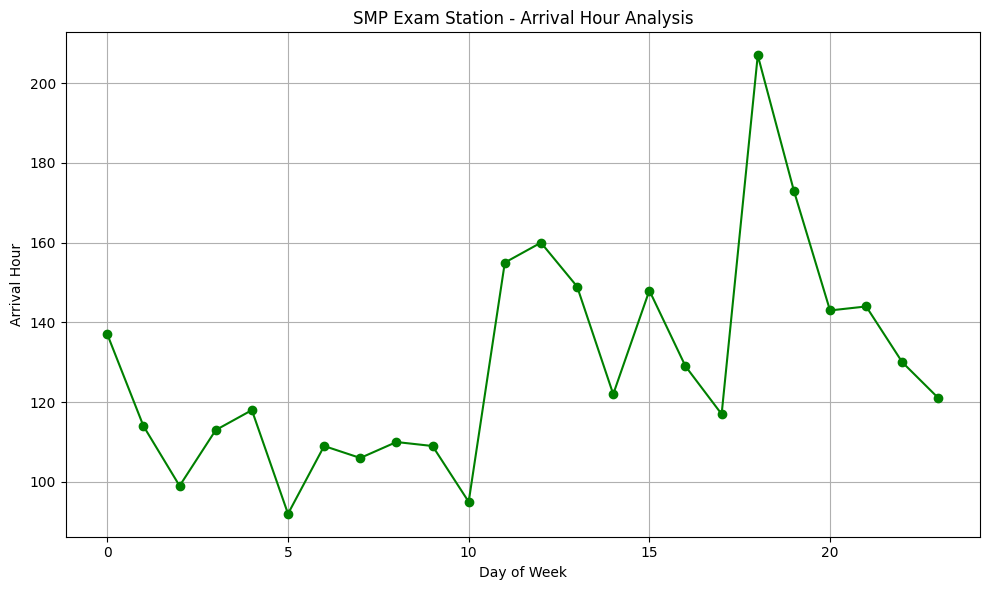

In [93]:
plt.figure(figsize=(10,6))
plt.plot(smp_arvl_h['ARVL_H'], smp_arvl_h['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('SMP Exam Station - Arrival Hour Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Arrival Hour')
plt.grid(True)
plt.tight_layout()
plt.show()

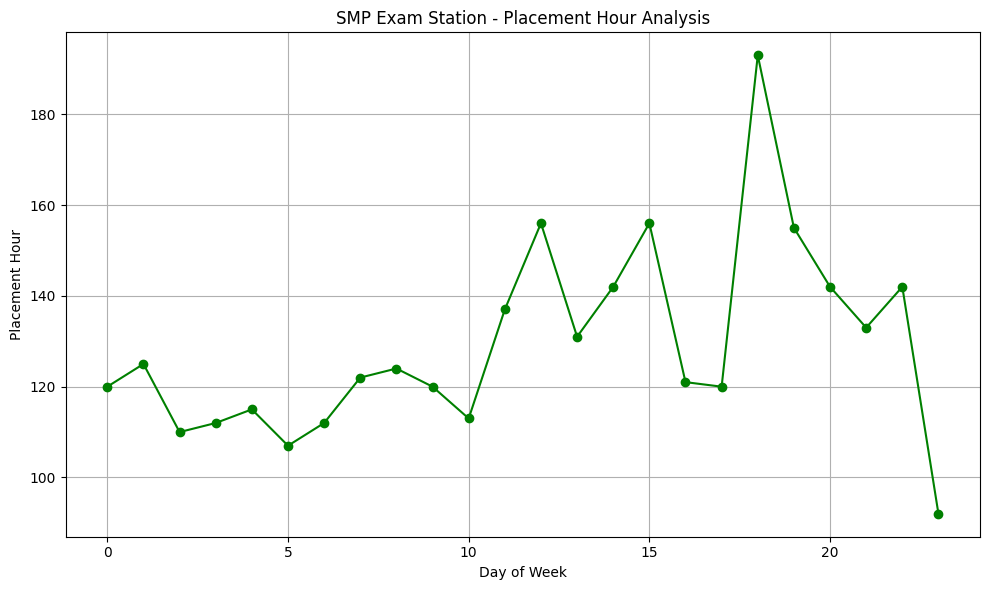

In [94]:
plt.figure(figsize=(10,6))
plt.plot(smp_plct_h['PLCT_H'], smp_plct_h['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('SMP Exam Station - Placement Hour Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Placement Hour')
plt.grid(True)
plt.tight_layout()
plt.show()

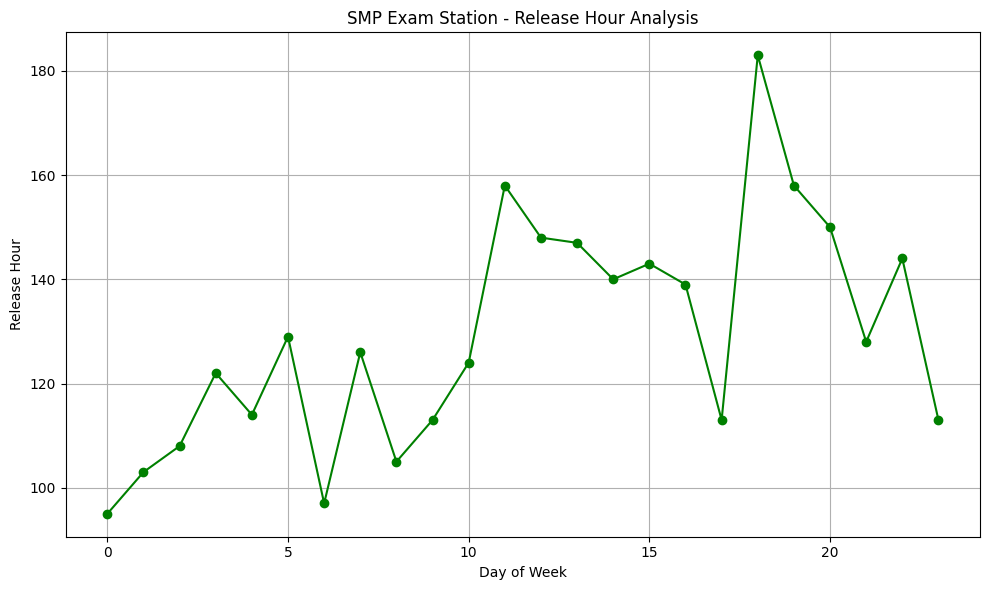

In [95]:
plt.figure(figsize=(10,6))
plt.plot(smp_rels_h['RELS_H'], smp_rels_h['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('SMP Exam Station - Release Hour Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Release Hour')
plt.grid(True)
plt.tight_layout()
plt.show()

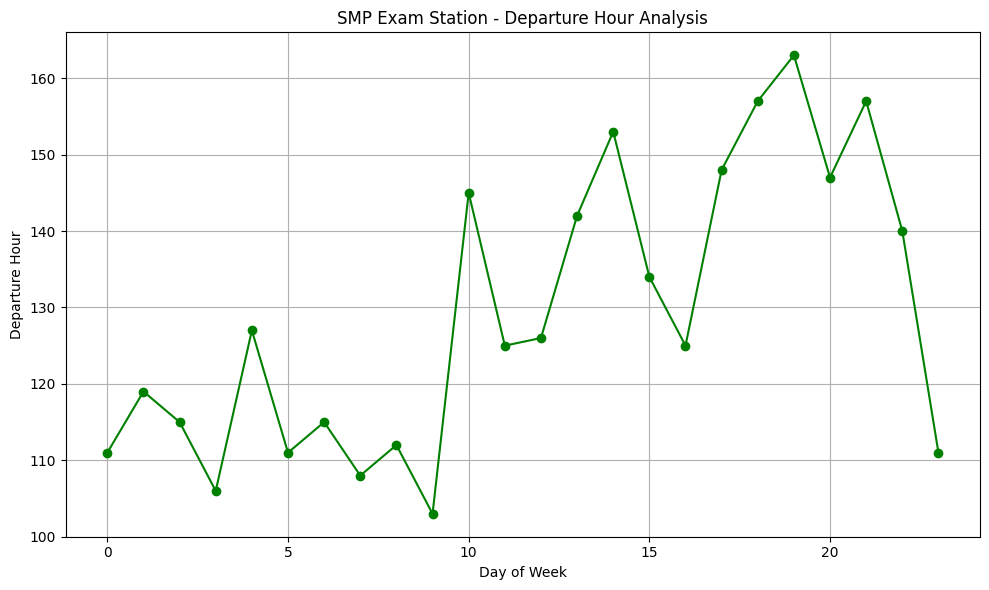

In [96]:
plt.figure(figsize=(10,6))
plt.plot(smp_dprt_h['DPRT_H'], smp_dprt_h['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('SMP Exam Station - Departure Hour Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Departure Hour')
plt.grid(True)
plt.tight_layout()
plt.show()

In [97]:
corr_df = df1.copy()

In [98]:
corr_df['R_DATEOFMONTH'] = corr_df['R_DATEOFMONTH'].str.split('-').str[2].astype('int64')
corr_df['R_MONTH'] = corr_df['R_MONTH'].str.split('-').str[1].astype('int64')
corr_df['R_WEEK'] = corr_df['R_WEEK'].str.split('-').str[1].astype('int64')

corr_df.drop(columns=['RDATE','RAKETYPE','EXAMSTTN','ZONE'], axis=1, inplace=True)

In [99]:
corr = corr_df.corr()

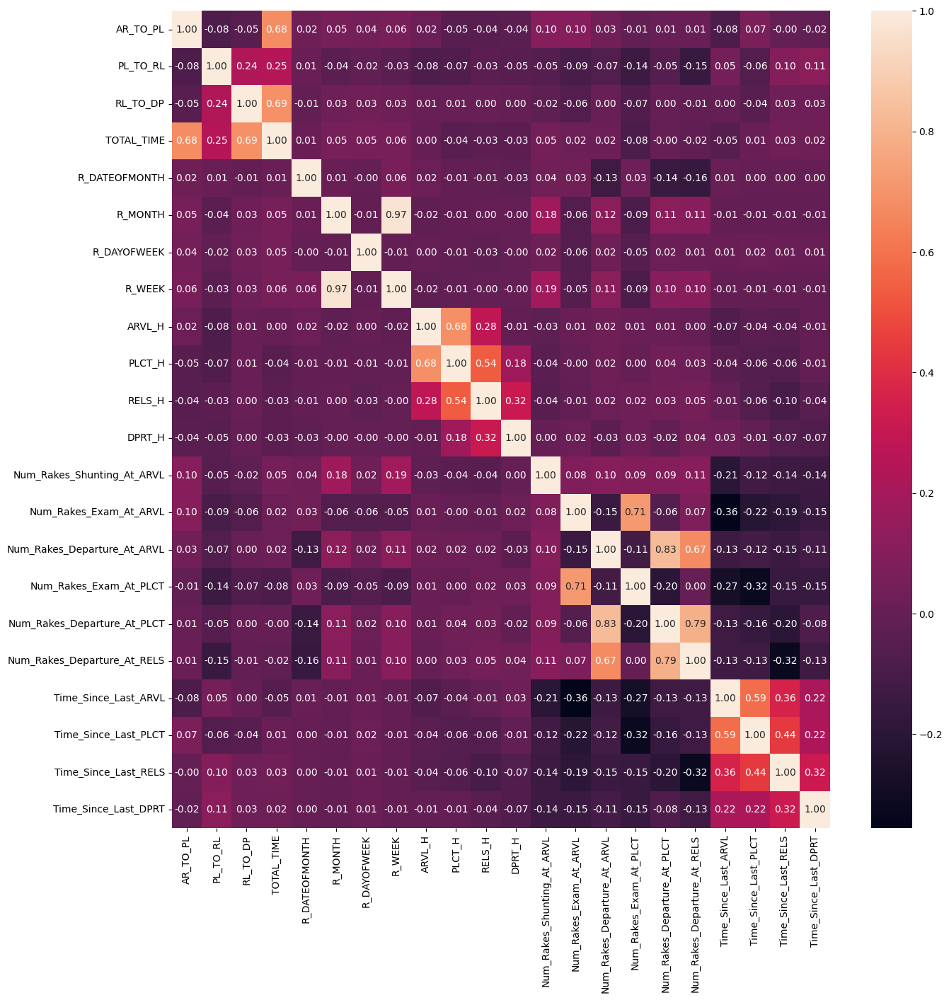

In [100]:
plt.figure(figsize=(15,15))
sns.heatmap(corr, annot=True, fmt=".2f")
plt.show()

#### 10 new feature analysis

In [101]:
df1[['Num_Rakes_Shunting_At_ARVL','Num_Rakes_Exam_At_ARVL','Num_Rakes_Departure_At_ARVL','Num_Rakes_Exam_At_PLCT','Num_Rakes_Departure_At_PLCT','Num_Rakes_Departure_At_RELS','Time_Since_Last_ARVL','Time_Since_Last_PLCT','Time_Since_Last_RELS','Time_Since_Last_DPRT']].describe()

,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
count,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000
mean,1.242258,0.808065,1.782258,0.655484,1.827742,1.655161,169.459677,169.451613,169.440323,169.450000
std,1.454601,0.639356,1.178766,0.626936,1.191561,1.189712,168.886523,163.065595,148.181266,153.555551
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,50.000000,45.000000,60.000000,53.000000
50%,1.000000,1.000000,2.000000,1.000000,2.000000,1.000000,125.000000,135.000000,145.000000,136.000000
75%,2.000000,1.000000,2.000000,1.000000,2.000000,2.000000,230.000000,235.000000,235.000000,236.000000
max,7.000000,3.000000,7.000000,3.000000,7.000000,7.000000,1885.000000,1885.000000,1795.000000,1602.000000


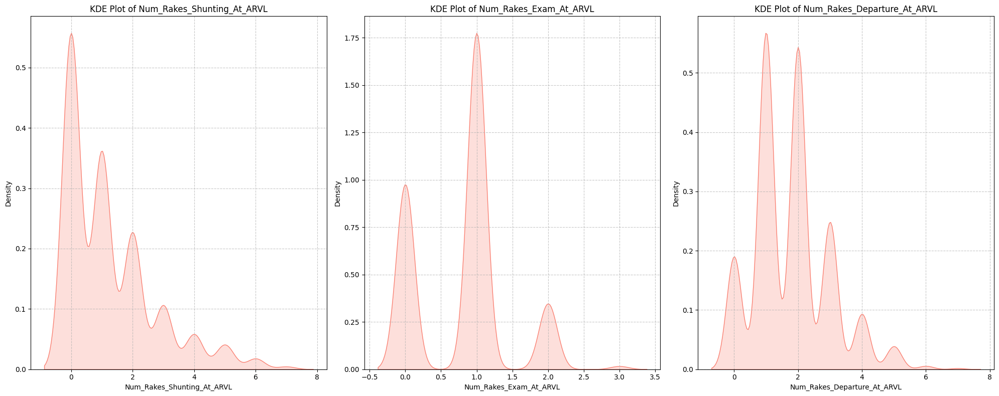

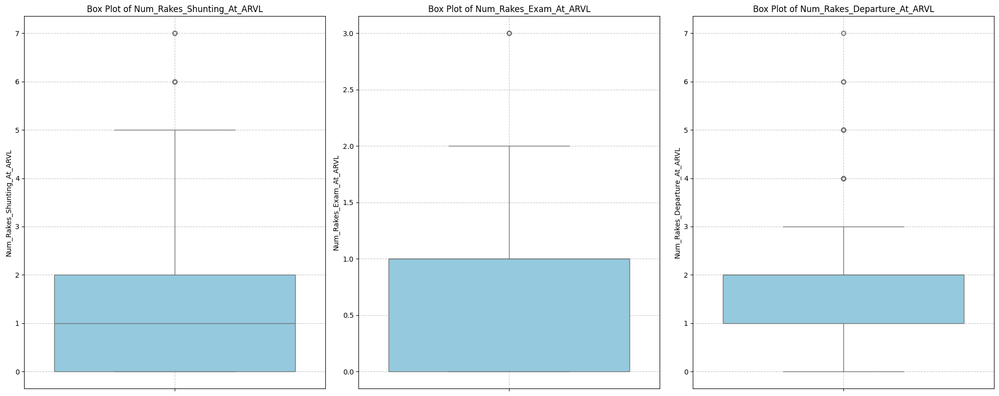

In [102]:
plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
sns.kdeplot(df1['Num_Rakes_Shunting_At_ARVL'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Shunting_At_ARVL')
plt.xlabel('Num_Rakes_Shunting_At_ARVL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.kdeplot(df1['Num_Rakes_Exam_At_ARVL'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Exam_At_ARVL')
plt.xlabel('Num_Rakes_Exam_At_ARVL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.kdeplot(df1['Num_Rakes_Departure_At_ARVL'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Departure_At_ARVL')
plt.xlabel('Num_Rakes_Departure_At_ARVL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
sns.boxplot(y=df1['Num_Rakes_Shunting_At_ARVL'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Shunting_At_ARVL')
plt.ylabel('Num_Rakes_Shunting_At_ARVL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.boxplot(y=df1['Num_Rakes_Exam_At_ARVL'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Exam_At_ARVL')
plt.ylabel('Num_Rakes_Exam_At_ARVL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.boxplot(y=df1['Num_Rakes_Departure_At_ARVL'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Departure_At_ARVL')
plt.ylabel('Num_Rakes_Departure_At_ARVL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

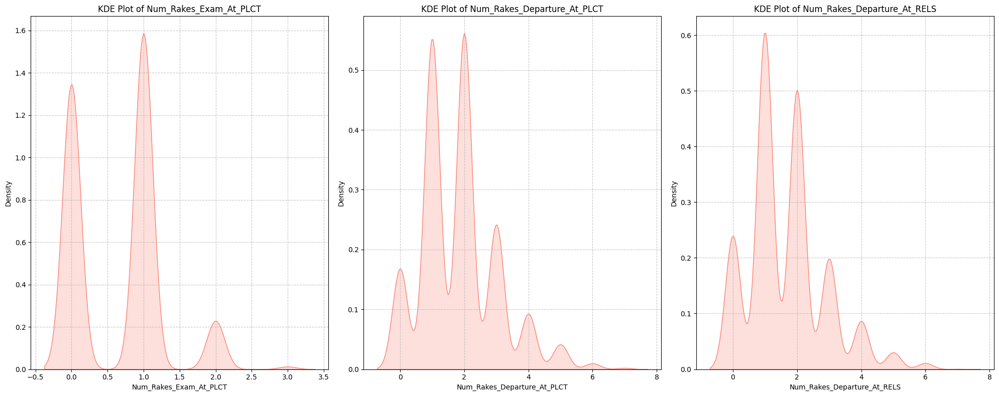

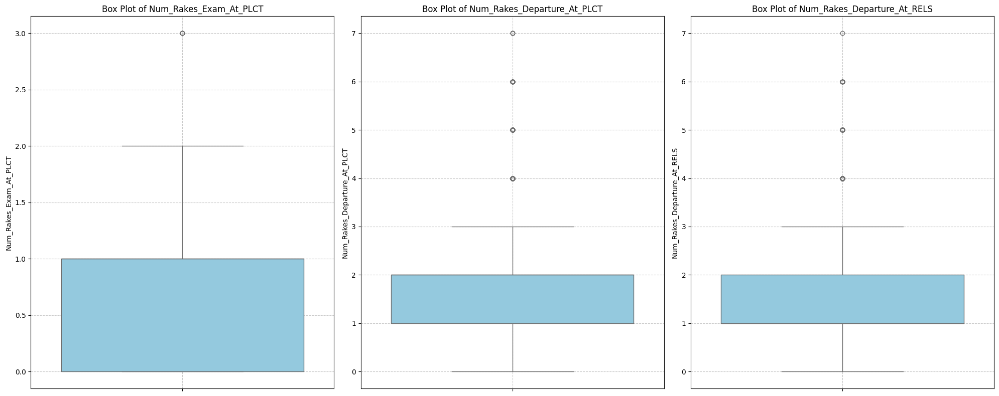

In [103]:
plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
sns.kdeplot(df1['Num_Rakes_Exam_At_PLCT'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Exam_At_PLCT')
plt.xlabel('Num_Rakes_Exam_At_PLCT')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.kdeplot(df1['Num_Rakes_Departure_At_PLCT'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Departure_At_PLCT')
plt.xlabel('Num_Rakes_Departure_At_PLCT')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.kdeplot(df1['Num_Rakes_Departure_At_RELS'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Departure_At_RELS')
plt.xlabel('Num_Rakes_Departure_At_RELS')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
sns.boxplot(y=df1['Num_Rakes_Exam_At_PLCT'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Exam_At_PLCT')
plt.ylabel('Num_Rakes_Exam_At_PLCT')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.boxplot(y=df1['Num_Rakes_Departure_At_PLCT'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Departure_At_PLCT')
plt.ylabel('Num_Rakes_Departure_At_PLCT')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.boxplot(y=df1['Num_Rakes_Departure_At_RELS'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Departure_At_RELS')
plt.ylabel('Num_Rakes_Departure_At_RELS')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

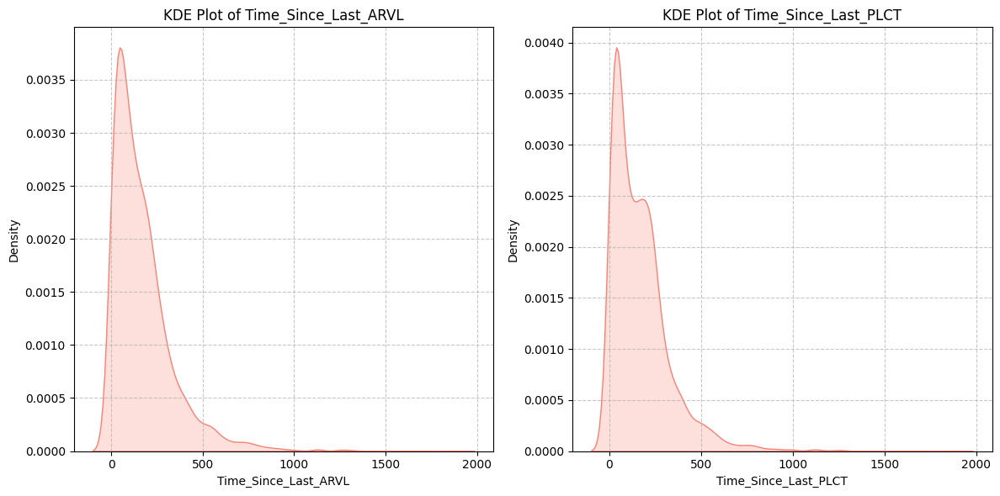

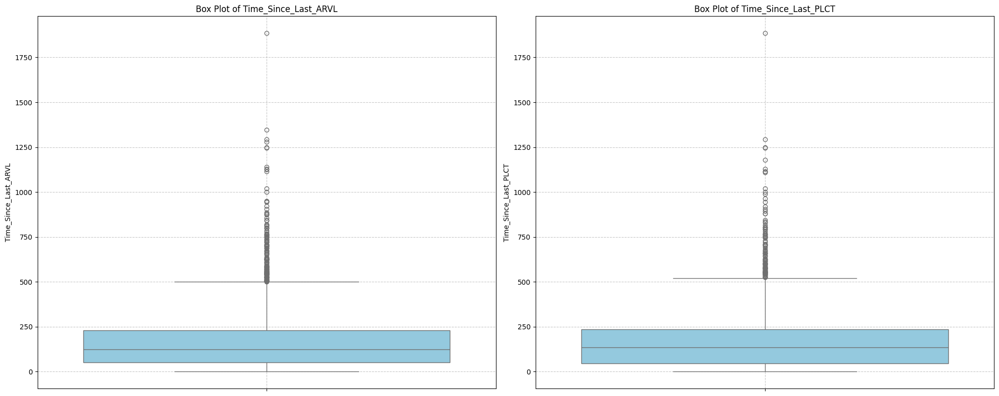

In [104]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(df1['Time_Since_Last_ARVL'], fill=True, color='salmon')
plt.title('KDE Plot of Time_Since_Last_ARVL')
plt.xlabel('Time_Since_Last_ARVL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(df1['Time_Since_Last_PLCT'], fill=True, color='salmon')
plt.title('KDE Plot of Time_Since_Last_PLCT')
plt.xlabel('Time_Since_Last_PLCT')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(20, 8))

plt.subplot(1, 2, 1)
sns.boxplot(y=df1['Time_Since_Last_ARVL'], color='skyblue')
plt.title('Box Plot of Time_Since_Last_ARVL')
plt.ylabel('Time_Since_Last_ARVL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=df1['Time_Since_Last_PLCT'], color='skyblue')
plt.title('Box Plot of Time_Since_Last_PLCT')
plt.ylabel('Time_Since_Last_PLCT')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

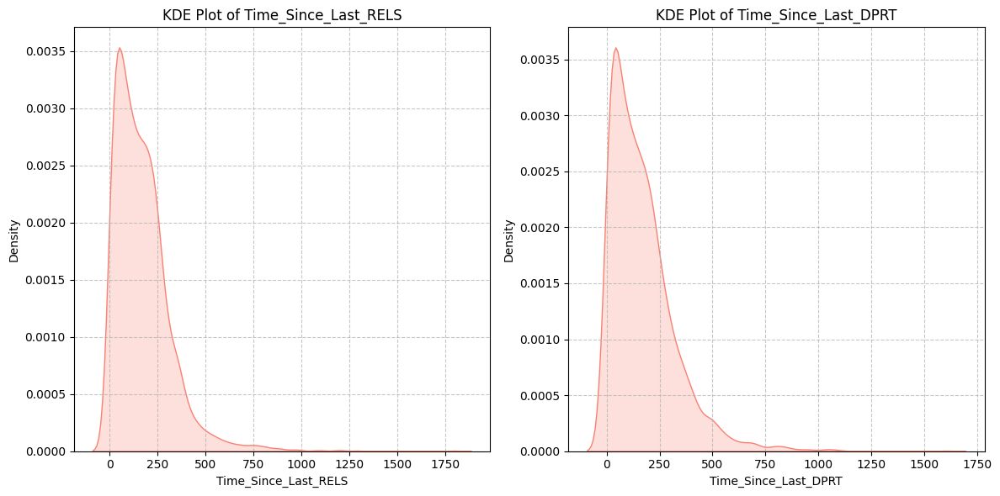

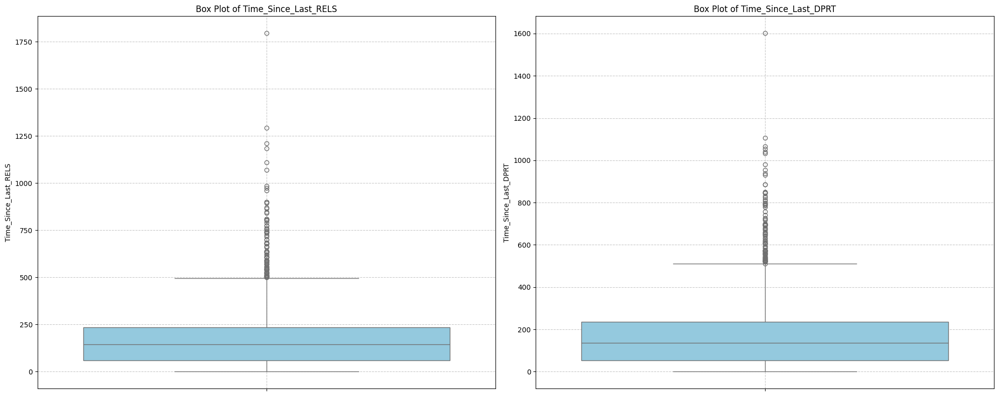

In [105]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(df1['Time_Since_Last_RELS'], fill=True, color='salmon')
plt.title('KDE Plot of Time_Since_Last_RELS')
plt.xlabel('Time_Since_Last_RELS')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(df1['Time_Since_Last_DPRT'], fill=True, color='salmon')
plt.title('KDE Plot of Time_Since_Last_DPRT')
plt.xlabel('Time_Since_Last_DPRT')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(20, 8))

plt.subplot(1, 2, 1)
sns.boxplot(y=df1['Time_Since_Last_RELS'], color='skyblue')
plt.title('Box Plot of Time_Since_Last_RELS')
plt.ylabel('Time_Since_Last_RELS')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=df1['Time_Since_Last_DPRT'], color='skyblue')
plt.title('Box Plot of Time_Since_Last_DPRT')
plt.ylabel('Time_Since_Last_DPRT')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

### Handling Outliers on the basis of EDA

#### outliers removal

In [106]:
smp_daily

,R_DATEOFMONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04-01,16,69.937500,108.125000,198.875000,0.500000,1.000000,2.000000,1.062500,2.062500,2.187500,96.187500,93.750000,87.187500,74.375000
1,2024-04-02,15,13.866667,135.400000,172.933333,0.466667,1.133333,1.600000,1.133333,1.866667,1.866667,89.400000,81.333333,88.333333,98.266667
2,2024-04-03,9,91.444444,202.222222,212.888889,0.444444,1.000000,1.000000,1.000000,1.111111,1.111111,158.222222,180.000000,163.333333,163.777778
3,2024-04-04,8,18.875000,177.500000,209.125000,0.000000,0.875000,1.250000,0.750000,1.500000,1.250000,159.500000,135.000000,148.125000,149.750000
4,2024-04-05,3,25.000000,321.666667,321.333333,0.000000,0.333333,1.000000,0.000000,1.000000,0.000000,568.333333,586.666667,596.666667,556.666667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360,2025-03-27,6,6.666667,233.333333,239.833333,0.000000,0.833333,1.833333,0.666667,2.000000,2.000000,270.000000,217.500000,238.333333,225.166667
359,2025-03-28,16,87.500000,218.437500,298.875000,4.250000,1.125000,2.000000,1.000000,2.125000,1.812500,96.250000,107.750000,96.187500,96.937500
363,2025-03-29,11,116.818182,241.272727,85.090909,5.727273,1.454545,1.454545,1.545455,1.000000,0.454545,138.636364,110.545455,136.909091,129.909091
362,2025-03-30,12,1155.333333,192.083333,89.166667,3.583333,1.666667,1.000000,1.416667,0.583333,0.250000,121.250000,133.000000,117.500000,101.333333


In [107]:
smp_daily.describe()

,R_DATEOFMONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
count,364,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000
mean,2024-09-30 10:32:58.021978112,8.516484,198.513699,150.323799,311.658249,1.097213,0.756444,1.699943,0.609713,1.742792,1.568027,187.068580,187.801032,188.651400,192.259734
min,2024-04-01 00:00:00,2.000000,1.625000,0.000000,47.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,54.900000,63.461538,82.812500,74.375000
25%,2024-07-01 18:00:00,7.000000,40.875000,119.125000,193.833333,0.200000,0.500000,1.125000,0.375000,1.142857,1.000000,133.684066,134.916667,136.442308,140.958333
50%,2024-09-30 12:00:00,9.000000,105.472527,142.321429,239.750000,0.707143,0.750000,1.600000,0.600000,1.666667,1.444444,166.812500,167.625000,166.742424,166.937500
75%,2024-12-30 06:00:00,10.000000,208.573864,173.125000,322.361111,1.620629,1.000000,2.142857,0.800000,2.125000,2.000000,218.150000,210.000000,213.625000,210.281250
max,2025-03-31 00:00:00,16.000000,2429.000000,681.875000,5344.625000,5.818182,2.000000,5.153846,2.000000,5.153846,4.769231,734.500000,761.500000,715.000000,782.500000
std,NaN,2.703381,311.819593,59.818657,392.294165,1.185567,0.339166,0.876560,0.325471,0.885842,0.891318,84.946312,87.607000,83.424387,88.917402


In [108]:
df1['R_DATEOFMONTH'] = pd.to_datetime(df1['R_DATEOFMONTH'], format='%Y-%m-%d')

In [109]:
merged_smp_df = pd.merge(df1, smp_daily[['R_DATEOFMONTH', 'AVG_SHUNTING_TIME','AVG_EXAMINATION_TIME','AVG_DEPARTURE_TIME']], on='R_DATEOFMONTH', how='left')

In [110]:
shuntingavg_q1, shuntingavg_q3 = np.quantile(smp_daily['AVG_SHUNTING_TIME'], q=(0.25,0.75))

shuntingavg_lf = shuntingavg_q1 - 1.5*(shuntingavg_q3-shuntingavg_q1)
shuntingavg_hf = shuntingavg_q3 + 1.5*(shuntingavg_q3-shuntingavg_q1)

print(shuntingavg_lf, shuntingavg_hf)

shunting_q1, shunting_q3 = np.quantile(merged_smp_df['AR_TO_PL'], q=(0.25,0.75))

shunting_lf = shunting_q1 - 1.5*(shunting_q3-shunting_q1)
shunting_hf = shunting_q3 + 1.5*(shunting_q3-shunting_q1)

print(shunting_lf, shunting_hf)

-210.67329545454544 460.12215909090907
-180.0 300.0


In [111]:
shunting_outliers = merged_smp_df[(merged_smp_df['AVG_SHUNTING_TIME'] < shuntingavg_lf) & (merged_smp_df['AR_TO_PL'] < shunting_lf) | (merged_smp_df['AVG_SHUNTING_TIME'] > shuntingavg_hf) & (merged_smp_df['AR_TO_PL'] > shunting_hf)]

print(shunting_outliers.count())
shunting_outliers.head()

RDATE                          92
RAKETYPE                       92
EXAMSTTN                       92
ZONE                           92
AR_TO_PL                       92
PL_TO_RL                       92
RL_TO_DP                       92
TOTAL_TIME                     92
R_DATEOFMONTH                  92
R_MONTH                        92
R_DAYOFWEEK                    92
R_WEEK                         92
ARVL_H                         92
PLCT_H                         92
RELS_H                         92
DPRT_H                         92
Num_Rakes_Shunting_At_ARVL     92
Num_Rakes_Exam_At_ARVL         92
Num_Rakes_Departure_At_ARVL    92
Num_Rakes_Exam_At_PLCT         92
Num_Rakes_Departure_At_PLCT    92
Num_Rakes_Departure_At_RELS    92
Time_Since_Last_ARVL           92
Time_Since_Last_PLCT           92
Time_Since_Last_RELS           92
Time_Since_Last_DPRT           92
AVG_SHUNTING_TIME              92
AVG_EXAMINATION_TIME           92
AVG_DEPARTURE_TIME             92
dtype: int64


,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME
365,2024-05-22,BCNHL,SMP,WR,1520,170,2105,3795,2024-05-22,2024-05,...,0,2,2,100.0,75.0,245.0,210.0,465.888889,105.555556,349.333333
377,2024-05-22,BCN,SMP,WR,1183,305,211,1699,2024-05-22,2024-05,...,0,3,2,2.0,290.0,315.0,481.0,465.888889,105.555556,349.333333
378,2024-05-22,BCN,SMP,WR,440,5,45,490,2024-05-22,2024-05,...,1,3,4,0.0,0.0,5.0,68.0,465.888889,105.555556,349.333333
379,2024-05-22,BCN,SMP,WR,445,0,45,490,2024-05-22,2024-05,...,1,4,4,0.0,5.0,0.0,0.0,465.888889,105.555556,349.333333
380,2024-05-22,BCN,SMP,WR,440,0,50,490,2024-05-22,2024-05,...,2,2,2,0.0,80.0,80.0,0.0,465.888889,105.555556,349.333333


In [112]:
examinationavg_q1, examinationavg_q3 = np.quantile(smp_daily['AVG_EXAMINATION_TIME'], q=(0.25,0.75))

examinationavg_lf = examinationavg_q1 - 1.5*(examinationavg_q3-examinationavg_q1)
examinationavg_hf = examinationavg_q3 + 1.5*(examinationavg_q3-examinationavg_q1)

print(examinationavg_lf, examinationavg_hf)

examination_q1, examination_q3 = np.quantile(merged_smp_df['PL_TO_RL'], q=(0.25,0.75))

examination_lf = examination_q1 - 1.5*(examination_q3-examination_q1)
examination_hf = examination_q3 + 1.5*(examination_q3-examination_q1)

print(examination_lf, examination_hf)

38.125 254.125
-390.0 650.0


In [113]:
examination_outliers = merged_smp_df[(merged_smp_df['AVG_EXAMINATION_TIME'] < examinationavg_lf) & (merged_smp_df['PL_TO_RL'] < examination_lf) | (merged_smp_df['AVG_EXAMINATION_TIME'] > examinationavg_hf) & (merged_smp_df['PL_TO_RL'] > examination_hf)]

print(examination_outliers.count())
examination_outliers.head()

RDATE                          7
RAKETYPE                       7
EXAMSTTN                       7
ZONE                           7
AR_TO_PL                       7
PL_TO_RL                       7
RL_TO_DP                       7
TOTAL_TIME                     7
R_DATEOFMONTH                  7
R_MONTH                        7
R_DAYOFWEEK                    7
R_WEEK                         7
ARVL_H                         7
PLCT_H                         7
RELS_H                         7
DPRT_H                         7
Num_Rakes_Shunting_At_ARVL     7
Num_Rakes_Exam_At_ARVL         7
Num_Rakes_Departure_At_ARVL    7
Num_Rakes_Exam_At_PLCT         7
Num_Rakes_Departure_At_PLCT    7
Num_Rakes_Departure_At_RELS    7
Time_Since_Last_ARVL           7
Time_Since_Last_PLCT           7
Time_Since_Last_RELS           7
Time_Since_Last_DPRT           7
AVG_SHUNTING_TIME              7
AVG_EXAMINATION_TIME           7
AVG_DEPARTURE_TIME             7
dtype: int64


,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME
546,2024-06-11,BOXN,SMP,WR,8,700,1003,1711,2024-06-11,2024-06,...,0,1,2,340.0,340.0,105.0,165.0,15.833333,308.333333,374.000000
1332,2024-09-19,BCNHL,SMP,WR,2550,3620,350,6520,2024-09-19,2024-09,...,0,2,3,10.0,320.0,30.0,60.0,352.200000,511.300000,305.800000
1846,2024-11-14,BCNHL,SMP,WR,0,1015,775,1790,2024-11-14,2024-11,...,1,1,3,173.0,90.0,135.0,130.0,102.900000,263.000000,610.200000
2573,2025-02-02,BCNHL,SMP,WR,8,690,390,1088,2025-02-02,2025-02,...,0,1,0,57.0,65.0,205.0,50.0,207.888889,260.000000,228.222222
2707,2025-02-18,BCNHL,SMP,WR,0,3600,510,4110,2025-02-18,2025-02,...,1,1,1,95.0,20.0,250.0,380.0,7.500000,681.875000,383.750000


In [114]:
departureavg_q1, departureavg_q3 = np.quantile(smp_daily['AVG_DEPARTURE_TIME'], q=(0.25,0.75))

departureavg_lf = departureavg_q1 - 1.5*(departureavg_q3-departureavg_q1)
departureavg_hf = departureavg_q3 + 1.5*(departureavg_q3-departureavg_q1)

print(departureavg_lf, departureavg_hf)

departure_q1, departure_q3 = np.quantile(merged_smp_df['RL_TO_DP'], q=(0.25,0.75))

departure_lf = departure_q1 - 1.5*(departure_q3-departure_q1)
departure_hf = departure_q3 + 1.5*(departure_q3-departure_q1)

print(departure_lf, departure_hf)

1.041666666666714 515.1527777777777
-478.0 890.0


In [115]:
departure_outliers = merged_smp_df[(merged_smp_df['AVG_DEPARTURE_TIME'] < departureavg_lf) & (merged_smp_df['RL_TO_DP'] < departure_lf) | (merged_smp_df['AVG_DEPARTURE_TIME'] > departureavg_hf) & (merged_smp_df['RL_TO_DP'] > departure_hf)]

print(departure_outliers.count())
departure_outliers.head()

RDATE                          33
RAKETYPE                       33
EXAMSTTN                       33
ZONE                           33
AR_TO_PL                       33
PL_TO_RL                       33
RL_TO_DP                       33
TOTAL_TIME                     33
R_DATEOFMONTH                  33
R_MONTH                        33
R_DAYOFWEEK                    33
R_WEEK                         33
ARVL_H                         33
PLCT_H                         33
RELS_H                         33
DPRT_H                         33
Num_Rakes_Shunting_At_ARVL     33
Num_Rakes_Exam_At_ARVL         33
Num_Rakes_Departure_At_ARVL    33
Num_Rakes_Exam_At_PLCT         33
Num_Rakes_Departure_At_PLCT    33
Num_Rakes_Departure_At_RELS    33
Time_Since_Last_ARVL           33
Time_Since_Last_PLCT           33
Time_Since_Last_RELS           33
Time_Since_Last_DPRT           33
AVG_SHUNTING_TIME              33
AVG_EXAMINATION_TIME           33
AVG_DEPARTURE_TIME             33
dtype: int64


,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME
127,2024-04-24,BCNHL,SMP,WR,5,88,14214,14307,2024-04-24,2024-04,...,1,1,3,155.0,155.0,33.0,2.0,7.125000,139.250000,1919.250000
137,2024-04-27,BCNHL,SMP,WR,265,250,15860,16375,2024-04-27,2024-04,...,1,2,3,56.0,235.0,65.0,568.0,54.000000,178.200000,3331.600000
272,2024-05-10,BCNHL,SMP,WR,54,360,1410,1824,2024-05-10,2024-05,...,1,0,0,173.0,220.0,345.0,168.0,94.166667,165.833333,580.333333
280,2024-05-10,BCNHL,SMP,WR,15,280,909,1204,2024-05-10,2024-05,...,0,1,2,778.0,445.0,175.0,145.0,94.166667,165.833333,580.333333
469,2024-06-03,BCN,SMP,WR,285,220,1347,1852,2024-06-03,2024-06,...,1,1,1,300.0,230.0,190.0,257.0,115.142857,100.000000,531.714286


In [116]:
combined_outlier_df = pd.concat([shunting_outliers, examination_outliers, departure_outliers], ignore_index=True)
combined_outlier_df = combined_outlier_df.drop_duplicates(keep='first')
combined_outlier_df.count()

RDATE                          130
RAKETYPE                       130
EXAMSTTN                       130
ZONE                           130
AR_TO_PL                       130
PL_TO_RL                       130
RL_TO_DP                       130
TOTAL_TIME                     130
R_DATEOFMONTH                  130
R_MONTH                        130
R_DAYOFWEEK                    130
R_WEEK                         130
ARVL_H                         130
PLCT_H                         130
RELS_H                         130
DPRT_H                         130
Num_Rakes_Shunting_At_ARVL     130
Num_Rakes_Exam_At_ARVL         130
Num_Rakes_Departure_At_ARVL    130
Num_Rakes_Exam_At_PLCT         130
Num_Rakes_Departure_At_PLCT    130
Num_Rakes_Departure_At_RELS    130
Time_Since_Last_ARVL           130
Time_Since_Last_PLCT           130
Time_Since_Last_RELS           130
Time_Since_Last_DPRT           130
AVG_SHUNTING_TIME              130
AVG_EXAMINATION_TIME           130
AVG_DEPARTURE_TIME  

In [117]:
combined_outlier_df.drop(columns=['AVG_SHUNTING_TIME','AVG_EXAMINATION_TIME','AVG_DEPARTURE_TIME'], axis=1, inplace=True)
combined_outlier_df.head()

,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
0,2024-05-22,BCNHL,SMP,WR,1520,170,2105,3795,2024-05-22,2024-05,...,1,1,2,0,2,2,100.0,75.0,245.0,210.0
1,2024-05-22,BCN,SMP,WR,1183,305,211,1699,2024-05-22,2024-05,...,2,1,3,0,3,2,2.0,290.0,315.0,481.0
2,2024-05-22,BCN,SMP,WR,440,5,45,490,2024-05-22,2024-05,...,5,2,2,1,3,4,0.0,0.0,5.0,68.0
3,2024-05-22,BCN,SMP,WR,445,0,45,490,2024-05-22,2024-05,...,5,2,2,1,4,4,0.0,5.0,0.0,0.0
4,2024-05-22,BCN,SMP,WR,440,0,50,490,2024-05-22,2024-05,...,5,2,2,2,2,2,0.0,80.0,80.0,0.0


In [118]:
smp_updated1 = df1.copy()

In [119]:
merged_for_removal = pd.merge(smp_updated1, combined_outlier_df, on=list(smp_updated1.columns), how='left', indicator=True)

smp_updated1 = merged_for_removal[merged_for_removal['_merge'] == 'left_only']
smp_updated1 = smp_updated1.drop(columns='_merge')

smp_updated1

,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
0,2024-04-01,BCN,SMP,WR,980,0,165,1145,2024-04-01,2024-04,...,0,0,0,1,2,2,0.0,165.0,155.0,30.0
1,2024-04-01,BOXN,SMP,WR,0,260,169,429,2024-04-01,2024-04,...,1,0,0,0,0,1,160.0,0.0,85.0,4.0
2,2024-04-01,BCN,SMP,WR,0,0,250,250,2024-04-01,2024-04,...,1,1,0,1,0,0,175.0,175.0,0.0,0.0
3,2024-04-01,BOXNHL,SMP,WR,73,385,93,551,2024-04-01,2024-04,...,1,1,1,1,1,0,2.0,75.0,375.0,299.0
4,2024-04-01,BCN,SMP,WR,8,305,425,738,2024-04-01,2024-04,...,1,1,2,1,2,1,155.0,90.0,10.0,51.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3092,2025-03-31,BCN,SMP,WR,3,635,225,863,2025-03-31,2025-03,...,2,1,1,1,1,1,281.0,99.0,30.0,150.0
3094,2025-03-31,BCN,SMP,WR,0,370,245,615,2025-03-31,2025-03,...,2,2,0,2,0,0,40.0,15.0,315.0,104.0
3096,2025-03-31,BCN,SMP,WR,200,280,130,610,2025-03-31,2025-03,...,0,1,1,2,0,0,95.0,115.0,60.0,151.0
3098,2025-03-31,BOXN,SMP,WR,15,230,144,389,2025-03-31,2025-03,...,2,1,1,1,1,1,15.0,180.0,30.0,38.0


#### graphs and analysis

In [120]:
updated_corr_df = smp_updated1.copy()

In [121]:
updated_corr_df['R_DATEOFMONTH'] = updated_corr_df['R_DATEOFMONTH'].dt.day
updated_corr_df['R_MONTH'] = updated_corr_df['R_MONTH'].str.split('-').str[1].astype('int64')
updated_corr_df['R_WEEK'] = updated_corr_df['R_WEEK'].str.split('-').str[1].astype('int64')

updated_corr_df.drop(columns=['RDATE','RAKETYPE','EXAMSTTN','ZONE','R_DATEOFMONTH','R_MONTH','R_WEEK','R_DAYOFWEEK','ARVL_H','PLCT_H','RELS_H','DPRT_H'], axis=1, inplace=True)

In [122]:
updated_corr = updated_corr_df.corr()

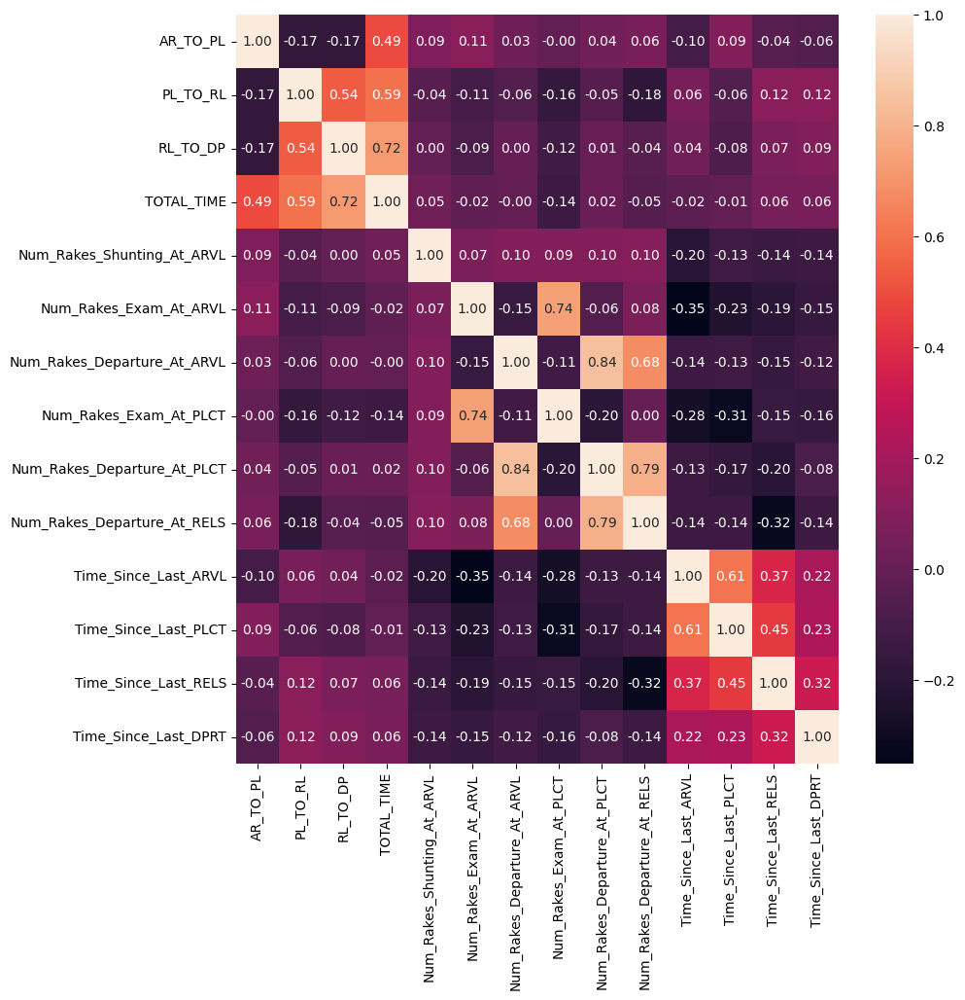

In [123]:
plt.figure(figsize=(10,10))
sns.heatmap(updated_corr, annot=True, fmt=".2f")
plt.show()

In [124]:
updated_corr_df1 = smp_updated1.copy()

In [125]:
updated_corr_df1['R_DATEOFMONTH'] = updated_corr_df1['R_DATEOFMONTH'].dt.day
updated_corr_df1['R_MONTH'] = updated_corr_df1['R_MONTH'].str.split('-').str[1].astype('int64')
updated_corr_df1['R_WEEK'] = updated_corr_df1['R_WEEK'].str.split('-').str[1].astype('int64')

updated_corr1 = updated_corr_df1[['R_DATEOFMONTH','R_MONTH','R_WEEK','R_DAYOFWEEK','ARVL_H','PLCT_H','RELS_H','DPRT_H']].corr()

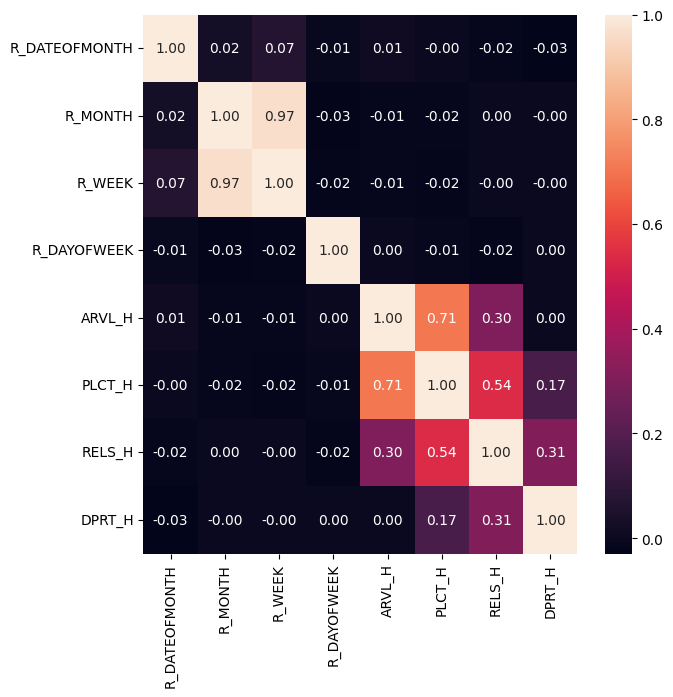

In [126]:
plt.figure(figsize=(7,7))
sns.heatmap(updated_corr1, annot=True, fmt=".2f")
plt.show()

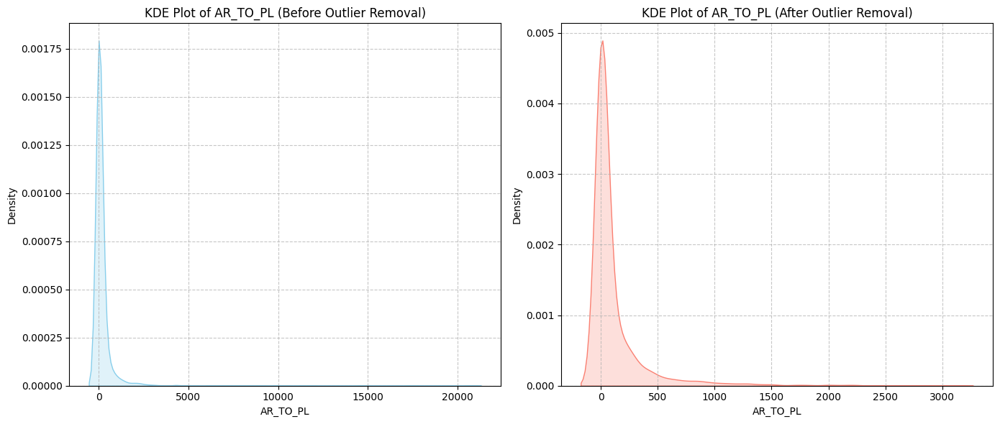

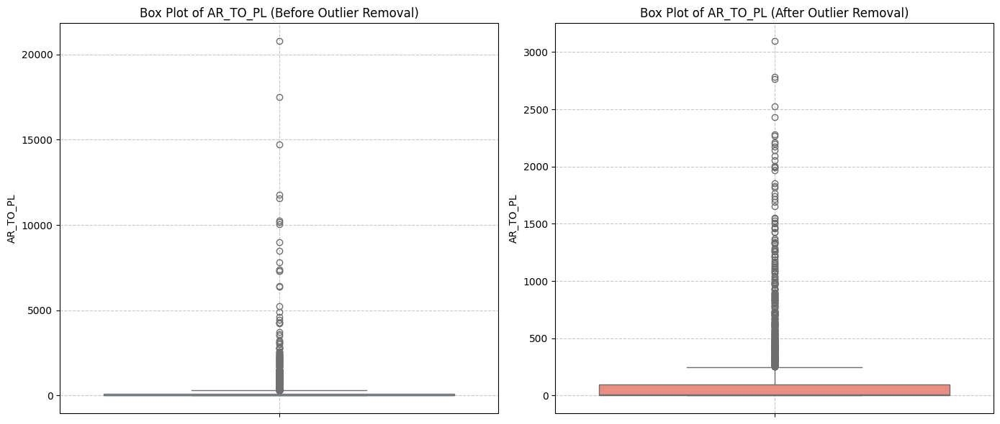

In [127]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(smp['AR_TO_PL'], fill=True, color='skyblue')
plt.title('KDE Plot of AR_TO_PL (Before Outlier Removal)')
plt.xlabel('AR_TO_PL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(smp_updated1['AR_TO_PL'], fill=True, color='salmon')
plt.title('KDE Plot of AR_TO_PL (After Outlier Removal)')
plt.xlabel('AR_TO_PL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(y=smp['AR_TO_PL'], color='skyblue')
plt.title('Box Plot of AR_TO_PL (Before Outlier Removal)')
plt.ylabel('AR_TO_PL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=smp_updated1['AR_TO_PL'], color='salmon')
plt.title('Box Plot of AR_TO_PL (After Outlier Removal)')
plt.ylabel('AR_TO_PL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

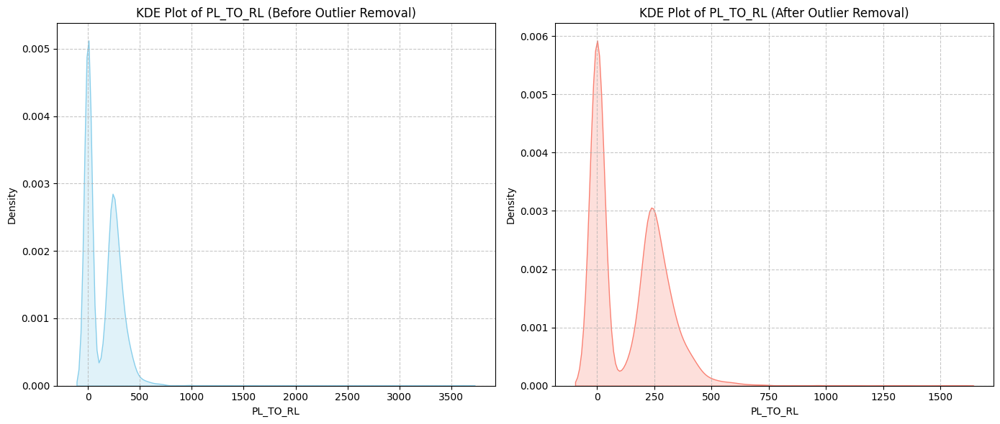

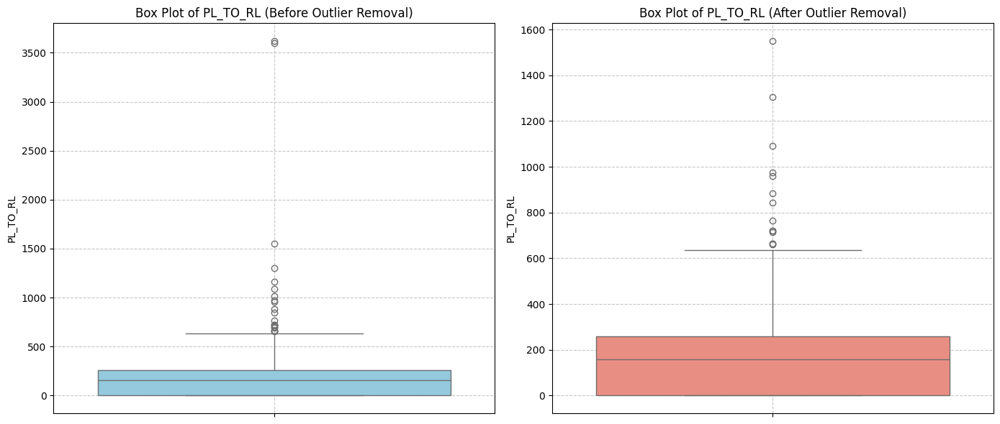

In [128]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(smp['PL_TO_RL'], fill=True, color='skyblue')
plt.title('KDE Plot of PL_TO_RL (Before Outlier Removal)')
plt.xlabel('PL_TO_RL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(smp_updated1['PL_TO_RL'], fill=True, color='salmon')
plt.title('KDE Plot of PL_TO_RL (After Outlier Removal)')
plt.xlabel('PL_TO_RL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(y=smp['PL_TO_RL'], color='skyblue')
plt.title('Box Plot of PL_TO_RL (Before Outlier Removal)')
plt.ylabel('PL_TO_RL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=smp_updated1['PL_TO_RL'], color='salmon')
plt.title('Box Plot of PL_TO_RL (After Outlier Removal)')
plt.ylabel('PL_TO_RL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

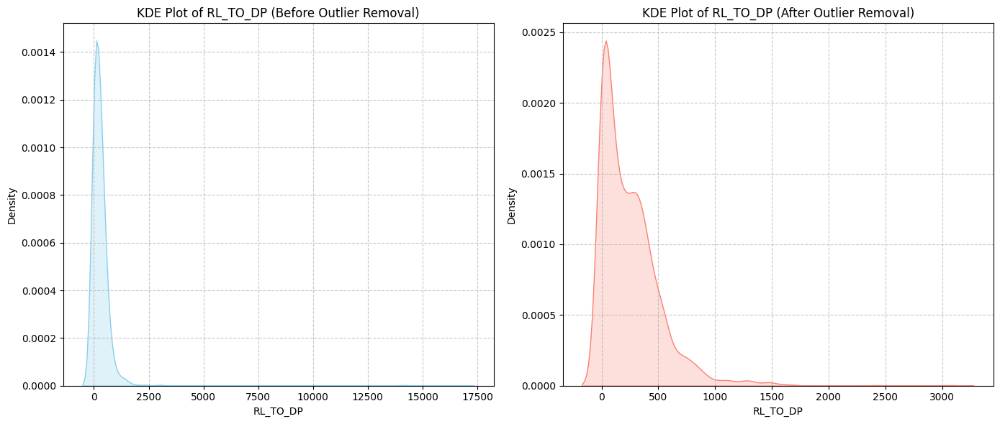

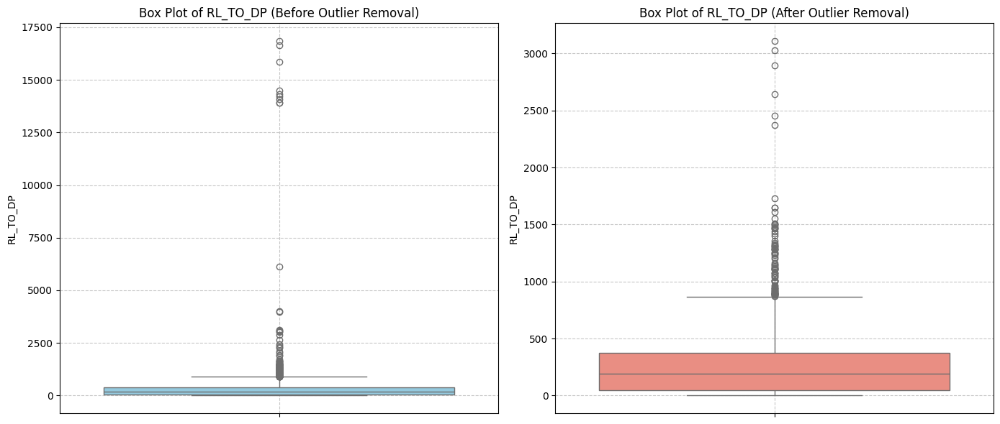

In [129]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(smp['RL_TO_DP'], fill=True, color='skyblue')
plt.title('KDE Plot of RL_TO_DP (Before Outlier Removal)')
plt.xlabel('RL_TO_DP')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(smp_updated1['RL_TO_DP'], fill=True, color='salmon')
plt.title('KDE Plot of RL_TO_DP (After Outlier Removal)')
plt.xlabel('RL_TO_DP')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(y=smp['RL_TO_DP'], color='skyblue')
plt.title('Box Plot of RL_TO_DP (Before Outlier Removal)')
plt.ylabel('RL_TO_DP')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=smp_updated1['RL_TO_DP'], color='salmon')
plt.title('Box Plot of RL_TO_DP (After Outlier Removal)')
plt.ylabel('RL_TO_DP')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

### Implementing Cyclic features

In [130]:
smp_updated2 = smp_updated1.copy()

In [131]:
smp_updated2.head()

,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
0,2024-04-01,BCN,SMP,WR,980,0,165,1145,2024-04-01,2024-04,...,0,0,0,1,2,2,0.0,165.0,155.0,30.0
1,2024-04-01,BOXN,SMP,WR,0,260,169,429,2024-04-01,2024-04,...,1,0,0,0,0,1,160.0,0.0,85.0,4.0
2,2024-04-01,BCN,SMP,WR,0,0,250,250,2024-04-01,2024-04,...,1,1,0,1,0,0,175.0,175.0,0.0,0.0
3,2024-04-01,BOXNHL,SMP,WR,73,385,93,551,2024-04-01,2024-04,...,1,1,1,1,1,0,2.0,75.0,375.0,299.0
4,2024-04-01,BCN,SMP,WR,8,305,425,738,2024-04-01,2024-04,...,1,1,2,1,2,1,155.0,90.0,10.0,51.0


In [132]:
smp_updated2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2970 entries, 0 to 3099
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   RDATE                        2970 non-null   object        
 1   RAKETYPE                     2970 non-null   object        
 2   EXAMSTTN                     2970 non-null   object        
 3   ZONE                         2970 non-null   object        
 4   AR_TO_PL                     2970 non-null   int64         
 5   PL_TO_RL                     2970 non-null   int64         
 6   RL_TO_DP                     2970 non-null   int64         
 7   TOTAL_TIME                   2970 non-null   int64         
 8   R_DATEOFMONTH                2970 non-null   datetime64[ns]
 9   R_MONTH                      2970 non-null   object        
 10  R_DAYOFWEEK                  2970 non-null   int64         
 11  R_WEEK                       2970 non-null   obj

In [133]:
smp_updated2['R_MONTH'] = smp_updated2['R_MONTH'].str.split('-').str[1].astype('int64')
smp_updated2['R_DATEOFMONTH'] = smp_updated2['R_DATEOFMONTH'].dt.day
smp_updated2['R_WEEK'] = smp_updated2['R_WEEK'].str.split('-').str[1].astype('int64')


smp_updated2['R_MONTH_sin'] = np.sin(2 * np.pi * smp_updated2['R_MONTH'] / 12)
smp_updated2['R_MONTH_cos'] = np.cos(2 * np.pi * smp_updated2['R_MONTH'] / 12)

smp_updated2['R_DAYOFWEEK_sin'] = np.sin(2 * np.pi * smp_updated2['R_DAYOFWEEK'] / 7)
smp_updated2['R_DAYOFWEEK_cos'] = np.cos(2 * np.pi * smp_updated2['R_DAYOFWEEK'] / 7)

smp_updated2['R_WEEK_sin'] = np.sin(2 * np.pi * smp_updated2['R_WEEK'] / 52)
smp_updated2['R_WEEK_cos'] = np.cos(2 * np.pi * smp_updated2['R_WEEK'] / 52)

smp_updated2['ARVL_H_sin'] = np.sin(2 * np.pi * smp_updated2['ARVL_H'] / 24)
smp_updated2['ARVL_H_cos'] = np.cos(2 * np.pi * smp_updated2['ARVL_H'] / 24)


smp_updated2.drop(columns=['R_MONTH', 'R_DAYOFWEEK', 'R_WEEK', 'ARVL_H', 'PLCT_H', 'RELS_H', 'DPRT_H'], axis=1, inplace=True)

smp_updated2.head()

,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,Num_Rakes_Shunting_At_ARVL,...,Time_Since_Last_RELS,Time_Since_Last_DPRT,R_MONTH_sin,R_MONTH_cos,R_DAYOFWEEK_sin,R_DAYOFWEEK_cos,R_WEEK_sin,R_WEEK_cos,ARVL_H_sin,ARVL_H_cos
0,2024-04-01,BCN,SMP,WR,980,0,165,1145,1,0,...,155.0,30.0,0.866025,-0.5,0.0,1.0,0.992709,-0.120537,-0.866025,-5.000000e-01
1,2024-04-01,BOXN,SMP,WR,0,260,169,429,1,1,...,85.0,4.0,0.866025,-0.5,0.0,1.0,0.992709,-0.120537,-1.000000,-1.836970e-16
2,2024-04-01,BCN,SMP,WR,0,0,250,250,1,1,...,0.0,0.0,0.866025,-0.5,0.0,1.0,0.992709,-0.120537,-0.707107,7.071068e-01
3,2024-04-01,BOXNHL,SMP,WR,73,385,93,551,1,1,...,375.0,299.0,0.866025,-0.5,0.0,1.0,0.992709,-0.120537,-0.707107,7.071068e-01
4,2024-04-01,BCN,SMP,WR,8,305,425,738,1,1,...,10.0,51.0,0.866025,-0.5,0.0,1.0,0.992709,-0.120537,0.000000,1.000000e+00


### One Hot Encoding

In [134]:
from sklearn.preprocessing import OneHotEncoder

In [135]:
categorical_cols = ['RAKETYPE']

In [136]:
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
encoded_features = encoder.fit_transform(smp_updated2[categorical_cols])

In [137]:
encoded_col_names = encoder.get_feature_names_out(categorical_cols)
encoded_df = pd.DataFrame(encoded_features, columns=encoded_col_names, index=smp_updated2.index)

In [138]:
smp_updated3 = pd.concat([smp_updated2, encoded_df], axis=1)
smp_updated3 = smp_updated3.drop(columns=categorical_cols)

In [139]:
smp_updated3.drop(columns=['RDATE', 'EXAMSTTN','ZONE','TOTAL_TIME'], axis=1, inplace=True)

In [140]:
smp_updated3

,AR_TO_PL,PL_TO_RL,RL_TO_DP,R_DATEOFMONTH,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,...,R_WEEK_cos,ARVL_H_sin,ARVL_H_cos,RAKETYPE_BCN,RAKETYPE_BCNAHSM1,RAKETYPE_BCNHL,RAKETYPE_BOXN,RAKETYPE_BOXNHL,RAKETYPE_BOXNHL25T,RAKETYPE_MBOXN
0,980,0,165,1,0,0,0,1,2,2,...,-0.120537,-0.866025,-5.000000e-01,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0,260,169,1,1,0,0,0,0,1,...,-0.120537,-1.000000,-1.836970e-16,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,0,0,250,1,1,1,0,1,0,0,...,-0.120537,-0.707107,7.071068e-01,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,73,385,93,1,1,1,1,1,1,0,...,-0.120537,-0.707107,7.071068e-01,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,8,305,425,1,1,1,2,1,2,1,...,-0.120537,0.000000,1.000000e+00,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3092,3,635,225,31,2,1,1,1,1,1,...,-0.120537,-1.000000,-1.836970e-16,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3094,0,370,245,31,2,2,0,2,0,0,...,-0.120537,-0.866025,5.000000e-01,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3096,200,280,130,31,0,1,1,2,0,0,...,-0.120537,1.000000,6.123234e-17,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3098,15,230,144,31,2,1,1,1,1,1,...,-0.120537,0.965926,-2.588190e-01,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [141]:
smp_updated3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2970 entries, 0 to 3099
Data columns (total 29 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   AR_TO_PL                     2970 non-null   int64  
 1   PL_TO_RL                     2970 non-null   int64  
 2   RL_TO_DP                     2970 non-null   int64  
 3   R_DATEOFMONTH                2970 non-null   int32  
 4   Num_Rakes_Shunting_At_ARVL   2970 non-null   int64  
 5   Num_Rakes_Exam_At_ARVL       2970 non-null   int64  
 6   Num_Rakes_Departure_At_ARVL  2970 non-null   int64  
 7   Num_Rakes_Exam_At_PLCT       2970 non-null   int64  
 8   Num_Rakes_Departure_At_PLCT  2970 non-null   int64  
 9   Num_Rakes_Departure_At_RELS  2970 non-null   int64  
 10  Time_Since_Last_ARVL         2970 non-null   float64
 11  Time_Since_Last_PLCT         2970 non-null   float64
 12  Time_Since_Last_RELS         2970 non-null   float64
 13  Time_Since_Last_DPRT   

### Each time frame count analysis

In [142]:
shunting_time_count = smp_updated3['AR_TO_PL'].value_counts().reset_index()
shunting_time_count.columns = ['AR_TO_PL','RAKE_COUNT']

shunting_time_count = shunting_time_count.sort_values(by='AR_TO_PL').reset_index(drop=True)
shunting_time_count.head(30)

,AR_TO_PL,RAKE_COUNT
0,0,1035
1,1,45
2,2,19
3,3,36
4,4,33
5,5,238
6,6,33
7,7,31
8,8,20
9,9,21


In [143]:
exam_time_count = smp_updated3['PL_TO_RL'].value_counts().reset_index()
exam_time_count.columns = ['PL_TO_RL','RAKE_COUNT']

exam_time_count = exam_time_count.sort_values(by='PL_TO_RL').reset_index(drop=True)
exam_time_count.head(30)

,PL_TO_RL,RAKE_COUNT
0,0,1386
1,1,2
2,2,1
3,5,6
4,15,1
5,30,1
6,41,1
7,45,1
8,47,1
9,50,2


In [144]:
departure_time_count = smp_updated3['RL_TO_DP'].value_counts().reset_index()
departure_time_count.columns = ['RL_TO_DP','RAKE_COUNT']

departure_time_count = departure_time_count.sort_values(by='RL_TO_DP').reset_index(drop=True)
departure_time_count.head(30)

,RL_TO_DP,RAKE_COUNT
0,0,30
1,1,170
2,2,25
3,3,13
4,4,17
5,5,182
6,6,13
7,7,6
8,8,8
9,9,12


# Model Selections Part - single stage (old)

### Preparing columns

In [145]:
smp_final = smp_updated3.copy()

In [146]:
smp_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2970 entries, 0 to 3099
Data columns (total 29 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   AR_TO_PL                     2970 non-null   int64  
 1   PL_TO_RL                     2970 non-null   int64  
 2   RL_TO_DP                     2970 non-null   int64  
 3   R_DATEOFMONTH                2970 non-null   int32  
 4   Num_Rakes_Shunting_At_ARVL   2970 non-null   int64  
 5   Num_Rakes_Exam_At_ARVL       2970 non-null   int64  
 6   Num_Rakes_Departure_At_ARVL  2970 non-null   int64  
 7   Num_Rakes_Exam_At_PLCT       2970 non-null   int64  
 8   Num_Rakes_Departure_At_PLCT  2970 non-null   int64  
 9   Num_Rakes_Departure_At_RELS  2970 non-null   int64  
 10  Time_Since_Last_ARVL         2970 non-null   float64
 11  Time_Since_Last_PLCT         2970 non-null   float64
 12  Time_Since_Last_RELS         2970 non-null   float64
 13  Time_Since_Last_DPRT   

In [147]:
target_cols = ['AR_TO_PL', 'PL_TO_RL', 'RL_TO_DP']

base_features = [col for col in smp_final.columns if col not in target_cols]

X = smp_final[base_features]
y = smp_final[target_cols]

In [148]:
base_features

['R_DATEOFMONTH',
 'Num_Rakes_Shunting_At_ARVL',
 'Num_Rakes_Exam_At_ARVL',
 'Num_Rakes_Departure_At_ARVL',
 'Num_Rakes_Exam_At_PLCT',
 'Num_Rakes_Departure_At_PLCT',
 'Num_Rakes_Departure_At_RELS',
 'Time_Since_Last_ARVL',
 'Time_Since_Last_PLCT',
 'Time_Since_Last_RELS',
 'Time_Since_Last_DPRT',
 'R_MONTH_sin',
 'R_MONTH_cos',
 'R_DAYOFWEEK_sin',
 'R_DAYOFWEEK_cos',
 'R_WEEK_sin',
 'R_WEEK_cos',
 'ARVL_H_sin',
 'ARVL_H_cos',
 'RAKETYPE_BCN',
 'RAKETYPE_BCNAHSM1',
 'RAKETYPE_BCNHL',
 'RAKETYPE_BOXN',
 'RAKETYPE_BOXNHL',
 'RAKETYPE_BOXNHL25T',
 'RAKETYPE_MBOXN']

In [149]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [150]:
from sklearn.metrics import mean_absolute_error, root_mean_squared_error, r2_score

In [151]:
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    non_zero_indices = y_true != 0

    if not np.any(non_zero_indices):
        return np.nan

    return np.mean(np.abs((y_true[non_zero_indices] - y_pred[non_zero_indices]) / y_true[non_zero_indices])) * 100


In [152]:
models = {}
scalers = {}

## RandomForest Regressor

In [153]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline

In [154]:
rfr_predictions = {}
rfr_metrics = {}

In [155]:
for target in target_cols:
    print(f"RandomForestRegressor model for target: {target}")
    rfr_model = Pipeline(steps=[('regressor', RandomForestRegressor(n_estimators=300, max_depth=15, min_samples_leaf=3, random_state=42, n_jobs=-1))])
    rfr_model.fit(X_train, y_train[target])
    models[f'RFR_{target}'] = rfr_model

    y_pred = rfr_model.predict(X_test)
    rfr_predictions[target] = y_pred

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    rfr_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

RandomForestRegressor model for target: AR_TO_PL
 Mean Absolute Error (MAE): 143.15950333752653
 Mean Absolute Percentage Error (MAPE): 653.7419832335065
 Root Mean Squared Error (RMSE): 308.35477684909654
 R-squared (R2): 0.07074851047947894
RandomForestRegressor model for target: PL_TO_RL
 Mean Absolute Error (MAE): 90.62607331183852
 Mean Absolute Percentage Error (MAPE): 45.68855274605976
 Root Mean Squared Error (RMSE): 114.36399254009397
 R-squared (R2): 0.41486543858874003
RandomForestRegressor model for target: RL_TO_DP
 Mean Absolute Error (MAE): 181.10751971503106
 Mean Absolute Percentage Error (MAPE): 1777.979304217533
 Root Mean Squared Error (RMSE): 278.4831440204445
 R-squared (R2): 0.13344482071792596


In [156]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))])}

In [157]:
rfr_predictions

{'AR_TO_PL': array([  67.0097721 ,   83.2328978 ,  271.90709327,   86.48090845,
         392.29792341,  174.04485877,  260.69893255,   34.35331764,
         212.58927573,   38.37773348,   15.46762599,  404.16161127,
          32.83853968,  105.96051253,   14.15334172,   38.24235013,
          80.16406882,   91.39359519,   60.23063057,   49.85148899,
         274.9151725 ,   39.09476133,    7.27856127,   32.0475715 ,
         167.74548086,   53.25284749,   41.86130994,   21.1929385 ,
          60.70910056,   51.77701421,  211.9465739 ,   14.22764235,
         116.86535705, 1321.53094505,   65.18245988,   47.93128867,
         555.88615885,  342.61590287,   59.90762349,  112.13922877,
         377.42570973,   35.29517192,  202.05644645,   15.54239806,
          20.81269411,  127.89894918,  212.10027421,   23.62824344,
          23.88536547,   59.3305028 ,   21.38755691,  190.19551814,
          80.17022581,   23.57228216,  190.31991682,  179.16809204,
         117.23921592,   69.37873123

In [158]:
rfr_metrics

{'AR_TO_PL': {'MAE': 143.15950333752653,
  'MAPE': np.float64(653.7419832335065),
  'RMSE': 308.35477684909654,
  'R2': 0.07074851047947894},
 'PL_TO_RL': {'MAE': 90.62607331183852,
  'MAPE': np.float64(45.68855274605976),
  'RMSE': 114.36399254009397,
  'R2': 0.41486543858874003},
 'RL_TO_DP': {'MAE': 181.10751971503106,
  'MAPE': np.float64(1777.979304217533),
  'RMSE': 278.4831440204445,
  'R2': 0.13344482071792596}}

## SupportVector Regressor

In [159]:
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler

In [160]:
svr_metrics = {}

Training SVR for target: AR_TO_PL
Evaluation for AR_TO_PL (SVR):
 Mean Absolute Error (MAE): 117.86667894397752
 Mean Absolute Percentage Error (MAPE): 653.9990331751121
 Root Mean Squared Error (RMSE): 306.8772177836609
 R-squared (R2): 0.0796326560891557


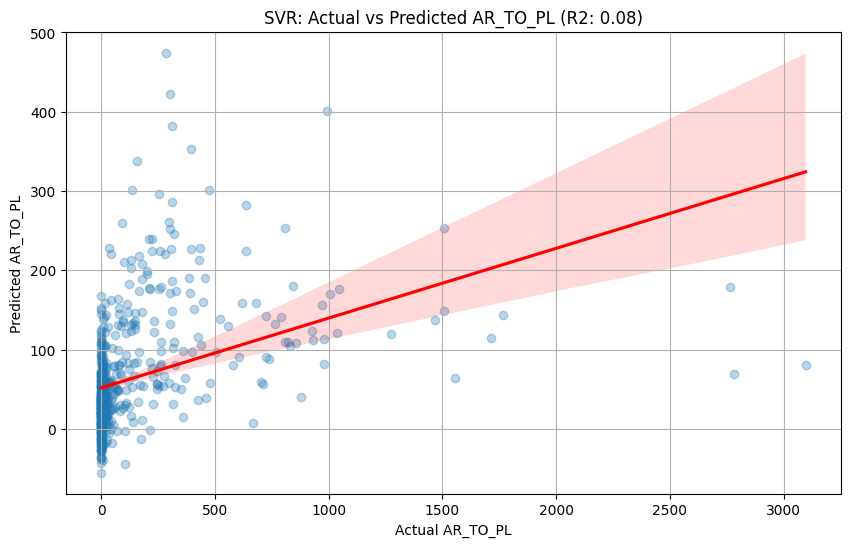

Training SVR for target: PL_TO_RL
Evaluation for PL_TO_RL (SVR):
 Mean Absolute Error (MAE): 103.02911394642639
 Mean Absolute Percentage Error (MAPE): 65.84529373464528
 Root Mean Squared Error (RMSE): 131.3348886595769
 R-squared (R2): 0.22831980514891292


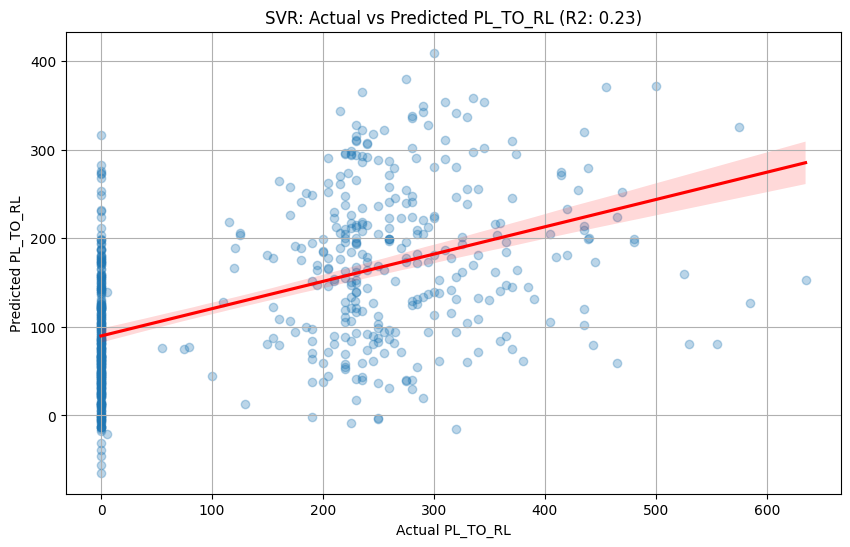

Training SVR for target: RL_TO_DP
Evaluation for RL_TO_DP (SVR):
 Mean Absolute Error (MAE): 175.91609113673695
 Mean Absolute Percentage Error (MAPE): 1974.9057094531952
 Root Mean Squared Error (RMSE): 286.3195737007102
 R-squared (R2): 0.0839894554147772


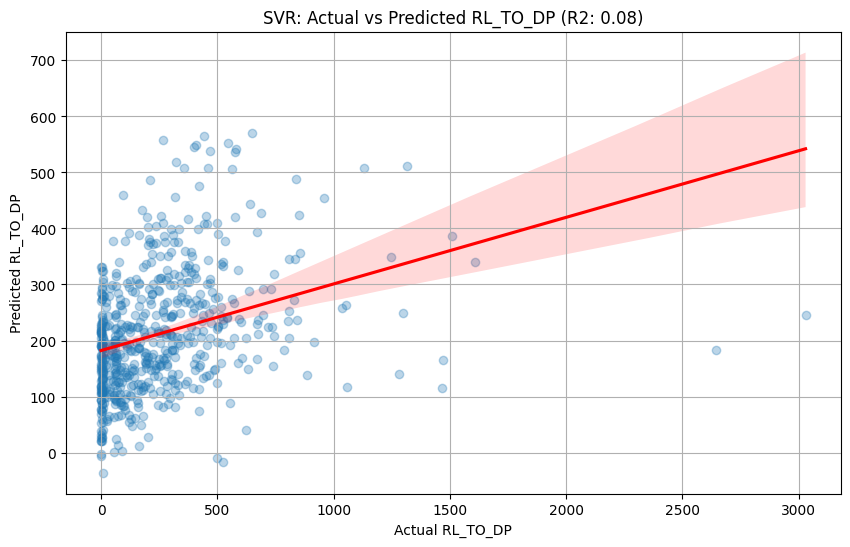

In [161]:
for target in target_cols:
    print(f"Training SVR for target: {target}")

    scaler_X = StandardScaler()
    scaler_y = StandardScaler()

    X_train_scaled = scaler_X.fit_transform(X_train)
    y_train_scaled = scaler_y.fit_transform(y_train[[target]])

    X_test_scaled = scaler_X.transform(X_test)

    svr_model = SVR(kernel='rbf', C=1.0, epsilon=0.1, gamma='scale')

    svr_model.fit(X_train_scaled, y_train_scaled.ravel())

    models[f'SVR_{target}'] = svr_model
    scalers[f'SVR_X_scaler_{target}'] = scaler_X
    scalers[f'SVR_y_scaler_{target}'] = scaler_y

    y_pred_scaled = svr_model.predict(X_test_scaled)

    y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    svr_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f"Evaluation for {target} (SVR):")
    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

    plt.figure(figsize=(10, 6))
    sns.regplot(x=y_test[target], y=y_pred.flatten(), scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
    plt.xlabel(f'Actual {target}')
    plt.ylabel(f'Predicted {target}')
    plt.title(f'SVR: Actual vs Predicted {target} (R2: {r2:.2f})')
    plt.grid(True)
    plt.show()


In [162]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'SVR_AR_TO_PL': SVR(),
 'SVR_PL_TO_RL': SVR(),
 'SVR_RL_TO_DP': SVR()}

In [163]:
scalers

{'SVR_X_scaler_AR_TO_PL': StandardScaler(),
 'SVR_y_scaler_AR_TO_PL': StandardScaler(),
 'SVR_X_scaler_PL_TO_RL': StandardScaler(),
 'SVR_y_scaler_PL_TO_RL': StandardScaler(),
 'SVR_X_scaler_RL_TO_DP': StandardScaler(),
 'SVR_y_scaler_RL_TO_DP': StandardScaler()}

In [164]:
svr_metrics

{'AR_TO_PL': {'MAE': 117.86667894397752,
  'MAPE': np.float64(653.9990331751121),
  'RMSE': 306.8772177836609,
  'R2': 0.0796326560891557},
 'PL_TO_RL': {'MAE': 103.02911394642639,
  'MAPE': np.float64(65.84529373464528),
  'RMSE': 131.3348886595769,
  'R2': 0.22831980514891292},
 'RL_TO_DP': {'MAE': 175.91609113673695,
  'MAPE': np.float64(1974.9057094531952),
  'RMSE': 286.3195737007102,
  'R2': 0.0839894554147772}}

## KNN

In [165]:
from sklearn.neighbors import KNeighborsRegressor

In [166]:
knn_metrics = {}

Training KNN for target: AR_TO_PL
Evaluation for AR_TO_PL (KNN):
 Mean Absolute Error (MAE): 141.73857448967013
 Mean Absolute Percentage Error (MAPE): 911.570213629179
 Root Mean Squared Error (RMSE): 303.9264937532319
 R-squared (R2): 0.09724682535906592


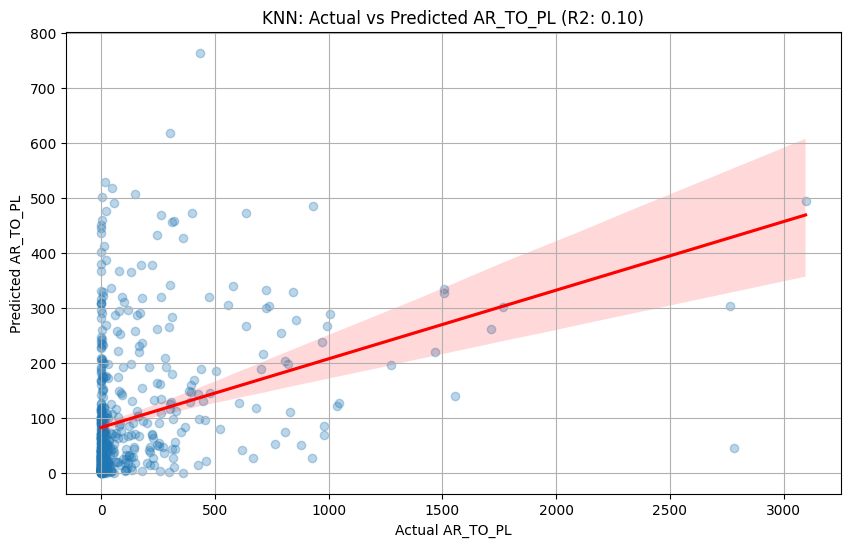

Training KNN for target: PL_TO_RL
Evaluation for PL_TO_RL (KNN):
 Mean Absolute Error (MAE): 119.91942630581694
 Mean Absolute Percentage Error (MAPE): 65.43765148489612
 Root Mean Squared Error (RMSE): 148.8355804872669
 R-squared (R2): 0.008961183564768826


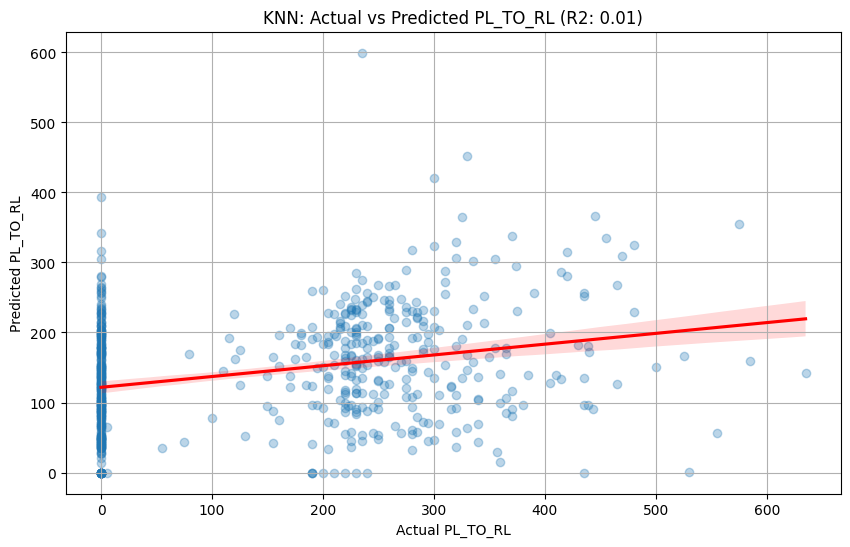

Training KNN for target: RL_TO_DP
Evaluation for RL_TO_DP (KNN):
 Mean Absolute Error (MAE): 201.2801220963547
 Mean Absolute Percentage Error (MAPE): 2359.8702018754966
 Root Mean Squared Error (RMSE): 300.76572849906387
 R-squared (R2): -0.010776395736087352


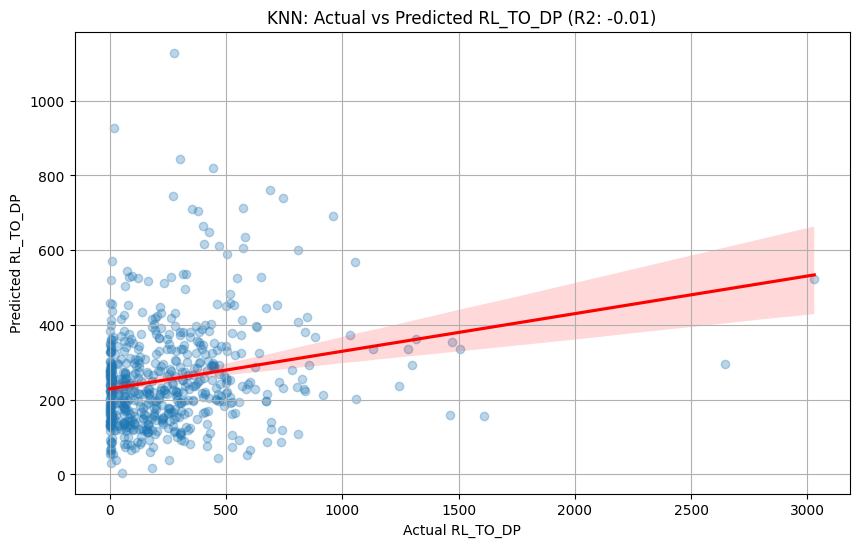

In [167]:
for target in target_cols:
    print(f"Training KNN for target: {target}")

    scaler_X = StandardScaler()
    scaler_y = StandardScaler()

    X_train_scaled = scaler_X.fit_transform(X_train)
    y_train_scaled = scaler_y.fit_transform(y_train[[target]])

    X_test_scaled = scaler_X.transform(X_test)

    knn_model = KNeighborsRegressor(n_neighbors=5, weights='distance', metric='euclidean')

    knn_model.fit(X_train_scaled, y_train_scaled.ravel())

    models[f'KNN_{target}'] = knn_model
    scalers[f'KNN_X_scaler_{target}'] = scaler_X
    scalers[f'KNN_y_scaler_{target}'] = scaler_y

    y_pred_scaled = knn_model.predict(X_test_scaled)

    y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    knn_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f"Evaluation for {target} (KNN):")
    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

    plt.figure(figsize=(10, 6))
    sns.regplot(x=y_test[target], y=y_pred.flatten(), scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
    plt.xlabel(f'Actual {target}')
    plt.ylabel(f'Predicted {target}')
    plt.title(f'KNN: Actual vs Predicted {target} (R2: {r2:.2f})')
    plt.grid(True)
    plt.show()
    

In [168]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'SVR_AR_TO_PL': SVR(),
 'SVR_PL_TO_RL': SVR(),
 'SVR_RL_TO_DP': SVR(),
 'KNN_AR_TO_PL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_PL_TO_RL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_RL_TO_DP': KN

In [169]:
scalers

{'SVR_X_scaler_AR_TO_PL': StandardScaler(),
 'SVR_y_scaler_AR_TO_PL': StandardScaler(),
 'SVR_X_scaler_PL_TO_RL': StandardScaler(),
 'SVR_y_scaler_PL_TO_RL': StandardScaler(),
 'SVR_X_scaler_RL_TO_DP': StandardScaler(),
 'SVR_y_scaler_RL_TO_DP': StandardScaler(),
 'KNN_X_scaler_AR_TO_PL': StandardScaler(),
 'KNN_y_scaler_AR_TO_PL': StandardScaler(),
 'KNN_X_scaler_PL_TO_RL': StandardScaler(),
 'KNN_y_scaler_PL_TO_RL': StandardScaler(),
 'KNN_X_scaler_RL_TO_DP': StandardScaler(),
 'KNN_y_scaler_RL_TO_DP': StandardScaler()}

In [170]:
knn_metrics

{'AR_TO_PL': {'MAE': 141.73857448967013,
  'MAPE': np.float64(911.570213629179),
  'RMSE': 303.9264937532319,
  'R2': 0.09724682535906592},
 'PL_TO_RL': {'MAE': 119.91942630581694,
  'MAPE': np.float64(65.43765148489612),
  'RMSE': 148.8355804872669,
  'R2': 0.008961183564768826},
 'RL_TO_DP': {'MAE': 201.2801220963547,
  'MAPE': np.float64(2359.8702018754966),
  'RMSE': 300.76572849906387,
  'R2': -0.010776395736087352}}

## XGBoost Regressor

In [171]:
from xgboost import XGBRegressor

In [172]:
xgb_metrics = {}

Training XGBoost for target: AR_TO_PL
Evaluation for AR_TO_PL (XGBoost):
 Mean Absolute Error (MAE): 141.90542602539062
 Mean Absolute Percentage Error (MAPE): 642.415279818625
 Root Mean Squared Error (RMSE): 300.82513427734375
 R-squared (R2): 0.11557674407958984


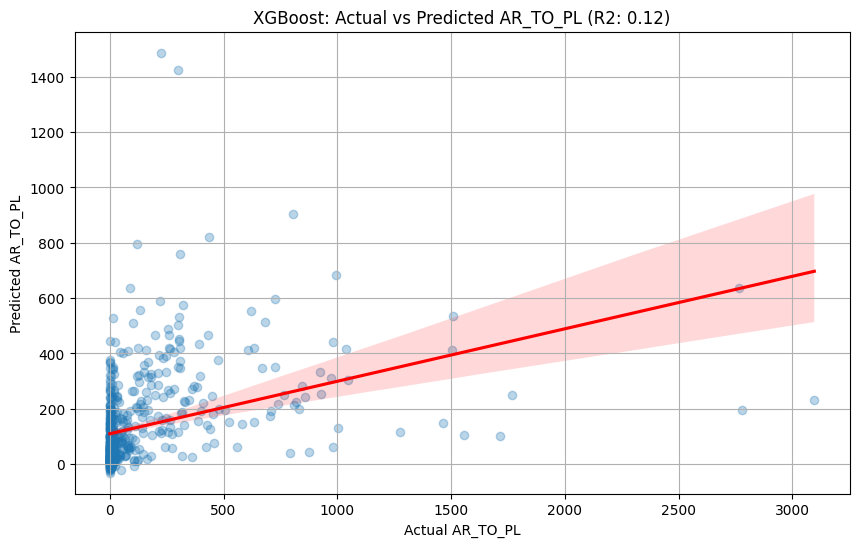

Training XGBoost for target: PL_TO_RL
Evaluation for PL_TO_RL (XGBoost):
 Mean Absolute Error (MAE): 88.41046142578125
 Mean Absolute Percentage Error (MAPE): 43.338124218059555
 Root Mean Squared Error (RMSE): 113.55074310302734
 R-squared (R2): 0.4231576919555664


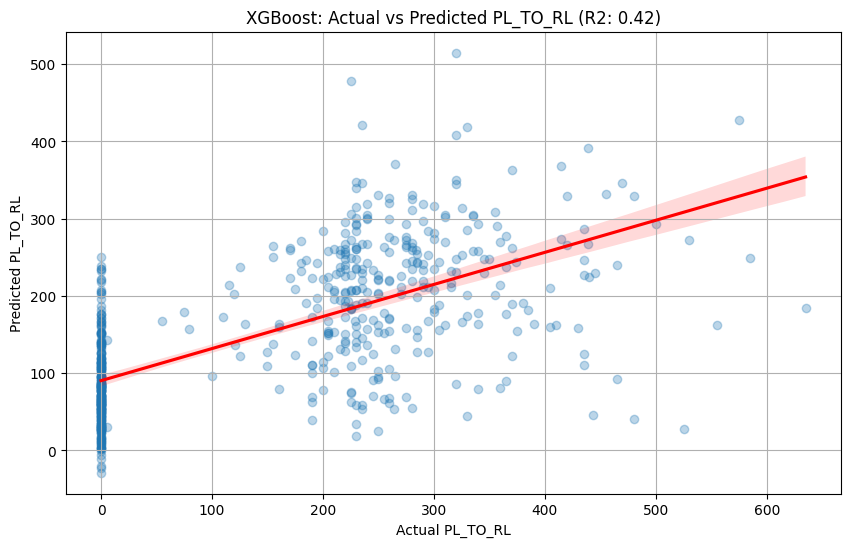

Training XGBoost for target: RL_TO_DP
Evaluation for RL_TO_DP (XGBoost):
 Mean Absolute Error (MAE): 180.7050323486328
 Mean Absolute Percentage Error (MAPE): 1684.8269162871702
 Root Mean Squared Error (RMSE): 280.9739685058594
 R-squared (R2): 0.11787408590316772


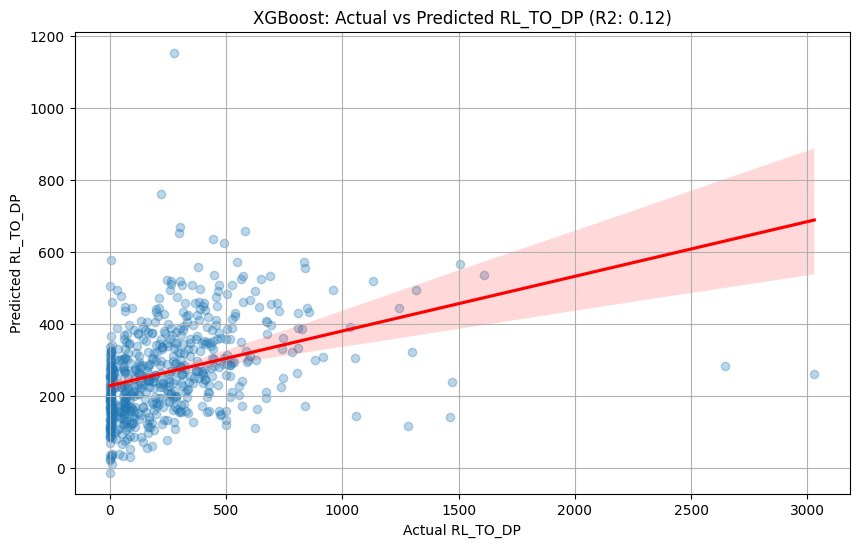

In [173]:
for target in target_cols:
    print(f"Training XGBoost for target: {target}")

    xgb_model = XGBRegressor(objective='reg:squarederror', n_estimators=250, max_depth=8, learning_rate=0.05, subsample=0.8, colsample_bytree=0.8, random_state=42, n_jobs=-1)

    xgb_model.fit(X_train, y_train[target])
    models[f'XGBoost_{target}'] = xgb_model

    y_pred = xgb_model.predict(X_test)

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    xgb_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f"Evaluation for {target} (XGBoost):")
    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

    plt.figure(figsize=(10, 6))
    sns.regplot(x=y_test[target], y=y_pred, scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
    plt.xlabel(f'Actual {target}')
    plt.ylabel(f'Predicted {target}')
    plt.title(f'XGBoost: Actual vs Predicted {target} (R2: {r2:.2f})')
    plt.grid(True)
    plt.show()


In [174]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'SVR_AR_TO_PL': SVR(),
 'SVR_PL_TO_RL': SVR(),
 'SVR_RL_TO_DP': SVR(),
 'KNN_AR_TO_PL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_PL_TO_RL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_RL_TO_DP': KN

In [175]:
xgb_metrics

{'AR_TO_PL': {'MAE': 141.90542602539062,
  'MAPE': np.float64(642.415279818625),
  'RMSE': 300.82513427734375,
  'R2': 0.11557674407958984},
 'PL_TO_RL': {'MAE': 88.41046142578125,
  'MAPE': np.float64(43.338124218059555),
  'RMSE': 113.55074310302734,
  'R2': 0.4231576919555664},
 'RL_TO_DP': {'MAE': 180.7050323486328,
  'MAPE': np.float64(1684.8269162871702),
  'RMSE': 280.9739685058594,
  'R2': 0.11787408590316772}}

## LightGBM Regressor

In [181]:
from lightgbm import LGBMRegressor

In [182]:
lgbm_metrics = {}

Training LightGBM for target: AR_TO_PL
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1198
[LightGBM] [Info] Number of data points in the train set: 2376, number of used features: 24
[LightGBM] [Info] Start training from score 115.998316
Evaluation for AR_TO_PL (LightGBM):
 Mean Absolute Error (MAE): 147.98365282142896
 Mean Absolute Percentage Error (MAPE): 618.663867045604
 Root Mean Squared Error (RMSE): 312.3286925243294
 R-squared (R2): 0.04664275588619604


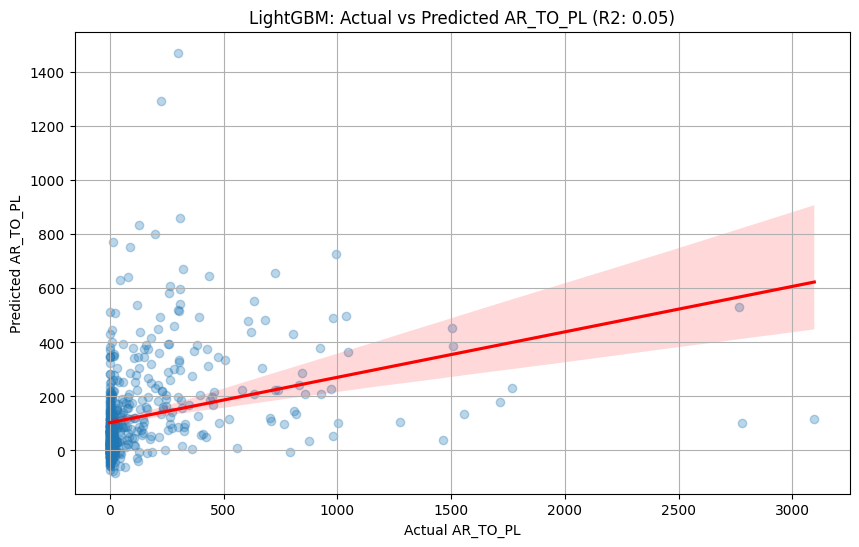

Training LightGBM for target: PL_TO_RL
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1198
[LightGBM] [Info] Number of data points in the train set: 2376, number of used features: 24
[LightGBM] [Info] Start training from score 145.834175
Evaluation for PL_TO_RL (LightGBM):
 Mean Absolute Error (MAE): 87.60721507035852
 Mean Absolute Percentage Error (MAPE): 47.97380378816003
 Root Mean Squared Error (RMSE): 113.59563676134579
 R-squared (R2): 0.42270149290600023


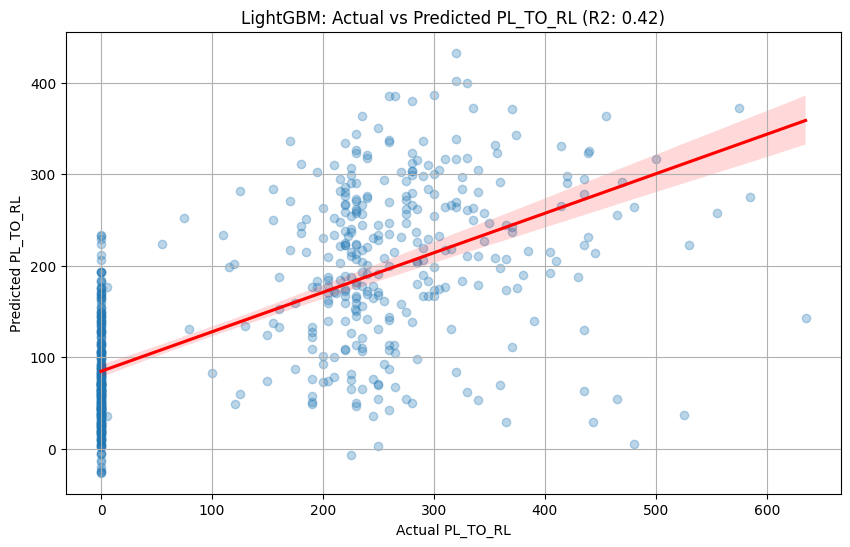

Training LightGBM for target: RL_TO_DP
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1198
[LightGBM] [Info] Number of data points in the train set: 2376, number of used features: 24
[LightGBM] [Info] Start training from score 254.284512
Evaluation for RL_TO_DP (LightGBM):
 Mean Absolute Error (MAE): 180.29333370171761
 Mean Absolute Percentage Error (MAPE): 1585.0698740243831
 Root Mean Squared Error (RMSE): 277.36899208843664
 R-squared (R2): 0.14036475694660155


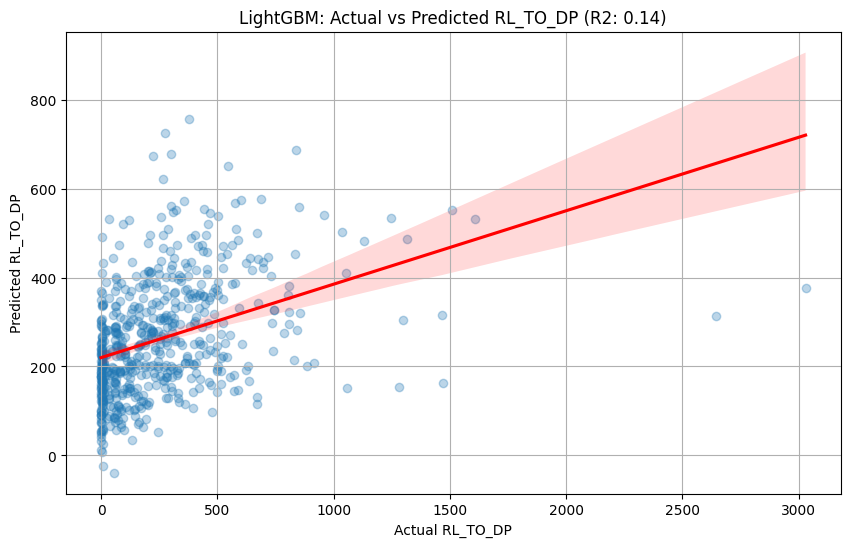

In [183]:
for target in target_cols:
    print(f"Training LightGBM for target: {target}")

    lgbm_model = LGBMRegressor(objective='regression', n_estimators=100, learning_rate=0.1, random_state=42, n_jobs=-1)

    lgbm_model.fit(X_train, y_train[target])
    models[f'LightGBM_{target}'] = lgbm_model

    y_pred = lgbm_model.predict(X_test)

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    lgbm_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f"Evaluation for {target} (LightGBM):")
    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

    plt.figure(figsize=(10, 6))
    sns.regplot(x=y_test[target], y=y_pred, scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
    plt.xlabel(f'Actual {target}')
    plt.ylabel(f'Predicted {target}')
    plt.title(f'LightGBM: Actual vs Predicted {target} (R2: {r2:.2f})')
    plt.grid(True)
    plt.show()
    

In [184]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'SVR_AR_TO_PL': SVR(),
 'SVR_PL_TO_RL': SVR(),
 'SVR_RL_TO_DP': SVR(),
 'KNN_AR_TO_PL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_PL_TO_RL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_RL_TO_DP': KN

In [185]:
lgbm_metrics

{'AR_TO_PL': {'MAE': 147.98365282142896,
  'MAPE': np.float64(618.663867045604),
  'RMSE': 312.3286925243294,
  'R2': 0.04664275588619604},
 'PL_TO_RL': {'MAE': 87.60721507035852,
  'MAPE': np.float64(47.97380378816003),
  'RMSE': 113.59563676134579,
  'R2': 0.42270149290600023},
 'RL_TO_DP': {'MAE': 180.29333370171761,
  'MAPE': np.float64(1585.0698740243831),
  'RMSE': 277.36899208843664,
  'R2': 0.14036475694660155}}

## Overall Performance metrics

In [187]:
metrics = {}
metrics['rfr'] = rfr_metrics
metrics['svr'] = svr_metrics
metrics['knn'] = knn_metrics
metrics['xgb'] = xgb_metrics
metrics['lgbm'] = lgbm_metrics
metrics

{'rfr': {'AR_TO_PL': {'MAE': 143.15950333752653,
   'MAPE': np.float64(653.7419832335065),
   'RMSE': 308.35477684909654,
   'R2': 0.07074851047947894},
  'PL_TO_RL': {'MAE': 90.62607331183852,
   'MAPE': np.float64(45.68855274605976),
   'RMSE': 114.36399254009397,
   'R2': 0.41486543858874003},
  'RL_TO_DP': {'MAE': 181.10751971503106,
   'MAPE': np.float64(1777.979304217533),
   'RMSE': 278.4831440204445,
   'R2': 0.13344482071792596}},
 'svr': {'AR_TO_PL': {'MAE': 117.86667894397752,
   'MAPE': np.float64(653.9990331751121),
   'RMSE': 306.8772177836609,
   'R2': 0.0796326560891557},
  'PL_TO_RL': {'MAE': 103.02911394642639,
   'MAPE': np.float64(65.84529373464528),
   'RMSE': 131.3348886595769,
   'R2': 0.22831980514891292},
  'RL_TO_DP': {'MAE': 175.91609113673695,
   'MAPE': np.float64(1974.9057094531952),
   'RMSE': 286.3195737007102,
   'R2': 0.0839894554147772}},
 'knn': {'AR_TO_PL': {'MAE': 141.73857448967013,
   'MAPE': np.float64(911.570213629179),
   'RMSE': 303.926493753

## Feature Importance

In [188]:
import shap

c:\Coding_files\ML_Bootcamp\venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


##### Key SHAP Plots and Their Interpretation:

SHAP Summary Plot (Beeswarm Plot):

Purpose: Provides a global overview of feature importance and the direction of their impact across many predictions.

Interpretation:
Features are ordered by overall importance (top is most important).
Points to the right (positive SHAP value) push the prediction higher.
Points to the left (negative SHAP value) push the prediction lower.
Color (red for high feature value, blue for low) shows if high/low values of a feature contribute to higher/lower predictions.


SHAP Force Plot (Individual Prediction Explanation):

Purpose: Explains one specific prediction in detail.

Interpretation:
Starts from the base_value (average prediction).
Red features push the prediction higher.
Blue features push the prediction lower.
The length of the bar indicates the magnitude of the impact.
The final predicted value is shown at the end.


SHAP Dependence Plot:

Purpose: Visualizes the relationship between a single feature's value and its impact (SHAP value) on the model's prediction. Can also show interaction effects.

Interpretation:
See if the relationship is linear, curved, or has thresholds.
Points are colored by another interacting feature (if specified, or SHAP finds the best one). This helps you understand if the effect of the primary feature changes depending on the value of the interacting feature.

In [189]:
target_to_explain = ['XGBoost_AR_TO_PL','XGBoost_PL_TO_RL','XGBoost_RL_TO_DP']


Explaining predictions for XGBoost_AR_TO_PL for 200 samples from X_test.
Displaying SHAP Summary Plot for XGBoost_AR_TO_PL:


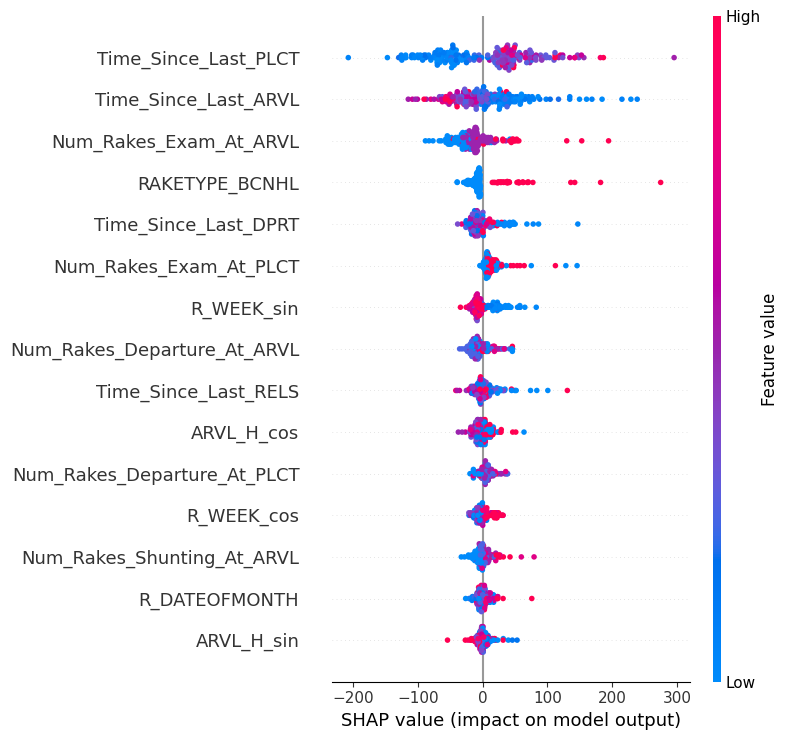

Displaying SHAP Force Plot for instance 0 for XGBoost_AR_TO_PL:


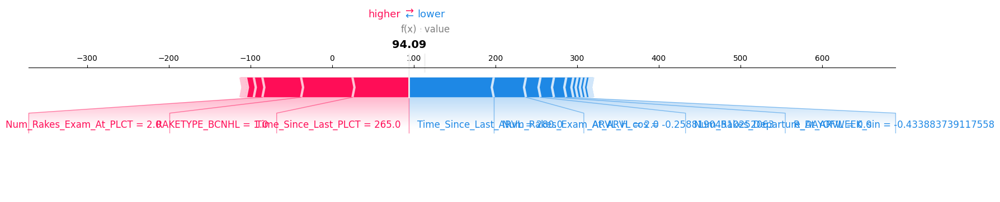


Actual prediction for instance 0: 94.09
Base (Expected) value for XGBoost_AR_TO_PL: 113.23
Interpretation: Red features push the prediction higher, blue features push it lower.

Displaying SHAP Dependence Plot for 'ARVL_H_sin' vs XGBoost_AR_TO_PL:


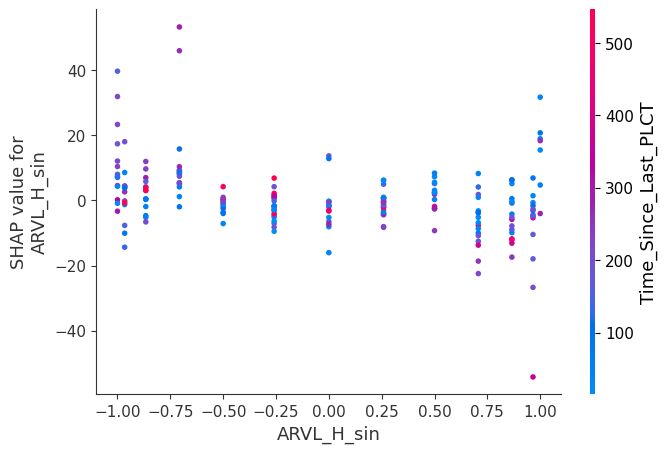

In [190]:
model_to_explain = models[target_to_explain[0]]

explainer1 = shap.TreeExplainer(model_to_explain)

num_samples_to_explain = min(200, X_test.shape[0])
shap_values = explainer1.shap_values(X_test.iloc[:num_samples_to_explain])

print(f"Explaining predictions for {target_to_explain[0]} for {num_samples_to_explain} samples from X_test.")

#Global SHAP Summary Plot (Beeswarm Plot)
print(f"Displaying SHAP Summary Plot for {target_to_explain[0]}:")
shap.summary_plot(shap_values, X_test.iloc[:num_samples_to_explain], plot_type="dot", max_display=15)
#plt.title(f'SHAP Summary for {target_to_explain[0]} (without TOTAL_TIME)')
plt.show()

# Local SHAP Force Plot (for a single prediction)
# Pick a specific instance to explain (e.g., the first one from your test set)
instance_index = 0
if num_samples_to_explain > instance_index:
    print(f"Displaying SHAP Force Plot for instance {instance_index} for {target_to_explain[0]}:")
    base_value = explainer1.expected_value
    shap.force_plot(base_value, shap_values[instance_index], X_test.iloc[instance_index], matplotlib=True)
    #plt.title(f'SHAP Force Plot for Instance {instance_index} ({target_to_explain[0]})')
    plt.show()

    actual_prediction = model_to_explain.predict(X_test.iloc[[instance_index]])[0]
    print(f"\nActual prediction for instance {instance_index}: {actual_prediction:.2f}")
    print(f"Base (Expected) value for {target_to_explain[0]}: {base_value:.2f}")
    print("Interpretation: Red features push the prediction higher, blue features push it lower.")
else:
    print(f"\nNot enough samples ({num_samples_to_explain}) to show force plot for instance {instance_index}. Need at least {instance_index + 1} samples.")

# SHAP Dependence Plot (Feature relationship)
# Example: How 'PLCT_H_sin' (placement hour) affects 'PL_TO_RL' duration.
# You can change 'feature_to_plot' to any other feature you're interested in.
feature_to_plot = 'ARVL_H_sin' # Try other features

if feature_to_plot in X_test.columns and num_samples_to_explain > 0:
    print(f"\nDisplaying SHAP Dependence Plot for '{feature_to_plot}' vs {target_to_explain[0]}:")
    shap.dependence_plot(feature_to_plot, shap_values, X_test.iloc[:num_samples_to_explain])
    #plt.title(f'SHAP Dependence Plot: {feature_to_plot} vs {target_to_explain[0]} (without TOTAL_TIME)')
    plt.show()
else:
    print(f"\nCannot create Dependence Plot: '{feature_to_plot}' not found in features or no samples to explain.")

Explaining predictions for XGBoost_PL_TO_RL for 200 samples from X_test.
Displaying SHAP Summary Plot for XGBoost_PL_TO_RL:


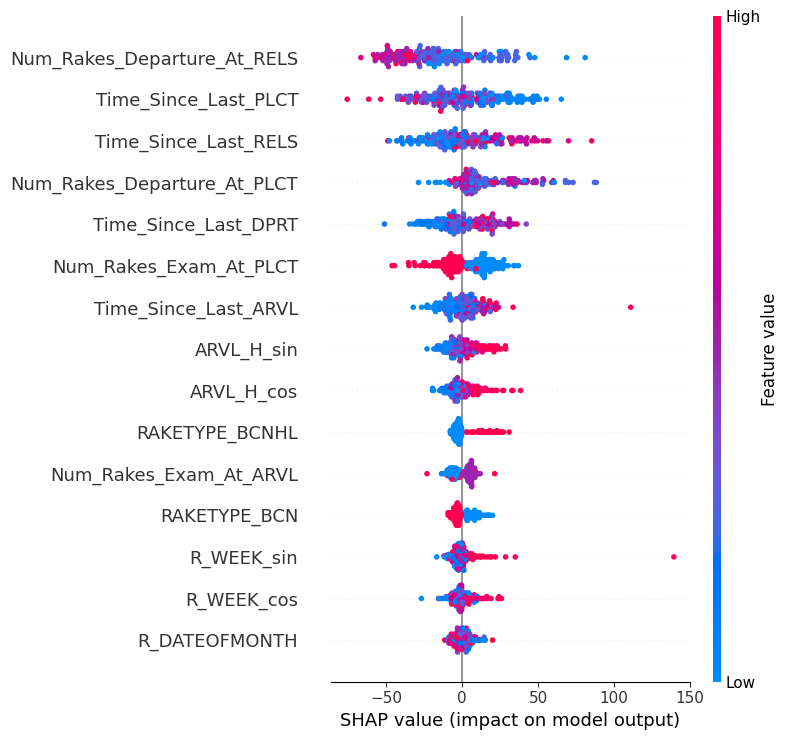

Displaying SHAP Force Plot for instance 0 for XGBoost_PL_TO_RL:


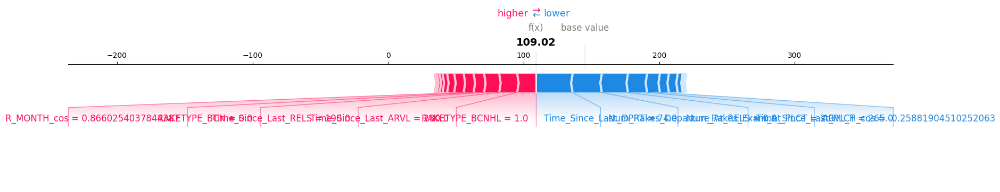


Actual prediction for instance 0: 109.02
Base (Expected) value for XGBoost_PL_TO_RL: 145.21
Interpretation: Red features push the prediction higher, blue features push it lower.

Displaying SHAP Dependence Plot for 'R_DATEOFMONTH' vs XGBoost_PL_TO_RL:


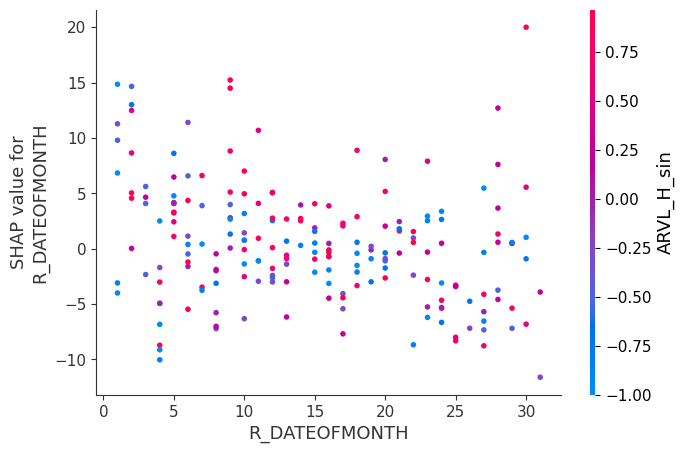

In [191]:
model_to_explain = models[target_to_explain[1]]

explainer1 = shap.TreeExplainer(model_to_explain)

num_samples_to_explain = min(200, X_test.shape[0])
shap_values = explainer1.shap_values(X_test.iloc[:num_samples_to_explain])

print(f"Explaining predictions for {target_to_explain[1]} for {num_samples_to_explain} samples from X_test.")

#Global SHAP Summary Plot (Beeswarm Plot)
print(f"Displaying SHAP Summary Plot for {target_to_explain[1]}:")
shap.summary_plot(shap_values, X_test.iloc[:num_samples_to_explain], plot_type="dot", max_display=15)
#plt.title(f'SHAP Summary for {target_to_explain[1]}')
plt.show()

# Local SHAP Force Plot (for a single prediction)
# Pick a specific instance to explain (e.g., the first one from your test set)
instance_index = 0
if num_samples_to_explain > instance_index:
    print(f"Displaying SHAP Force Plot for instance {instance_index} for {target_to_explain[1]}:")
    base_value = explainer1.expected_value
    shap.force_plot(base_value, shap_values[instance_index], X_test.iloc[instance_index], matplotlib=True)
    #plt.title(f'SHAP Force Plot for Instance {instance_index} ({target_to_explain[1]})')
    plt.show()

    actual_prediction = model_to_explain.predict(X_test.iloc[[instance_index]])[0]
    print(f"\nActual prediction for instance {instance_index}: {actual_prediction:.2f}")
    print(f"Base (Expected) value for {target_to_explain[1]}: {base_value:.2f}")
    print("Interpretation: Red features push the prediction higher, blue features push it lower.")
else:
    print(f"\nNot enough samples ({num_samples_to_explain}) to show force plot for instance {instance_index}. Need at least {instance_index + 1} samples.")

# SHAP Dependence Plot (Feature relationship)
# Example: How 'ARVL_H_sin' (placement hour) affects 'AR_TO_PL' duration.
# You can change 'feature_to_plot' to any other feature you're interested in.
feature_to_plot = 'R_DATEOFMONTH' # Try other features

if feature_to_plot in X_test.columns and num_samples_to_explain > 0:
    print(f"\nDisplaying SHAP Dependence Plot for '{feature_to_plot}' vs {target_to_explain[1]}:")
    shap.dependence_plot(feature_to_plot, shap_values, X_test.iloc[:num_samples_to_explain])
    #plt.title(f'SHAP Dependence Plot: {feature_to_plot} vs {target_to_explain[1]} (without TOTAL_TIME)')
    plt.show()
else:
    print(f"\nCannot create Dependence Plot: '{feature_to_plot}' not found in features or no samples to explain.")

Explaining predictions for XGBoost_RL_TO_DP for 200 samples from X_test.
Displaying SHAP Summary Plot for XGBoost_RL_TO_DP:


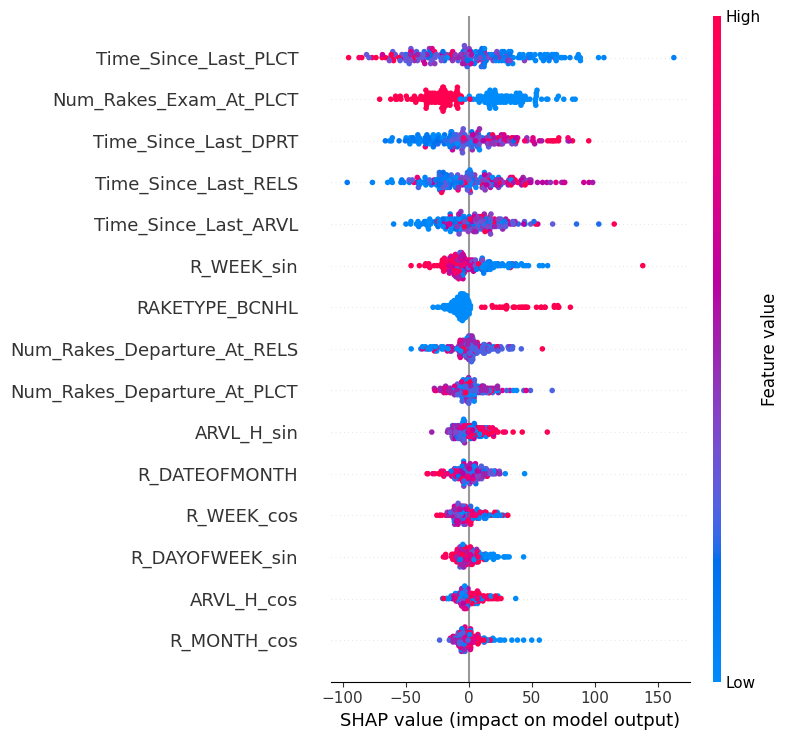

Displaying SHAP Force Plot for instance 0 for XGBoost_RL_TO_DP:


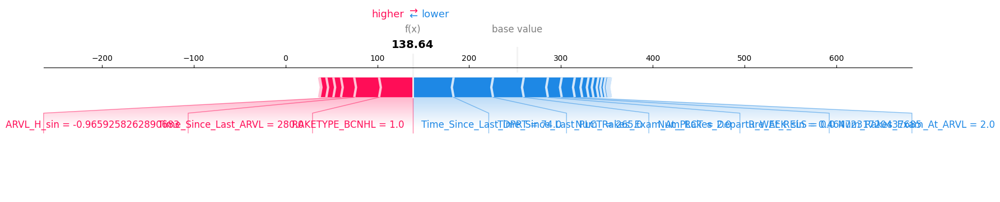


Actual prediction for instance 0: 138.64
Base (Expected) value for XGBoost_RL_TO_DP: 252.18
Interpretation: Red features push the prediction higher, blue features push it lower.

Displaying SHAP Dependence Plot for 'R_DATEOFMONTH' vs XGBoost_RL_TO_DP:


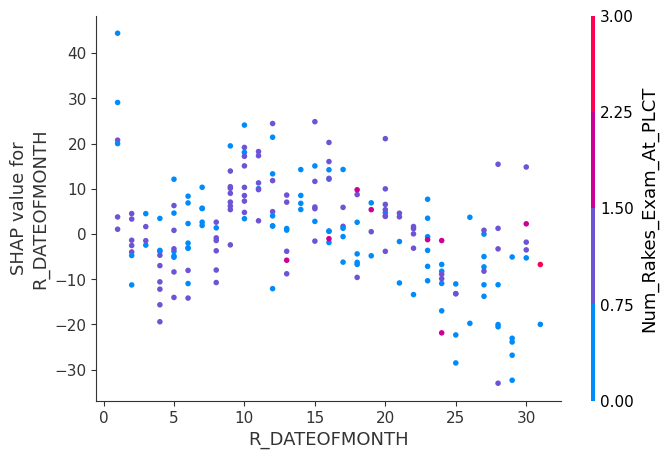

In [192]:
model_to_explain = models[target_to_explain[2]]

explainer1 = shap.TreeExplainer(model_to_explain)

num_samples_to_explain = min(200, X_test.shape[0])
shap_values = explainer1.shap_values(X_test.iloc[:num_samples_to_explain])

print(f"Explaining predictions for {target_to_explain[2]} for {num_samples_to_explain} samples from X_test.")

#Global SHAP Summary Plot (Beeswarm Plot)
print(f"Displaying SHAP Summary Plot for {target_to_explain[2]}:")
shap.summary_plot(shap_values, X_test.iloc[:num_samples_to_explain], plot_type="dot", max_display=15)
#plt.title(f'SHAP Summary for {target_to_explain[2]}')
plt.show()

# Local SHAP Force Plot (for a single prediction)
# Pick a specific instance to explain (e.g., the first one from your test set)
instance_index = 0
if num_samples_to_explain > instance_index:
    print(f"Displaying SHAP Force Plot for instance {instance_index} for {target_to_explain[2]}:")
    base_value = explainer1.expected_value
    shap.force_plot(base_value, shap_values[instance_index], X_test.iloc[instance_index], matplotlib=True)
    #plt.title(f'SHAP Force Plot for Instance {instance_index} ({target_to_explain[2]})')
    plt.show()

    actual_prediction = model_to_explain.predict(X_test.iloc[[instance_index]])[0]
    print(f"\nActual prediction for instance {instance_index}: {actual_prediction:.2f}")
    print(f"Base (Expected) value for {target_to_explain[2]}: {base_value:.2f}")
    print("Interpretation: Red features push the prediction higher, blue features push it lower.")
else:
    print(f"\nNot enough samples ({num_samples_to_explain}) to show force plot for instance {instance_index}. Need at least {instance_index + 1} samples.")

# SHAP Dependence Plot (Feature relationship)
# Example: How 'ARVL_H_sin' (placement hour) affects 'AR_TO_PL' duration.
# You can change 'feature_to_plot' to any other feature you're interested in.
feature_to_plot = 'R_DATEOFMONTH' # Try other features

if feature_to_plot in X_test.columns and num_samples_to_explain > 0:
    print(f"\nDisplaying SHAP Dependence Plot for '{feature_to_plot}' vs {target_to_explain[2]}:")
    shap.dependence_plot(feature_to_plot, shap_values, X_test.iloc[:num_samples_to_explain])
    #plt.title(f'SHAP Dependence Plot: {feature_to_plot} vs {target_to_explain[2]} (without TOTAL_TIME)')
    plt.show()
else:
    print(f"\nCannot create Dependence Plot: '{feature_to_plot}' not found in features or no samples to explain.")